In [1]:
import numpy as np 
import matplotlib.pyplot as plt
plt.style.use('fivethirtyeight')
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
from keras.models import Sequential
from keras.layers import Dense, LSTM, Dropout, GRU, Bidirectional
import math
from sklearn.metrics import mean_squared_error
%load_ext autoreload
%autoreload 2
%matplotlib inline
%config InlineBackend.figure_format='retina'

Using TensorFlow backend.
/Users/cheriehe/anaconda3/lib/python3.7/site-packages/tensorflow/python/framework/dtypes.py:526: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
/Users/cheriehe/anaconda3/lib/python3.7/site-packages/tensorflow/python/framework/dtypes.py:527: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
/Users/cheriehe/anaconda3/lib/python3.7/site-packages/tensorflow/python/framework/dtypes.py:528: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])
/Users/cheriehe/anaconda3/lib/python3.7/site-pa

In [2]:
# read the data
dataset = pd.read_csv('IBM.csv', index_col="Date")
dataset.head()

,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
1990-01-02,23.68750,24.53125,23.62500,24.50000,6.590755,7041600
1990-01-03,24.68750,24.87500,24.59375,24.71875,6.649599,9464000
1990-01-04,24.75000,25.09375,24.71875,25.00000,6.725261,9674800
1990-01-05,24.96875,25.40625,24.87500,24.93750,6.708448,7570000
1990-01-08,24.81250,25.21875,24.81250,25.09375,6.750481,4625200


In [54]:
# sz300 = pd.read_csv('上证指数_stocks_data.csv', index_col='date', parse_dates=['date'])
# sz300.head()

In [169]:
def get_stocks_data(stkname, code):    
    import baostock as bs

    #### 登陆系统 ####
    lg = bs.login()
    # 显示登陆返回信息
    print('login respond error_code:'+lg.error_code)
    print('login respond  error_msg:'+lg.error_msg)

    #### 获取历史K线数据 ####
    # 详细指标参数，参见“历史行情指标参数”章节
#     stkname = ["sz.002230", "sz.399905",'sz.002680']
    rs = []
    #### 打印结果集 ####
    data_list = []
    for i in range(len(code)):
        rs = bs.query_history_k_data_plus(code[i],
            "date,code,open,high,low,close,preclose,volume,amount,adjustflag,turn,tradestatus,pctChg,peTTM,pbMRQ,psTTM,pcfNcfTTM,isST",
            start_date='2012-01-01', end_date='2020-01-21', frequency="d", adjustflag="3") #frequency="d"取日k线，adjustflag="3"默认不复权

        while (rs.error_code == '0') & rs.next():
            # 获取一条记录，将记录合并在一起
            data_list.append(rs.get_row_data())
        result = pd.DataFrame(data_list, columns=rs.fields)
        #### 结果集输出到csv文件 ####
    filename = f'{stkname}_stocks_data.csv'
    result.to_csv(filename, encoding="gbk", index=False)
#     print(result)
    print('query_history_k_data_plus respond error_code:'+rs.error_code)
    print('query_history_k_data_plus respond  error_msg:'+rs.error_msg)
    return result

    #### 登出系统 ####
    bs.logout()

In [235]:
sz50=get_stocks_data('sz50', ['sh.000001'])
sz50.head()

login success!
login respond error_code:0
login respond  error_msg:success
query_history_k_data_plus respond error_code:0
query_history_k_data_plus respond  error_msg:success


,date,code,open,high,low,close,preclose,volume,amount,adjustflag,turn,tradestatus,pctChg,peTTM,pbMRQ,psTTM,pcfNcfTTM,isST
0,2012-01-04,sh.000001,2211.9950,2217.5200,2168.6440,2169.3900,2199.4170,4924553700,40632918502.0000,3,0.002748,1,-1.365230,,,,,0
1,2012-01-05,sh.000001,2160.8980,2183.4040,2145.5560,2148.4520,2169.3900,5874344700,46603965319.0000,3,0.003277,1,-0.965156,,,,,0
2,2012-01-06,sh.000001,2148.1470,2164.3220,2132.6260,2163.3950,2148.4520,5058305400,39465868149.0000,3,0.002819,1,0.695530,,,,,0
3,2012-01-09,sh.000001,2164.7410,2226.2180,2148.4530,2225.8900,2163.3950,7675983900,62132963469.0000,3,0.004277,1,2.888741,,,,,0
4,2012-01-10,sh.000001,2221.8320,2288.6280,2218.2750,2285.7440,2225.8900,10958541500,91045903375.0000,3,0.006106,1,2.688992,,,,,0


In [236]:
sz50['close']=sz50['close'].astype(float)
sz50.head()

,date,code,open,high,low,close,preclose,volume,amount,adjustflag,turn,tradestatus,pctChg,peTTM,pbMRQ,psTTM,pcfNcfTTM,isST
0,2012-01-04,sh.000001,2211.9950,2217.5200,2168.6440,2169.390,2199.4170,4924553700,40632918502.0000,3,0.002748,1,-1.365230,,,,,0
1,2012-01-05,sh.000001,2160.8980,2183.4040,2145.5560,2148.452,2169.3900,5874344700,46603965319.0000,3,0.003277,1,-0.965156,,,,,0
2,2012-01-06,sh.000001,2148.1470,2164.3220,2132.6260,2163.395,2148.4520,5058305400,39465868149.0000,3,0.002819,1,0.695530,,,,,0
3,2012-01-09,sh.000001,2164.7410,2226.2180,2148.4530,2225.890,2163.3950,7675983900,62132963469.0000,3,0.004277,1,2.888741,,,,,0
4,2012-01-10,sh.000001,2221.8320,2288.6280,2218.2750,2285.744,2225.8900,10958541500,91045903375.0000,3,0.006106,1,2.688992,,,,,0


In [237]:
sz50=sz50[['date','close']]
sz50.head()

,date,close
0,2012-01-04,2169.390
1,2012-01-05,2148.452
2,2012-01-06,2163.395
3,2012-01-09,2225.890
4,2012-01-10,2285.744


In [238]:
df=get_stocks_data('kdxf', ['sz.002230'])
df.head()

login success!
login respond error_code:0
login respond  error_msg:success
query_history_k_data_plus respond error_code:0
query_history_k_data_plus respond  error_msg:success


,date,code,open,high,low,close,preclose,volume,amount,adjustflag,turn,tradestatus,pctChg,peTTM,pbMRQ,psTTM,pcfNcfTTM,isST
0,2012-01-04,sz.002230,35.0000,35.2000,33.0000,33.5000,35.0000,868019,30010347.0200,3,0.418860,1,-4.285700,71.628247,7.583641,15.936456,22.912952,0
1,2012-01-05,sz.002230,33.4900,33.4900,30.1500,30.1500,33.5000,3097501,97316533.8900,3,1.494689,1,-10.000000,64.465422,6.825277,14.342810,20.621657,0
2,2012-01-06,sz.002230,29.6000,29.8400,27.1400,28.5000,30.1500,3647135,103079681.1100,3,1.759913,1,-5.472600,60.937464,6.451755,13.557880,19.493109,0
3,2012-01-09,sz.002230,28.5000,29.5000,27.8300,29.0000,28.5000,2763718,79535920.0200,3,1.333623,1,1.754400,62.006542,6.564943,13.795738,19.835093,0
4,2012-01-10,sz.002230,29.0100,30.8500,29.0000,30.4000,29.0000,4146728,125293761.8800,3,2.000990,1,4.827600,64.999961,6.881871,14.461739,20.792649,0


In [239]:
df=df[['date','close','volume','pctChg','peTTM','psTTM','pcfNcfTTM']]
df=pd.merge(df, sz50, how='left', on='date')

In [241]:
df.columns=['date','close','volume','pctChg','peTTM','psTTM','pcfNcfTTM','close_sz50']
df.head()

,date,close,volume,pctChg,peTTM,psTTM,pcfNcfTTM,close_sz50
0,2012-01-04,33.5000,868019,-4.285700,71.628247,15.936456,22.912952,2169.390
1,2012-01-05,30.1500,3097501,-10.000000,64.465422,14.342810,20.621657,2148.452
2,2012-01-06,28.5000,3647135,-5.472600,60.937464,13.557880,19.493109,2163.395
3,2012-01-09,29.0000,2763718,1.754400,62.006542,13.795738,19.835093,2225.890
4,2012-01-10,30.4000,4146728,4.827600,64.999961,14.461739,20.792649,2285.744


In [242]:
del df['date']
df=df.astype(float)

In [243]:
type(df['close'][0])

numpy.float64

In [178]:
# df = pd.read_csv('trainset.csv', index_col="date")
# df.head()

In [181]:
# df[df['date']=='2019-11-26']

In [182]:
len(df[959:])

1000

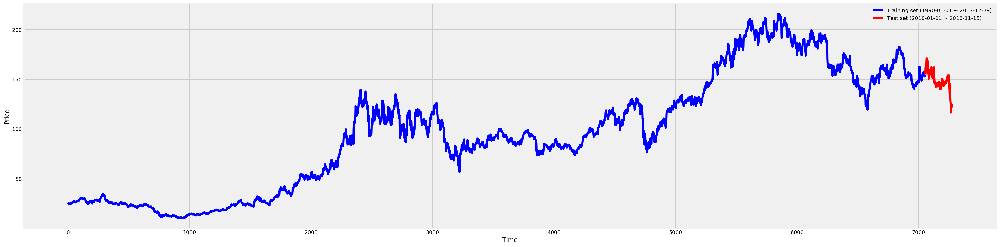

In [183]:
training_set = dataset[:'2017-12-29'].iloc[:,1:2].values
test_set = dataset['2018-01-02':].iloc[:,1:2].values
fig = plt.figure(figsize=(30,8))
plt.plot(training_set, color='blue', label='Training set (1990-01-01 ~ 2017-12-29)')
plt.plot(range(len(training_set),len(training_set)+len(test_set)),test_set, color='red', label='Test set (2018-01-01 ~ 2018-11-15)')
plt.xlabel('Time')
plt.ylabel('Price')
plt.legend()
plt.show()

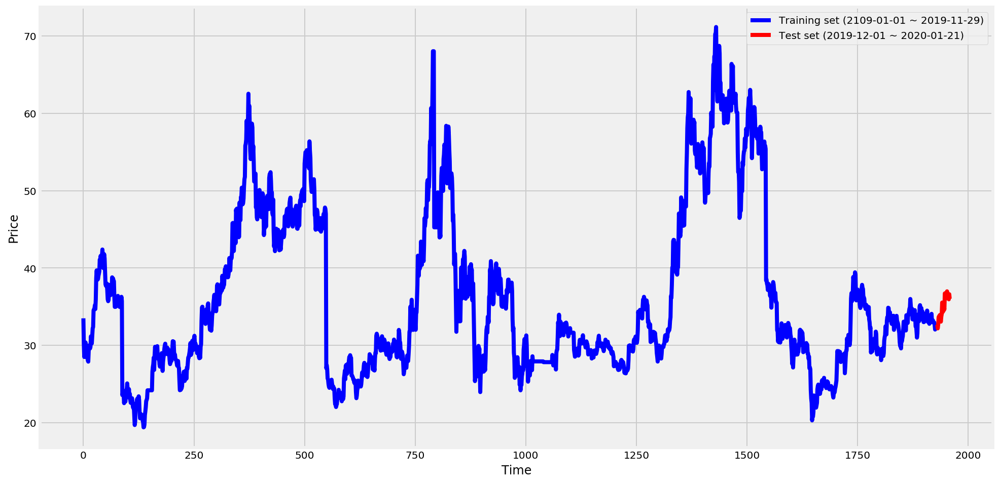

In [244]:
y_train = df['close'][:-30,].values
y_test = df['close'][-30:,].values
fig = plt.figure(figsize=(15,8))
plt.plot(range(len(y_train)),y_train, color='blue', label='Training set (2109-01-01 ~ 2019-11-29)')
plt.plot(range(len(y_train),len(y_train)+len(y_test)),y_test, color='red', label='Test set (2019-12-01 ~ 2020-01-21)')
plt.xlabel('Time')
plt.ylabel('Price')
plt.legend()
plt.show()

In [185]:
# del df['date']
df.head(2)

,close,volume,pctChg,peTTM,psTTM,pcfNcfTTM,close_sz50
0,33.50,868019.0,-4.2857,71.628247,15.936456,22.912952,NaN
1,30.15,3097501.0,-10.0000,64.465422,14.342810,20.621657,NaN


In [245]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1959 entries, 0 to 1958
Data columns (total 7 columns):
close         1959 non-null float64
volume        1959 non-null float64
pctChg        1959 non-null float64
peTTM         1959 non-null float64
psTTM         1959 non-null float64
pcfNcfTTM     1959 non-null float64
close_sz50    1959 non-null float64
dtypes: float64(7)
memory usage: 202.4 KB


In [301]:
y = df.iloc[:,0:1].values.astype(float)
x = df.iloc[:,:].values

In [296]:
type(y[0][0])

numpy.float64

In [297]:
y_=[]
for i in range(len(y)):
    y_.append(y[i][0])
y=np.array(y_)

In [303]:
# scaling the training set
scy = MinMaxScaler(feature_range=(0,1))
scx = MinMaxScaler(feature_range=(0,1))
y_scaled = scy.fit_transform(y)
x_scaled=scx.fit_transform(x)

print(f"{y_scaled[1]}\n\n{x_scaled[1]}")

[0.20760912]

[0.20760912 0.01608716 0.00088462 0.05361363 0.26414005 0.51698536
 0.0616972 ]


In [304]:
num = 60
X_1 = []
for i in range(len(x_scaled[num:])): 
    x=[]
    for j in range(num):
        x.extend(x_scaled[i:i+num].astype(float)[j])
    X_1.append(x)
    
len(X_1)

1899

In [305]:
len(X_1[0])

420

In [306]:
len(df)-num-30

1869

In [307]:
# create a data structure with 60 timesteps and 1 output, 
# so for each element of training set, there are 60 previous training set elements
# X_train = [] # feature
# y_train = [] # lable
# training_set length is 7056, it is the total days between 1990-01-01 and 2017-12-29, also is the rows in the csv file

X_train, y_train = np.array(X_1[:len(df)-30-num]), np.array(y_scaled[num:len(df)-30])

X_train = np.reshape(X_train, (X_train.shape[0], X_train.shape[1], 1))


In [308]:
# len(y_train)
y_train

array([[0.35245268],
       [0.33005021],
       [0.33082271],
       ...,
       [0.25067594],
       [0.25144844],
       [0.25376593]])

In [309]:
len(X_train)

1869

In [310]:
X_train.shape[1]

420

In [320]:
# LSTM
regressor = Sequential()
# firt LSTM layer
regressor.add(LSTM(units=80, return_sequences=True, input_shape=(X_train.shape[1],1)))
regressor.add(Dropout(0.2))
# second LSTM layer
regressor.add(LSTM(units=80, return_sequences=True))
regressor.add(Dropout(0.2))
# third LSTM layer
regressor.add(LSTM(units=80, return_sequences=True))
regressor.add(Dropout(0.2))
# fourth LSTM layer
regressor.add(LSTM(units=80, return_sequences=True))
regressor.add(Dropout(0.2))
# fifth LSTM layer
regressor.add(LSTM(units=80))
regressor.add(Dropout(0.2))
# output layer
regressor.add(Dense(units=1))
# compile the RNN
regressor.compile(optimizer='rmsprop', loss='mean_squared_error')
# fit to the training set
regressor.fit(X_train, y_train, epochs=150, batch_size=32)

Epoch 1/150
1869/1869 [==============================] - 95s 51ms/step - loss: 0.0456
Epoch 2/150
1869/1869 [==============================] - 97s 52ms/step - loss: 0.0276
Epoch 3/150
1869/1869 [==============================] - 129s 69ms/step - loss: 0.0191
Epoch 4/150
1869/1869 [==============================] - 119s 63ms/step - loss: 0.0174
Epoch 5/150
1869/1869 [==============================] - 119s 64ms/step - loss: 0.0161
Epoch 6/150
1869/1869 [==============================] - 106s 57ms/step - loss: 0.0153
Epoch 7/150
1869/1869 [==============================] - 111s 60ms/step - loss: 0.0143
Epoch 8/150
1869/1869 [==============================] - 123s 66ms/step - loss: 0.0144
Epoch 9/150
1869/1869 [==============================] - 108s 58ms/step - loss: 0.0142
Epoch 10/150
1869/1869 [==============================] - 106s 57ms/step - loss: 0.0136
Epoch 11/150
1869/1869 [==============================] - 121s 64ms/step - loss: 0.0133
Epoch 12/150
1869/1869 [===================

In [321]:
X_test = np.array(X_1[len(df)-30-num:])
X_test = np.reshape(X_test, (X_test.shape[0], X_test.shape[1],1))
LSTM_predicted_stock_price = regressor.predict(X_test)
LSTM_predicted_stock_price = scy.inverse_transform(LSTM_predicted_stock_price)
y_test = np.array(y[-30:])
# y_test= scy.inverse_transform(y_test)
print(f"prediction:{LSTM_predicted_stock_price}")

prediction:[[33.38469 ]
 [33.579903]
 [33.386444]
 [32.99148 ]
 [33.643585]
 [34.11034 ]
 [34.105877]
 [34.411457]
 [34.781727]
 [34.096577]
 [33.723366]
 [34.74571 ]
 [34.6898  ]
 [35.085293]
 [34.238873]
 [34.935833]
 [35.10526 ]
 [35.54403 ]
 [35.10098 ]
 [35.893135]
 [36.44701 ]
 [36.147137]
 [36.803345]
 [36.544373]
 [37.425022]
 [36.674538]
 [36.678375]
 [36.82288 ]
 [36.36395 ]
 [37.13332 ]]


In [322]:
LSTM_rmse = mean_squared_error(y_test, LSTM_predicted_stock_price)
print ("root mean squared error is {}.".format(LSTM_rmse))

root mean squared error is 0.5512958737049307.


In [323]:
# len(LSTM_predicted_stock_price)
len(y_test)

30

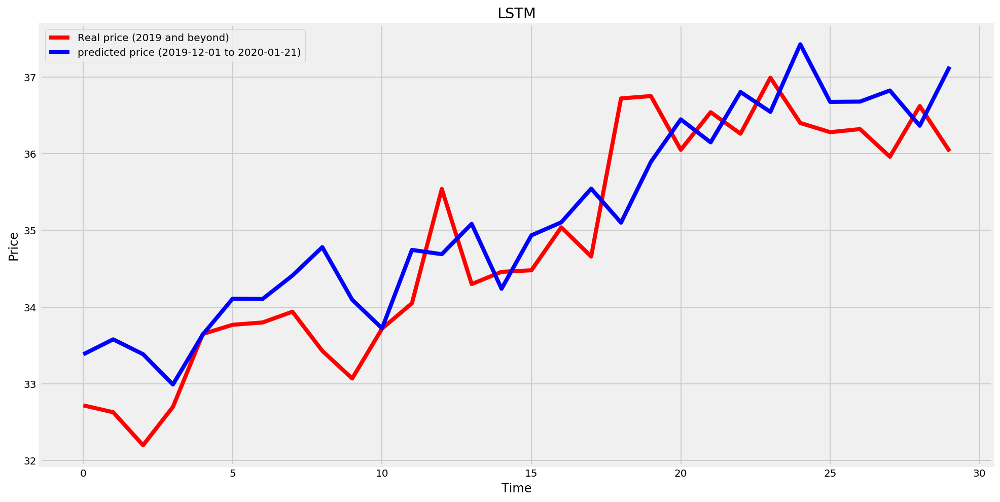

In [324]:
fig = plt.figure(figsize=(15,8))
plt.plot(y_test, color='red', label='Real price (2019 and beyond)')
plt.plot(LSTM_predicted_stock_price, color='blue', label='predicted price (2019-12-01 to 2020-01-21)')
plt.title('LSTM')
plt.xlabel('Time')
plt.ylabel('Price')
plt.legend()
plt.show()

In [37]:
def LSTM_model(num, x, y,paras, units,days):
    print(f"number of previous days in features: {num}\n")
    # scaling the training set
    scy = MinMaxScaler(feature_range=(0,1))
    scx = MinMaxScaler(feature_range=(0,1))
    y_scaled = scy.fit_transform(y)
    x_scaled=scx.fit_transform(x)
    print(f"y scales:{y_scaled[1]},\nx scaled:{x_scaled[1]}")
    X_1 = []
    for i in range(len(x_scaled[num:])): 
        x=[]
        for j in range(num):
            x.extend(x_scaled[i:i+num].astype(float)[j])
        X_1.append(x)
    print(f"\nlength of X_1:{len(X_1)}")
    
    X_train, y_train = np.array(X_1[:len(x_scaled)-days-num]), np.array(y_scaled[num:len(y)-days])
    print(f"\nlength of X train set is: {len(X_train)}\nlength of y train set is: {len(y_train)}\n")

    X_train = np.reshape(X_train, (X_train.shape[0], X_train.shape[1], 1))
    X_test = np.array(X_1[len(x_scaled)-days-num:])
    X_test = np.reshape(X_test, (X_test.shape[0], X_test.shape[1],1))
    y_test = np.array(y_scaled[len(y)-days:])
    y_test= scy.inverse_transform(y_test)
    

    for epochs,batch_size in paras:
        for unit in units:
#             run_model(epochs,batch_size,unit,X_train,y_train)
            print(f"--------------------------\nepochs is {epochs}\nbatch_size:{batch_size}\nunits num:{unit}\n--------------------------")
            LSTM_predicted_stock_price = run_model(epochs,batch_size,unit,X_train,y_train).predict(X_test)
            LSTM_predicted_stock_price = scy.inverse_transform(LSTM_predicted_stock_price)
            LSTM_rmse = mean_squared_error(y_test, LSTM_predicted_stock_price)
            print ("\n\nroot mean squared error is {}.\n\n".format(LSTM_rmse))
            create_plot(y_test,LSTM_predicted_stock_price)
    
def run_model(epochs,batch_size,units,X_train,y_train):
        # LSTM
    regressor = Sequential()
    # firt LSTM layer
    regressor.add(LSTM(units=units, return_sequences=True, input_shape=(X_train.shape[1],1)))
    regressor.add(Dropout(0.2))
    # second LSTM layer
    regressor.add(LSTM(units=units, return_sequences=True))
    regressor.add(Dropout(0.2))
    # third LSTM layer
    regressor.add(LSTM(units=units, return_sequences=True))
    regressor.add(Dropout(0.2))
    # fourth LSTM layer
    regressor.add(LSTM(units=units, return_sequences=True))
    regressor.add(Dropout(0.2))
    # fifth LSTM layer
    regressor.add(LSTM(units=units))
    regressor.add(Dropout(0.2))
    # output layer
    regressor.add(Dense(units=1))
    # compile the RNN
    regressor.compile(optimizer='rmsprop', loss='mean_squared_error')
    # fit to the training set
    regressor.fit(X_train, y_train, epochs=epochs, batch_size=batch_size)
    
    return regressor
    
def create_plot(y_test,LSTM_predicted_stock_price): 
    plt.plot(y_test, color='red', label='Real price (2019-01-01 to 2019-12-01)')
    plt.plot(LSTM_predicted_stock_price, color='blue', label='predicted price (2019-12-01 to 2020-01-21)')
    plt.title('LSTM Prediction')
    plt.xlabel('Date')
    plt.ylabel('Price')
    plt.legend()
    plt.show()

number of previous days in features: 5

y scales:[0.0277585],
x scaled:[0.0277585  0.21842857 0.6165454  0.15570526 0.09498607 0.68778477
 0.         0.16266492 0.12318841 0.48480243 0.11832947 0.07784431]

length of X_1:253

length of X train set is: 223
length of y train set is: 223

--------------------------
epochs is 50
batch_size:32
units num:50
--------------------------
Epoch 1/50
223/223 [==============================] - 14s 65ms/step - loss: 0.2337
Epoch 2/50
223/223 [==============================] - 3s 12ms/step - loss: 0.0257
Epoch 3/50
223/223 [==============================] - 3s 12ms/step - loss: 0.0226
Epoch 4/50
223/223 [==============================] - 2s 11ms/step - loss: 0.0219
Epoch 5/50
223/223 [==============================] - 2s 11ms/step - loss: 0.0247
Epoch 6/50
223/223 [==============================] - 2s 11ms/step - loss: 0.0270
Epoch 7/50
223/223 [==============================] - 3s 12ms/step - loss: 0.0340
Epoch 8/50
223/223 [========================

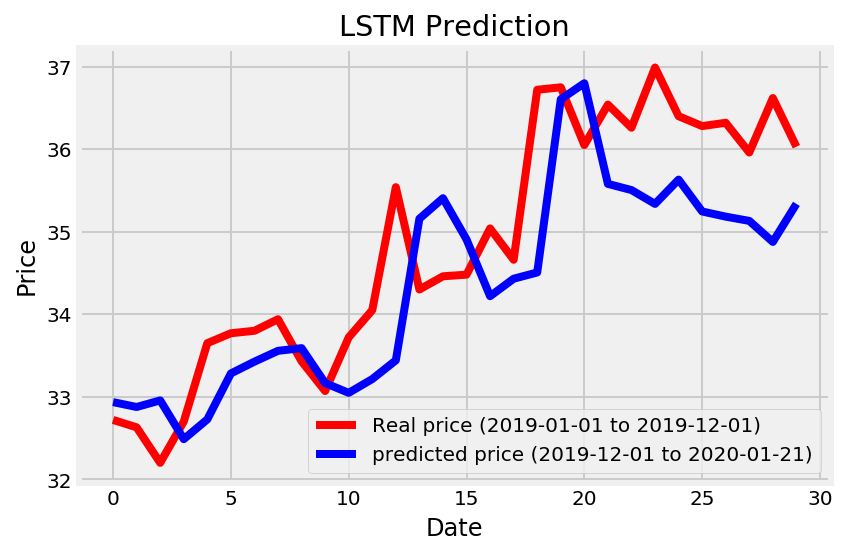

--------------------------
epochs is 50
batch_size:32
units num:80
--------------------------
Epoch 1/50
223/223 [==============================] - 17s 76ms/step - loss: 0.2086
Epoch 2/50
223/223 [==============================] - 3s 13ms/step - loss: 0.0286
Epoch 3/50
223/223 [==============================] - 3s 13ms/step - loss: 0.0237
Epoch 4/50
223/223 [==============================] - 3s 13ms/step - loss: 0.0245
Epoch 5/50
223/223 [==============================] - 3s 13ms/step - loss: 0.0302
Epoch 6/50
223/223 [==============================] - 3s 13ms/step - loss: 0.0333
Epoch 7/50
223/223 [==============================] - 3s 13ms/step - loss: 0.0470
Epoch 8/50
223/223 [==============================] - 3s 14ms/step - loss: 0.0370
Epoch 9/50
223/223 [==============================] - 3s 13ms/step - loss: 0.0350
Epoch 10/50
223/223 [==============================] - 3s 13ms/step - loss: 0.0277
Epoch 11/50
223/223 [==============================] - 3s 14ms/step - loss: 0.0414
E

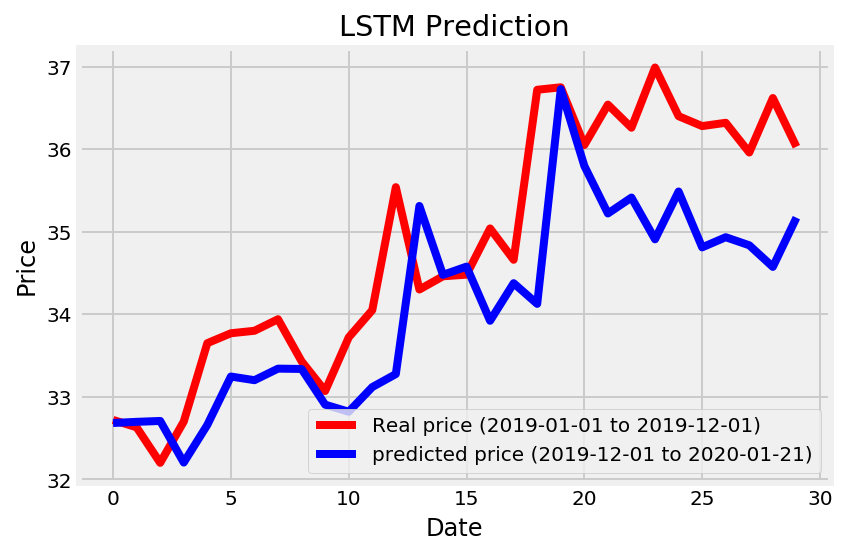

--------------------------
epochs is 50
batch_size:32
units num:110
--------------------------
Epoch 1/50
223/223 [==============================] - 31s 138ms/step - loss: 0.6156
Epoch 2/50
223/223 [==============================] - 4s 20ms/step - loss: 0.0273
Epoch 3/50
223/223 [==============================] - 4s 19ms/step - loss: 0.0239
Epoch 4/50
223/223 [==============================] - 4s 17ms/step - loss: 0.0206
Epoch 5/50
223/223 [==============================] - 4s 16ms/step - loss: 0.0341
Epoch 6/50
223/223 [==============================] - 4s 16ms/step - loss: 0.0280
Epoch 7/50
223/223 [==============================] - 4s 16ms/step - loss: 0.0234
Epoch 8/50
223/223 [==============================] - 4s 16ms/step - loss: 0.0528
Epoch 9/50
223/223 [==============================] - 4s 16ms/step - loss: 0.0220
Epoch 10/50
223/223 [==============================] - 3s 16ms/step - loss: 0.0329
Epoch 11/50
223/223 [==============================] - 3s 15ms/step - loss: 0.0482

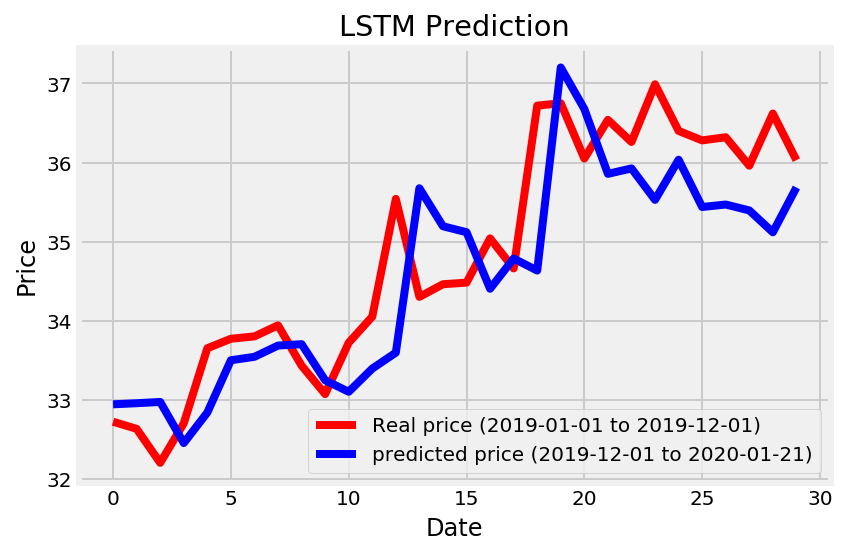

--------------------------
epochs is 80
batch_size:32
units num:50
--------------------------
Epoch 1/80
223/223 [==============================] - 19s 87ms/step - loss: 0.2179
Epoch 2/80
223/223 [==============================] - 2s 11ms/step - loss: 0.0259
Epoch 3/80
223/223 [==============================] - 3s 11ms/step - loss: 0.0243
Epoch 4/80
223/223 [==============================] - 3s 11ms/step - loss: 0.0251
Epoch 5/80
223/223 [==============================] - 3s 11ms/step - loss: 0.0259
Epoch 6/80
223/223 [==============================] - 3s 12ms/step - loss: 0.0391
Epoch 7/80
223/223 [==============================] - 3s 12ms/step - loss: 0.0257
Epoch 8/80
223/223 [==============================] - 3s 12ms/step - loss: 0.0297
Epoch 9/80
223/223 [==============================] - 3s 11ms/step - loss: 0.0267
Epoch 10/80
223/223 [==============================] - 3s 11ms/step - loss: 0.0376
Epoch 11/80
223/223 [==============================] - 3s 12ms/step - loss: 0.0219
E

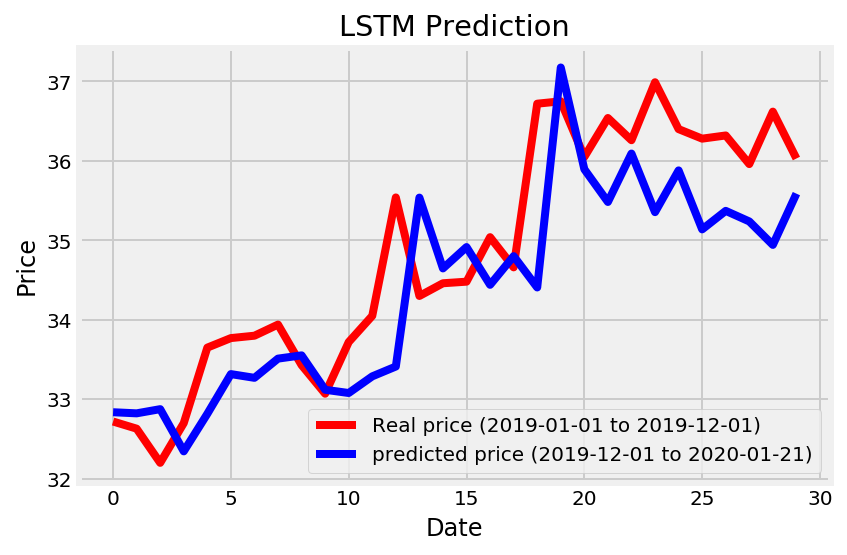

--------------------------
epochs is 80
batch_size:32
units num:80
--------------------------
Epoch 1/80
223/223 [==============================] - 19s 84ms/step - loss: 0.2165
Epoch 2/80
223/223 [==============================] - 3s 12ms/step - loss: 0.0297
Epoch 3/80
223/223 [==============================] - 3s 12ms/step - loss: 0.0226
Epoch 4/80
223/223 [==============================] - 3s 12ms/step - loss: 0.0261
Epoch 5/80
223/223 [==============================] - 3s 12ms/step - loss: 0.0318
Epoch 6/80
223/223 [==============================] - 3s 12ms/step - loss: 0.0420
Epoch 7/80
223/223 [==============================] - 3s 12ms/step - loss: 0.0347
Epoch 8/80
223/223 [==============================] - 3s 12ms/step - loss: 0.0213
Epoch 9/80
223/223 [==============================] - 3s 12ms/step - loss: 0.0447
Epoch 10/80
223/223 [==============================] - 3s 13ms/step - loss: 0.0352
Epoch 11/80
223/223 [==============================] - 3s 12ms/step - loss: 0.0361
E

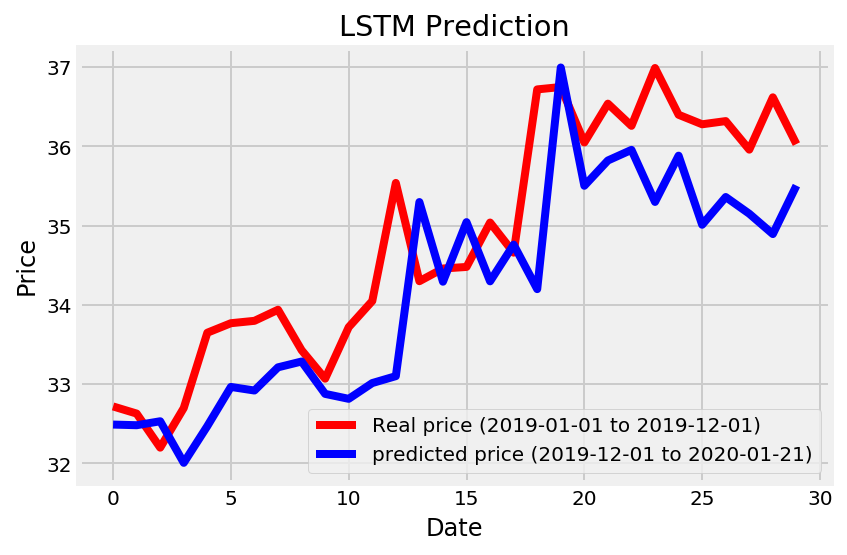

--------------------------
epochs is 80
batch_size:32
units num:110
--------------------------
Epoch 1/80
223/223 [==============================] - 8s 34ms/step - loss: 2.0141
Epoch 2/80
223/223 [==============================] - 1s 6ms/step - loss: 0.0293
Epoch 3/80
223/223 [==============================] - 1s 6ms/step - loss: 0.0209
Epoch 4/80
223/223 [==============================] - 1s 6ms/step - loss: 0.0213
Epoch 5/80
223/223 [==============================] - 1s 6ms/step - loss: 0.0227
Epoch 6/80
223/223 [==============================] - 1s 7ms/step - loss: 0.0232
Epoch 7/80
223/223 [==============================] - 2s 7ms/step - loss: 0.0258
Epoch 8/80
223/223 [==============================] - 2s 7ms/step - loss: 0.0355
Epoch 9/80
223/223 [==============================] - 2s 7ms/step - loss: 0.0290
Epoch 10/80
223/223 [==============================] - 2s 7ms/step - loss: 0.0233
Epoch 11/80
223/223 [==============================] - 2s 7ms/step - loss: 0.0640
Epoch 12/80

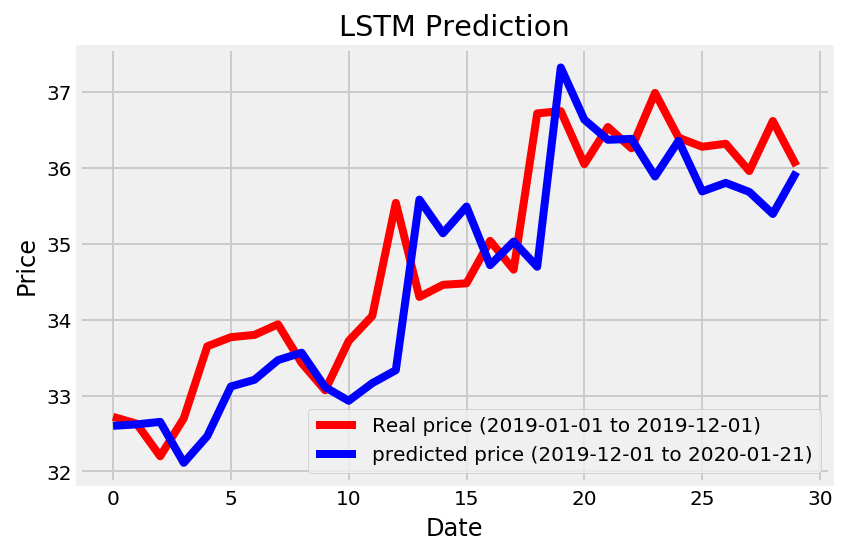

--------------------------
epochs is 110
batch_size:32
units num:50
--------------------------
Epoch 1/110
223/223 [==============================] - 8s 34ms/step - loss: 0.2143
Epoch 2/110
223/223 [==============================] - 1s 5ms/step - loss: 0.0228
Epoch 3/110
223/223 [==============================] - 1s 5ms/step - loss: 0.0238
Epoch 4/110
223/223 [==============================] - 1s 5ms/step - loss: 0.0234
Epoch 5/110
223/223 [==============================] - 1s 5ms/step - loss: 0.0219
Epoch 6/110
223/223 [==============================] - 1s 5ms/step - loss: 0.0316
Epoch 7/110
223/223 [==============================] - 1s 5ms/step - loss: 0.0367
Epoch 8/110
223/223 [==============================] - 1s 6ms/step - loss: 0.0292
Epoch 9/110
223/223 [==============================] - 1s 6ms/step - loss: 0.0324
Epoch 10/110
223/223 [==============================] - 1s 6ms/step - loss: 0.0321
Epoch 11/110
223/223 [==============================] - 1s 6ms/step - loss: 0.0215


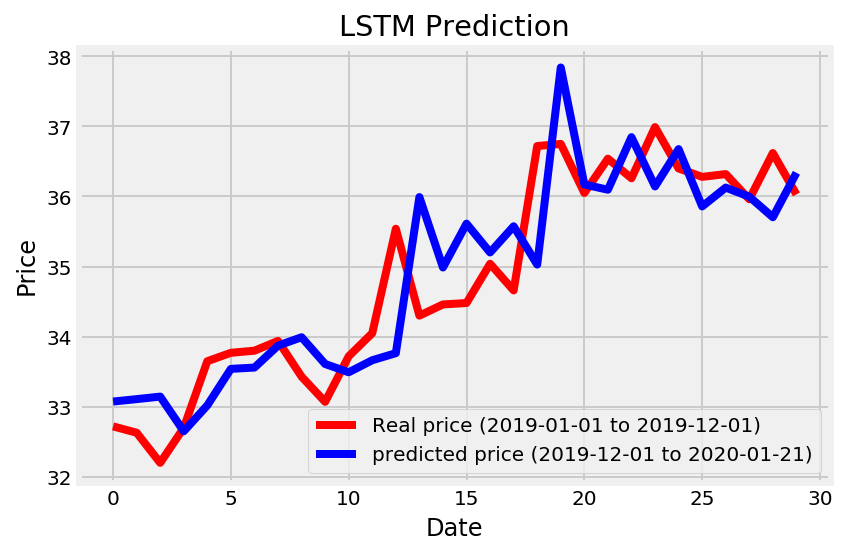

--------------------------
epochs is 110
batch_size:32
units num:80
--------------------------
Epoch 1/110
223/223 [==============================] - 8s 36ms/step - loss: 0.1919
Epoch 2/110
223/223 [==============================] - 1s 5ms/step - loss: 0.0223
Epoch 3/110
223/223 [==============================] - 1s 5ms/step - loss: 0.0295
Epoch 4/110
223/223 [==============================] - 1s 5ms/step - loss: 0.0285
Epoch 5/110
223/223 [==============================] - 1s 5ms/step - loss: 0.0318
Epoch 6/110
223/223 [==============================] - 1s 5ms/step - loss: 0.0414
Epoch 7/110
223/223 [==============================] - 1s 6ms/step - loss: 0.0184
Epoch 8/110
223/223 [==============================] - 1s 6ms/step - loss: 0.0684
Epoch 9/110
223/223 [==============================] - 1s 6ms/step - loss: 0.0232
Epoch 10/110
223/223 [==============================] - 1s 6ms/step - loss: 0.0220
Epoch 11/110
223/223 [==============================] - 1s 6ms/step - loss: 0.0297


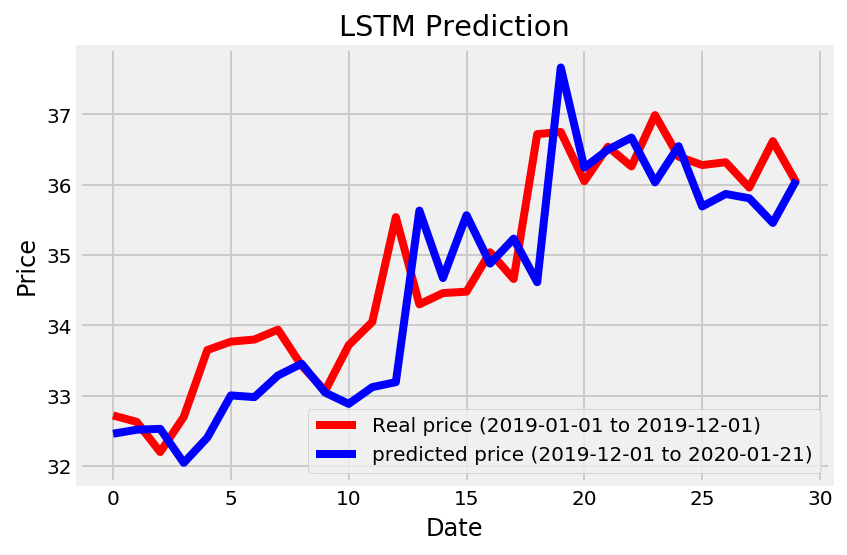

--------------------------
epochs is 110
batch_size:32
units num:110
--------------------------
Epoch 1/110
223/223 [==============================] - 9s 38ms/step - loss: 1.4789
Epoch 2/110
223/223 [==============================] - 1s 6ms/step - loss: 0.0423
Epoch 3/110
223/223 [==============================] - 1s 6ms/step - loss: 0.0206
Epoch 4/110
223/223 [==============================] - 1s 6ms/step - loss: 0.0245
Epoch 5/110
223/223 [==============================] - 1s 6ms/step - loss: 0.0216
Epoch 6/110
223/223 [==============================] - 1s 6ms/step - loss: 0.0284
Epoch 7/110
223/223 [==============================] - 1s 6ms/step - loss: 0.0236
Epoch 8/110
223/223 [==============================] - 1s 6ms/step - loss: 0.0272
Epoch 9/110
223/223 [==============================] - 1s 6ms/step - loss: 0.0344
Epoch 10/110
223/223 [==============================] - 1s 6ms/step - loss: 0.0379
Epoch 11/110
223/223 [==============================] - 1s 6ms/step - loss: 0.0324

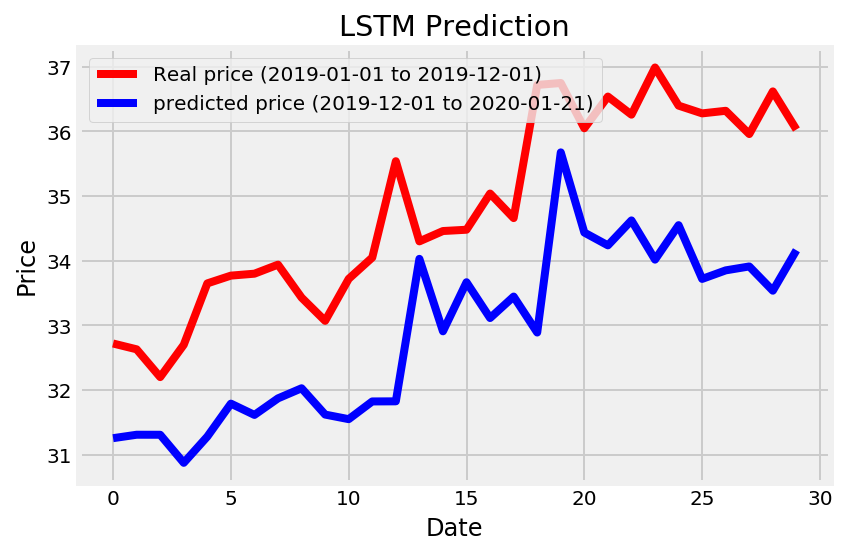

--------------------------
epochs is 150
batch_size:32
units num:50
--------------------------
Epoch 1/150
223/223 [==============================] - 9s 40ms/step - loss: 0.2866
Epoch 2/150
223/223 [==============================] - 1s 5ms/step - loss: 0.0291
Epoch 3/150
223/223 [==============================] - 1s 5ms/step - loss: 0.0200
Epoch 4/150
223/223 [==============================] - 1s 5ms/step - loss: 0.0199
Epoch 5/150
223/223 [==============================] - 1s 5ms/step - loss: 0.0183
Epoch 6/150
223/223 [==============================] - 1s 5ms/step - loss: 0.0224
Epoch 7/150
223/223 [==============================] - 1s 5ms/step - loss: 0.0240
Epoch 8/150
223/223 [==============================] - 1s 5ms/step - loss: 0.0596
Epoch 9/150
223/223 [==============================] - 1s 5ms/step - loss: 0.0194
Epoch 10/150
223/223 [==============================] - 1s 6ms/step - loss: 0.0267
Epoch 11/150
223/223 [==============================] - 1s 6ms/step - loss: 0.0306


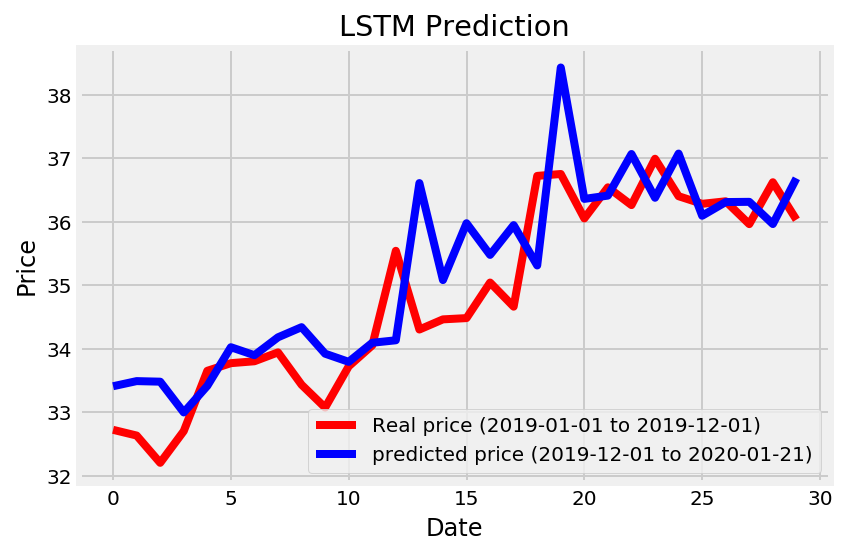

--------------------------
epochs is 150
batch_size:32
units num:80
--------------------------
Epoch 1/150
223/223 [==============================] - 9s 41ms/step - loss: 0.2342
Epoch 2/150
223/223 [==============================] - 1s 5ms/step - loss: 0.0263
Epoch 3/150
223/223 [==============================] - 1s 5ms/step - loss: 0.0236
Epoch 4/150
223/223 [==============================] - 1s 5ms/step - loss: 0.0267
Epoch 5/150
223/223 [==============================] - 1s 5ms/step - loss: 0.0299
Epoch 6/150
223/223 [==============================] - 1s 5ms/step - loss: 0.0320
Epoch 7/150
223/223 [==============================] - 1s 5ms/step - loss: 0.0390
Epoch 8/150
223/223 [==============================] - 1s 5ms/step - loss: 0.0379
Epoch 9/150
223/223 [==============================] - 1s 5ms/step - loss: 0.0452
Epoch 10/150
223/223 [==============================] - 1s 5ms/step - loss: 0.0265
Epoch 11/150
223/223 [==============================] - 1s 5ms/step - loss: 0.0326


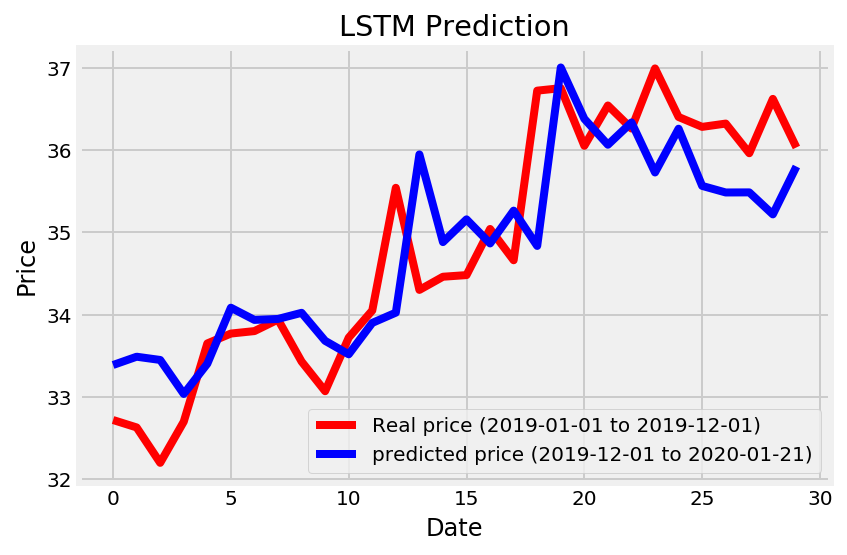

--------------------------
epochs is 150
batch_size:32
units num:110
--------------------------
Epoch 1/150
223/223 [==============================] - 10s 44ms/step - loss: 0.4636
Epoch 2/150
223/223 [==============================] - 1s 6ms/step - loss: 0.0388
Epoch 3/150
223/223 [==============================] - 1s 6ms/step - loss: 0.0213
Epoch 4/150
223/223 [==============================] - 1s 6ms/step - loss: 0.0276
Epoch 5/150
223/223 [==============================] - 1s 6ms/step - loss: 0.0334
Epoch 6/150
223/223 [==============================] - 1s 6ms/step - loss: 0.0313
Epoch 7/150
223/223 [==============================] - 1s 6ms/step - loss: 0.0230
Epoch 8/150
223/223 [==============================] - 1s 6ms/step - loss: 0.0373
Epoch 9/150
223/223 [==============================] - 1s 6ms/step - loss: 0.0477
Epoch 10/150
223/223 [==============================] - 1s 6ms/step - loss: 0.0412
Epoch 11/150
223/223 [==============================] - 1s 6ms/step - loss: 0.022

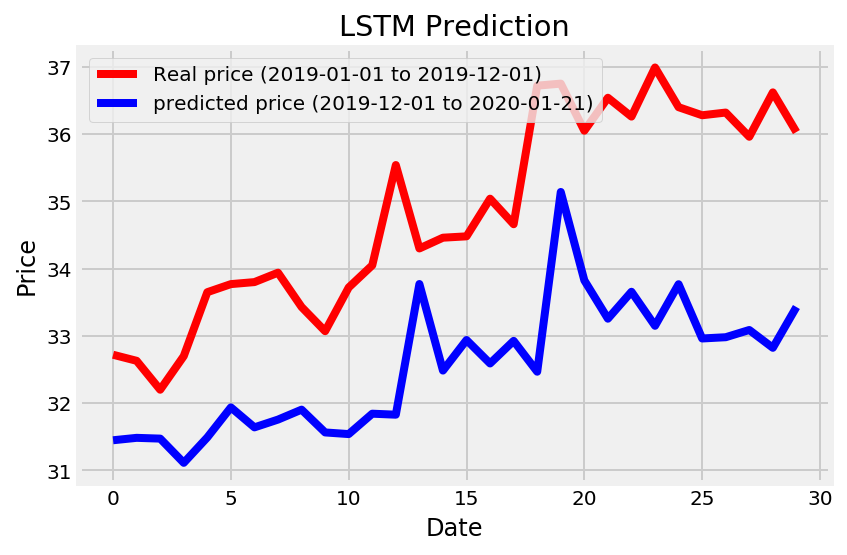

--------------------------
epochs is 50
batch_size:64
units num:50
--------------------------
Epoch 1/50
223/223 [==============================] - 10s 44ms/step - loss: 0.2160
Epoch 2/50
223/223 [==============================] - 1s 3ms/step - loss: 0.0647
Epoch 3/50
223/223 [==============================] - 1s 3ms/step - loss: 0.0234
Epoch 4/50
223/223 [==============================] - 1s 3ms/step - loss: 0.0234
Epoch 5/50
223/223 [==============================] - 1s 3ms/step - loss: 0.0257
Epoch 6/50
223/223 [==============================] - 1s 3ms/step - loss: 0.0209
Epoch 7/50
223/223 [==============================] - 1s 3ms/step - loss: 0.0329
Epoch 8/50
223/223 [==============================] - 1s 3ms/step - loss: 0.0280
Epoch 9/50
223/223 [==============================] - 1s 4ms/step - loss: 0.0288
Epoch 10/50
223/223 [==============================] - 1s 4ms/step - loss: 0.0461
Epoch 11/50
223/223 [==============================] - 1s 4ms/step - loss: 0.0242
Epoch 12/50

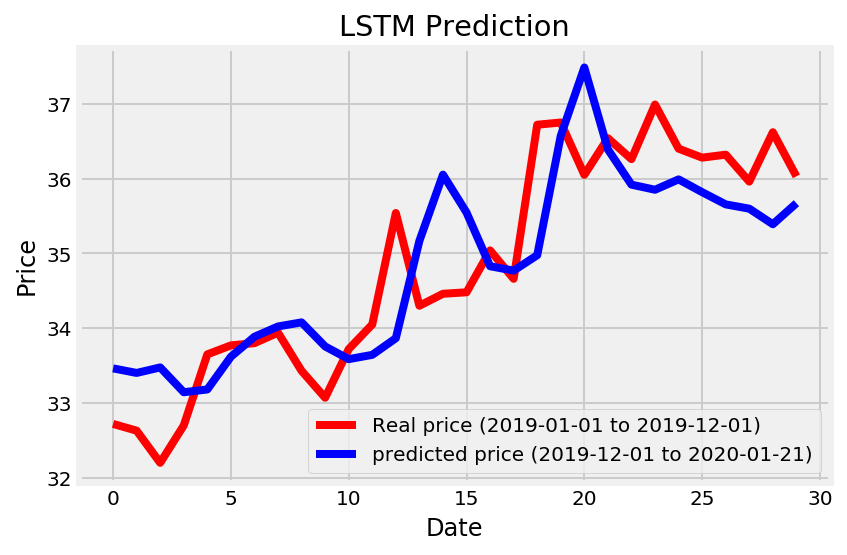

--------------------------
epochs is 50
batch_size:64
units num:80
--------------------------
Epoch 1/50
223/223 [==============================] - 12s 53ms/step - loss: 0.3767
Epoch 2/50
223/223 [==============================] - 1s 4ms/step - loss: 0.0931
Epoch 3/50
223/223 [==============================] - 1s 4ms/step - loss: 0.0220
Epoch 4/50
223/223 [==============================] - 1s 4ms/step - loss: 0.0260
Epoch 5/50
223/223 [==============================] - 1s 4ms/step - loss: 0.0206
Epoch 6/50
223/223 [==============================] - 1s 4ms/step - loss: 0.0255
Epoch 7/50
223/223 [==============================] - 1s 5ms/step - loss: 0.0193
Epoch 8/50
223/223 [==============================] - 1s 5ms/step - loss: 0.0452
Epoch 9/50
223/223 [==============================] - 1s 5ms/step - loss: 0.0278
Epoch 10/50
223/223 [==============================] - 1s 5ms/step - loss: 0.0191
Epoch 11/50
223/223 [==============================] - 1s 5ms/step - loss: 0.0342
Epoch 12/50

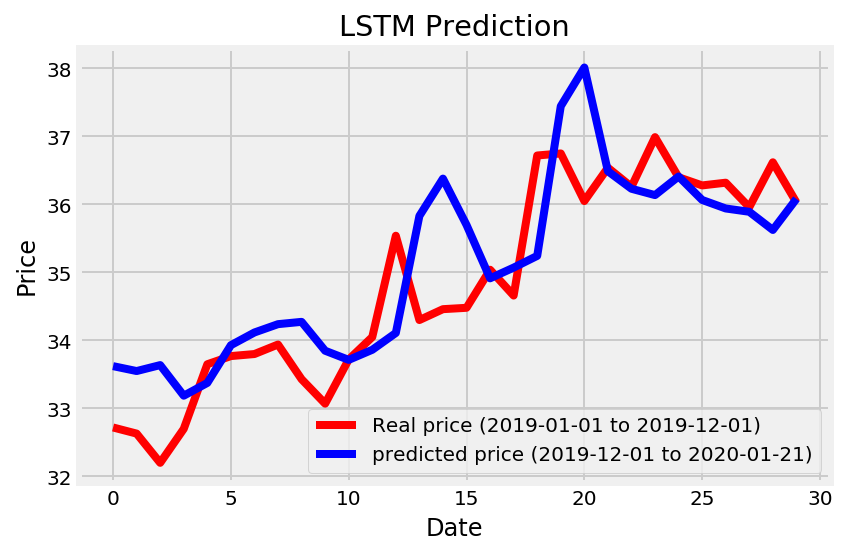

--------------------------
epochs is 50
batch_size:64
units num:110
--------------------------
Epoch 1/50
223/223 [==============================] - 13s 57ms/step - loss: 2.6772
Epoch 2/50
223/223 [==============================] - 1s 5ms/step - loss: 0.0522
Epoch 3/50
223/223 [==============================] - 1s 5ms/step - loss: 0.0236
Epoch 4/50
223/223 [==============================] - 1s 5ms/step - loss: 0.0217
Epoch 5/50
223/223 [==============================] - 1s 6ms/step - loss: 0.0229
Epoch 6/50
223/223 [==============================] - 1s 5ms/step - loss: 0.0239
Epoch 7/50
223/223 [==============================] - 1s 6ms/step - loss: 0.0194
Epoch 8/50
223/223 [==============================] - 1s 5ms/step - loss: 0.0317
Epoch 9/50
223/223 [==============================] - 1s 6ms/step - loss: 0.0190
Epoch 10/50
223/223 [==============================] - 1s 6ms/step - loss: 0.0186
Epoch 11/50
223/223 [==============================] - 1s 6ms/step - loss: 0.0403
Epoch 12/5

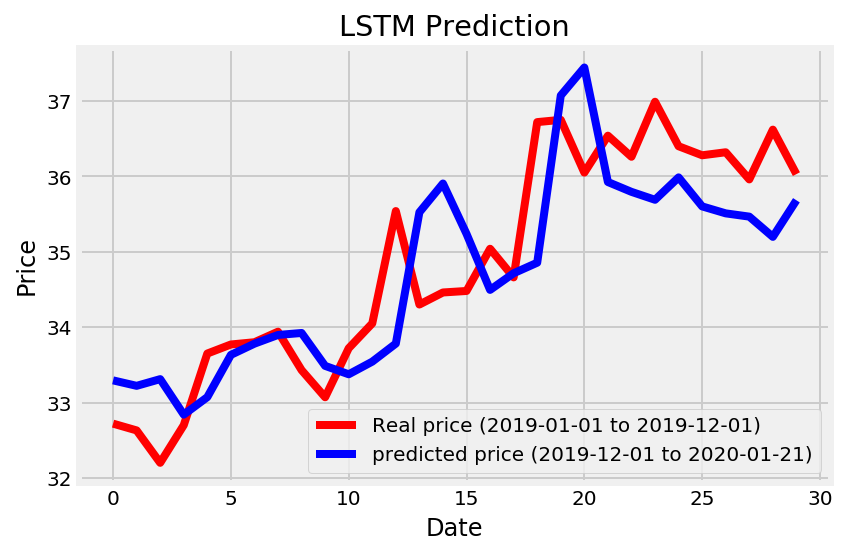

--------------------------
epochs is 80
batch_size:64
units num:50
--------------------------
Epoch 1/80
223/223 [==============================] - 12s 55ms/step - loss: 0.3281
Epoch 2/80
223/223 [==============================] - 1s 3ms/step - loss: 0.0678
Epoch 3/80
223/223 [==============================] - 1s 3ms/step - loss: 0.0291
Epoch 4/80
223/223 [==============================] - 1s 3ms/step - loss: 0.0238
Epoch 5/80
223/223 [==============================] - 1s 4ms/step - loss: 0.0222
Epoch 6/80
223/223 [==============================] - 1s 4ms/step - loss: 0.0204
Epoch 7/80
223/223 [==============================] - 1s 4ms/step - loss: 0.0212
Epoch 8/80
223/223 [==============================] - 1s 4ms/step - loss: 0.0217
Epoch 9/80
223/223 [==============================] - 1s 4ms/step - loss: 0.0317
Epoch 10/80
223/223 [==============================] - 1s 4ms/step - loss: 0.0217
Epoch 11/80
223/223 [==============================] - 1s 5ms/step - loss: 0.0253
Epoch 12/80

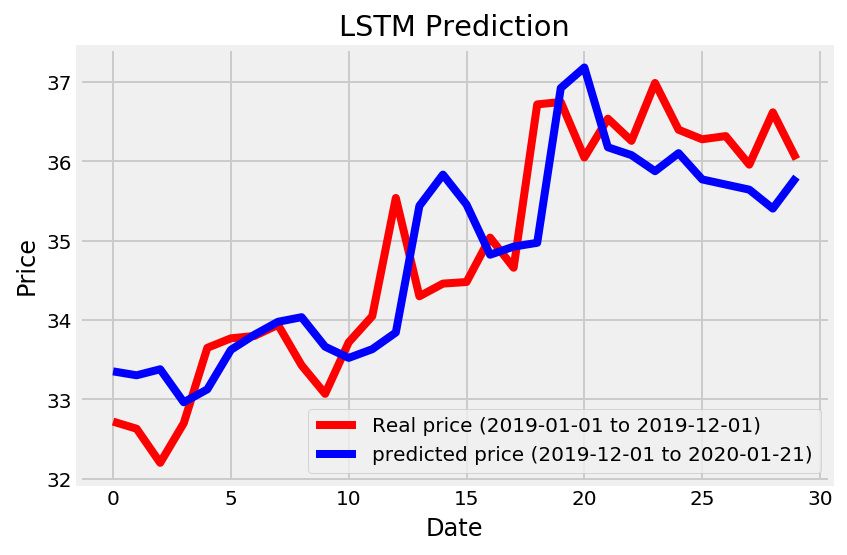

--------------------------
epochs is 80
batch_size:64
units num:80
--------------------------
Epoch 1/80
223/223 [==============================] - 12s 54ms/step - loss: 0.2267
Epoch 2/80
223/223 [==============================] - 1s 3ms/step - loss: 0.0776
Epoch 3/80
223/223 [==============================] - 1s 3ms/step - loss: 0.0287
Epoch 4/80
223/223 [==============================] - 1s 3ms/step - loss: 0.0223
Epoch 5/80
223/223 [==============================] - 1s 3ms/step - loss: 0.0262
Epoch 6/80
223/223 [==============================] - 1s 3ms/step - loss: 0.0223
Epoch 7/80
223/223 [==============================] - 1s 3ms/step - loss: 0.0544
Epoch 8/80
223/223 [==============================] - 1s 3ms/step - loss: 0.0352
Epoch 9/80
223/223 [==============================] - 1s 4ms/step - loss: 0.0225
Epoch 10/80
223/223 [==============================] - 1s 4ms/step - loss: 0.0381
Epoch 11/80
223/223 [==============================] - 1s 4ms/step - loss: 0.0531
Epoch 12/80

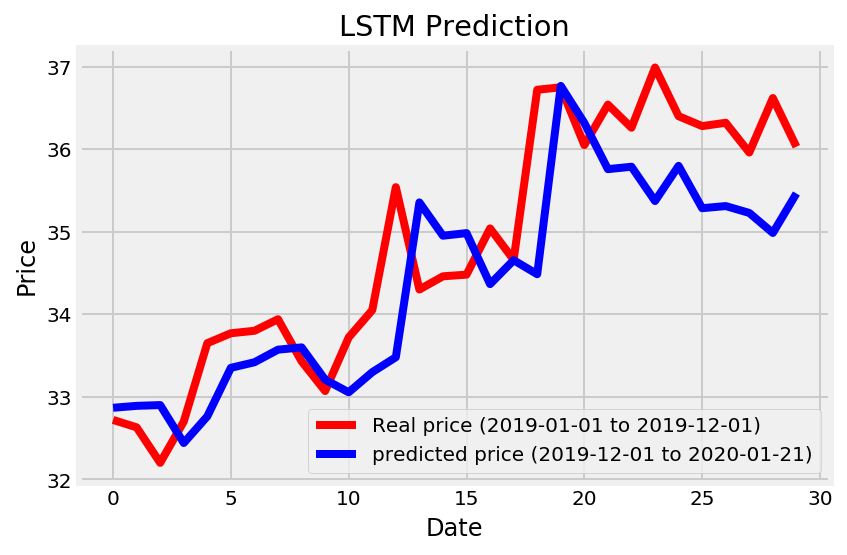

--------------------------
epochs is 80
batch_size:64
units num:110
--------------------------
Epoch 1/80
223/223 [==============================] - 14s 61ms/step - loss: 2.4658
Epoch 2/80
223/223 [==============================] - 1s 4ms/step - loss: 0.1061
Epoch 3/80
223/223 [==============================] - 1s 5ms/step - loss: 0.0339
Epoch 4/80
223/223 [==============================] - 1s 5ms/step - loss: 0.0224
Epoch 5/80
223/223 [==============================] - 1s 5ms/step - loss: 0.0216
Epoch 6/80
223/223 [==============================] - 1s 5ms/step - loss: 0.0207
Epoch 7/80
223/223 [==============================] - 1s 5ms/step - loss: 0.0201
Epoch 8/80
223/223 [==============================] - 1s 5ms/step - loss: 0.0191
Epoch 9/80
223/223 [==============================] - 1s 5ms/step - loss: 0.0284
Epoch 10/80
223/223 [==============================] - 1s 6ms/step - loss: 0.0282
Epoch 11/80
223/223 [==============================] - 1s 6ms/step - loss: 0.0266
Epoch 12/8

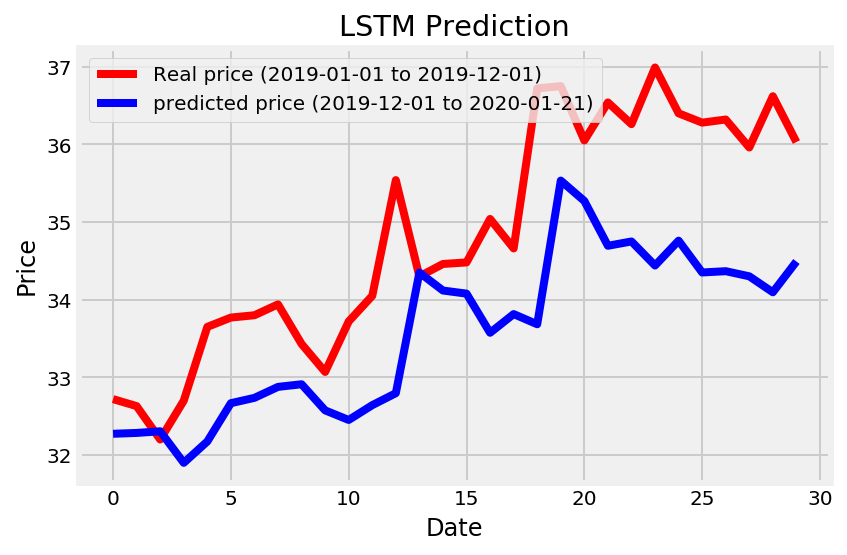

--------------------------
epochs is 110
batch_size:64
units num:50
--------------------------
Epoch 1/110
223/223 [==============================] - 13s 59ms/step - loss: 0.3124
Epoch 2/110
223/223 [==============================] - 1s 3ms/step - loss: 0.0733
Epoch 3/110
223/223 [==============================] - 1s 3ms/step - loss: 0.0284
Epoch 4/110
223/223 [==============================] - 1s 4ms/step - loss: 0.0226
Epoch 5/110
223/223 [==============================] - 1s 3ms/step - loss: 0.0210
Epoch 6/110
223/223 [==============================] - 1s 3ms/step - loss: 0.0227
Epoch 7/110
223/223 [==============================] - 1s 3ms/step - loss: 0.0239
Epoch 8/110
223/223 [==============================] - 1s 3ms/step - loss: 0.0225
Epoch 9/110
223/223 [==============================] - 1s 4ms/step - loss: 0.0208
Epoch 10/110
223/223 [==============================] - 1s 4ms/step - loss: 0.0192
Epoch 11/110
223/223 [==============================] - 1s 4ms/step - loss: 0.0381

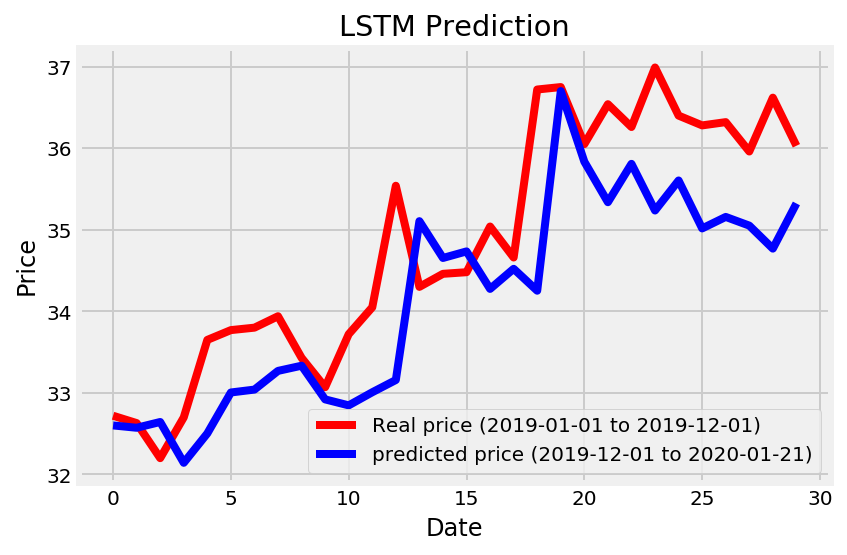

--------------------------
epochs is 110
batch_size:64
units num:80
--------------------------
Epoch 1/110
223/223 [==============================] - 14s 65ms/step - loss: 0.5099
Epoch 2/110
223/223 [==============================] - 1s 4ms/step - loss: 0.1177
Epoch 3/110
223/223 [==============================] - 1s 4ms/step - loss: 0.0315
Epoch 4/110
223/223 [==============================] - 1s 4ms/step - loss: 0.0228
Epoch 5/110
223/223 [==============================] - 1s 4ms/step - loss: 0.0229
Epoch 6/110
223/223 [==============================] - 1s 4ms/step - loss: 0.0202
Epoch 7/110
223/223 [==============================] - 1s 5ms/step - loss: 0.0210
Epoch 8/110
223/223 [==============================] - 1s 4ms/step - loss: 0.0238
Epoch 9/110
223/223 [==============================] - 1s 5ms/step - loss: 0.0292
Epoch 10/110
223/223 [==============================] - 1s 5ms/step - loss: 0.0225
Epoch 11/110
223/223 [==============================] - 1s 5ms/step - loss: 0.0353

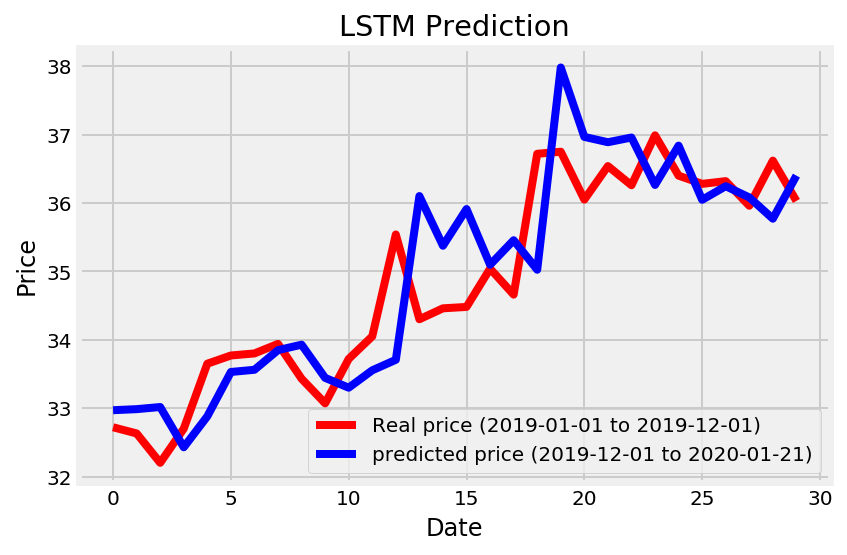

--------------------------
epochs is 110
batch_size:64
units num:110
--------------------------
Epoch 1/110
223/223 [==============================] - 14s 65ms/step - loss: 1.6630
Epoch 2/110
223/223 [==============================] - 1s 4ms/step - loss: 0.1162
Epoch 3/110
223/223 [==============================] - 1s 4ms/step - loss: 0.0341
Epoch 4/110
223/223 [==============================] - 1s 4ms/step - loss: 0.0201
Epoch 5/110
223/223 [==============================] - 1s 4ms/step - loss: 0.0229
Epoch 6/110
223/223 [==============================] - 1s 4ms/step - loss: 0.0211
Epoch 7/110
223/223 [==============================] - 1s 4ms/step - loss: 0.0184
Epoch 8/110
223/223 [==============================] - 1s 5ms/step - loss: 0.0215
Epoch 9/110
223/223 [==============================] - 1s 5ms/step - loss: 0.0239
Epoch 10/110
223/223 [==============================] - 1s 5ms/step - loss: 0.0272
Epoch 11/110
223/223 [==============================] - 1s 5ms/step - loss: 0.020

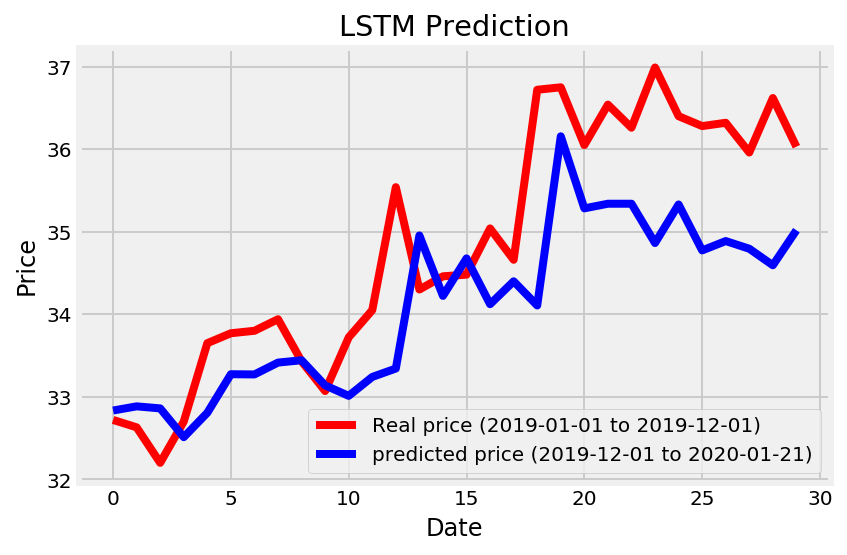

--------------------------
epochs is 150
batch_size:32
units num:50
--------------------------
Epoch 1/150
223/223 [==============================] - 15s 67ms/step - loss: 0.2042
Epoch 2/150
223/223 [==============================] - 1s 5ms/step - loss: 0.0289
Epoch 3/150
223/223 [==============================] - 1s 5ms/step - loss: 0.0217
Epoch 4/150
223/223 [==============================] - 1s 5ms/step - loss: 0.0279
Epoch 5/150
223/223 [==============================] - 1s 6ms/step - loss: 0.0302
Epoch 6/150
223/223 [==============================] - 1s 5ms/step - loss: 0.0268
Epoch 7/150
223/223 [==============================] - 1s 6ms/step - loss: 0.0344
Epoch 8/150
223/223 [==============================] - 1s 6ms/step - loss: 0.0284
Epoch 9/150
223/223 [==============================] - 1s 6ms/step - loss: 0.0292
Epoch 10/150
223/223 [==============================] - 1s 6ms/step - loss: 0.0287
Epoch 11/150
223/223 [==============================] - 1s 6ms/step - loss: 0.0312

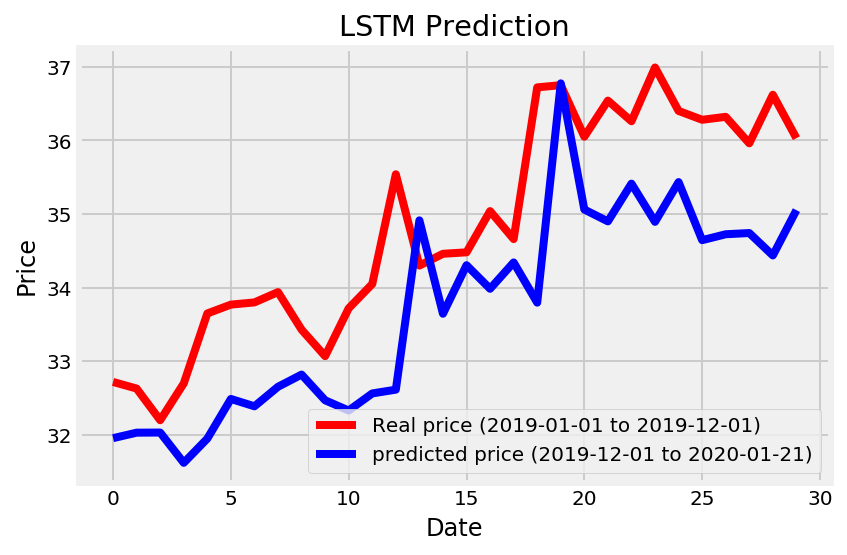

--------------------------
epochs is 150
batch_size:32
units num:80
--------------------------
Epoch 1/150
223/223 [==============================] - 17s 75ms/step - loss: 0.3285
Epoch 2/150
223/223 [==============================] - 1s 6ms/step - loss: 0.0288
Epoch 3/150
223/223 [==============================] - 1s 6ms/step - loss: 0.0225
Epoch 4/150
223/223 [==============================] - 1s 7ms/step - loss: 0.0259
Epoch 5/150
223/223 [==============================] - 2s 7ms/step - loss: 0.0229
Epoch 6/150
223/223 [==============================] - 2s 7ms/step - loss: 0.0267
Epoch 7/150
223/223 [==============================] - 2s 7ms/step - loss: 0.0380
Epoch 8/150
223/223 [==============================] - 2s 7ms/step - loss: 0.0202
Epoch 9/150
223/223 [==============================] - 2s 8ms/step - loss: 0.0488
Epoch 10/150
223/223 [==============================] - 2s 8ms/step - loss: 0.0373
Epoch 11/150
223/223 [==============================] - 2s 8ms/step - loss: 0.0192

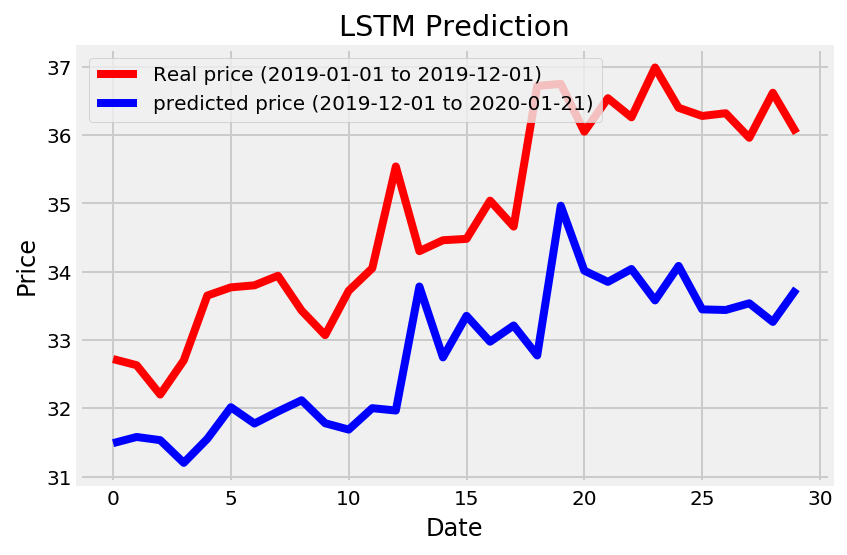

--------------------------
epochs is 150
batch_size:32
units num:110
--------------------------
Epoch 1/150
223/223 [==============================] - 16s 72ms/step - loss: 0.2643
Epoch 2/150
223/223 [==============================] - 1s 6ms/step - loss: 0.0410
Epoch 3/150
223/223 [==============================] - 1s 6ms/step - loss: 0.0317
Epoch 4/150
223/223 [==============================] - 1s 6ms/step - loss: 0.0294
Epoch 5/150
223/223 [==============================] - 1s 6ms/step - loss: 0.0271
Epoch 6/150
223/223 [==============================] - 2s 7ms/step - loss: 0.0321
Epoch 7/150
223/223 [==============================] - 2s 7ms/step - loss: 0.0201
Epoch 8/150
223/223 [==============================] - 2s 7ms/step - loss: 0.0508
Epoch 9/150
223/223 [==============================] - 2s 8ms/step - loss: 0.0286
Epoch 10/150
223/223 [==============================] - 2s 8ms/step - loss: 0.0295
Epoch 11/150
223/223 [==============================] - 2s 8ms/step - loss: 0.043

223/223 [==============================] - 2s 10ms/step - loss: 0.0125
Epoch 99/150
223/223 [==============================] - 2s 10ms/step - loss: 0.0149
Epoch 100/150
223/223 [==============================] - 2s 11ms/step - loss: 0.0146
Epoch 101/150
223/223 [==============================] - 2s 11ms/step - loss: 0.0124
Epoch 102/150
223/223 [==============================] - 2s 11ms/step - loss: 0.0138
Epoch 103/150
223/223 [==============================] - 3s 12ms/step - loss: 0.0156
Epoch 104/150
223/223 [==============================] - 2s 11ms/step - loss: 0.0110
Epoch 105/150
223/223 [==============================] - 2s 10ms/step - loss: 0.0137
Epoch 106/150
223/223 [==============================] - 2s 10ms/step - loss: 0.0165
Epoch 107/150
223/223 [==============================] - 2s 10ms/step - loss: 0.0119
Epoch 108/150
223/223 [==============================] - 2s 10ms/step - loss: 0.0164
Epoch 109/150
223/223 [==============================] - 2s 10ms/step - loss: 0.

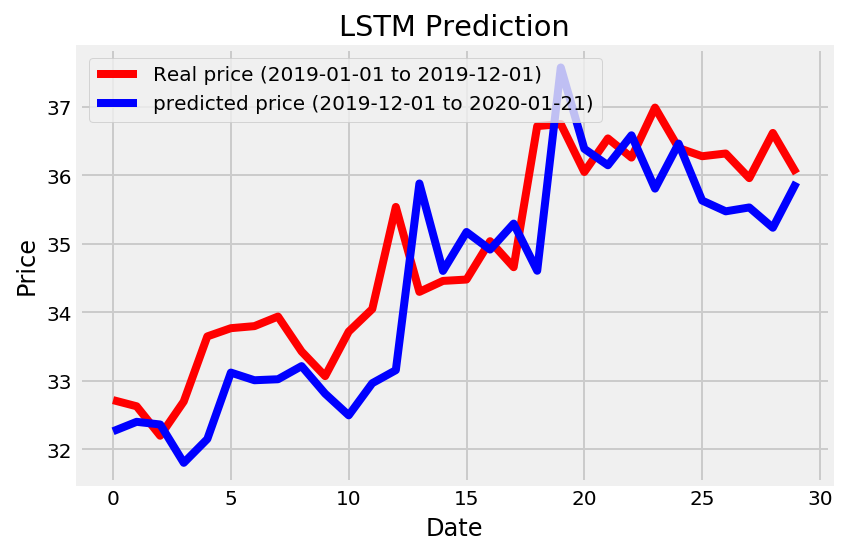

number of previous days in features: 10

y scales:[0.0277585],
x scaled:[0.0277585  0.21842857 0.6165454  0.15570526 0.09498607 0.68778477
 0.         0.16266492 0.12318841 0.48480243 0.11832947 0.07784431]

length of X_1:248

length of X train set is: 218
length of y train set is: 218

--------------------------
epochs is 50
batch_size:32
units num:50
--------------------------
Epoch 1/50
218/218 [==============================] - 17s 79ms/step - loss: 0.1212
Epoch 2/50
218/218 [==============================] - 3s 12ms/step - loss: 0.0291
Epoch 3/50
218/218 [==============================] - 2s 11ms/step - loss: 0.0405
Epoch 4/50
218/218 [==============================] - 2s 11ms/step - loss: 0.0252
Epoch 5/50
218/218 [==============================] - 3s 13ms/step - loss: 0.0300
Epoch 6/50
218/218 [==============================] - 3s 15ms/step - loss: 0.0304
Epoch 7/50
218/218 [==============================] - 3s 16ms/step - loss: 0.0284
Epoch 8/50
218/218 [=======================

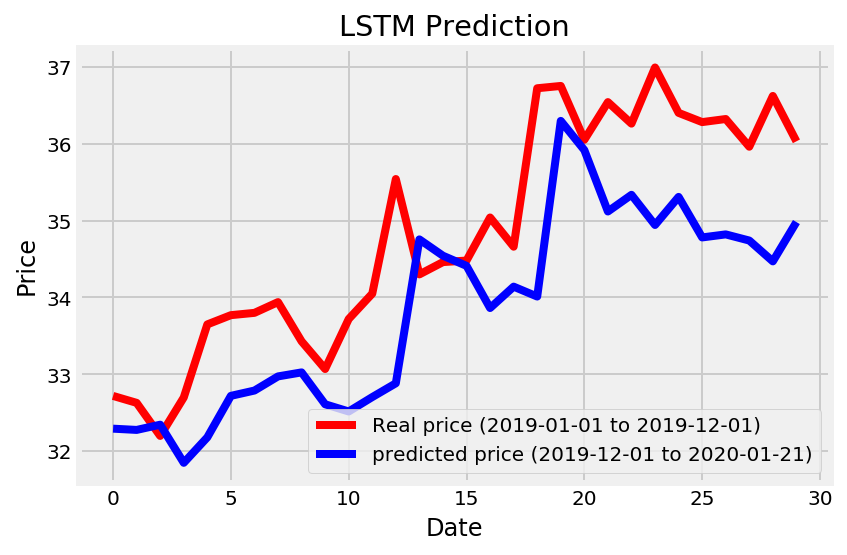

--------------------------
epochs is 50
batch_size:32
units num:80
--------------------------
Epoch 1/50
218/218 [==============================] - 18s 85ms/step - loss: 0.2670
Epoch 2/50
218/218 [==============================] - 3s 14ms/step - loss: 0.0216
Epoch 3/50
218/218 [==============================] - 3s 13ms/step - loss: 0.0254
Epoch 4/50
218/218 [==============================] - 3s 15ms/step - loss: 0.0195
Epoch 5/50
218/218 [==============================] - 4s 16ms/step - loss: 0.0284
Epoch 6/50
218/218 [==============================] - 4s 17ms/step - loss: 0.0376
Epoch 7/50
218/218 [==============================] - 4s 18ms/step - loss: 0.0313
Epoch 8/50
218/218 [==============================] - 5s 21ms/step - loss: 0.0403
Epoch 9/50
218/218 [==============================] - 4s 20ms/step - loss: 0.0258
Epoch 10/50
218/218 [==============================] - 4s 20ms/step - loss: 0.0395
Epoch 11/50
218/218 [==============================] - 4s 20ms/step - loss: 0.0173
E

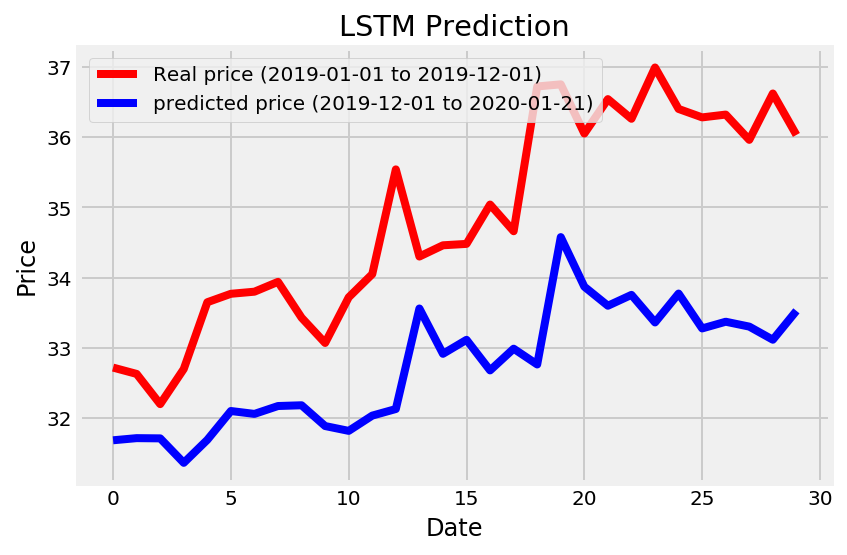

--------------------------
epochs is 50
batch_size:32
units num:110
--------------------------
Epoch 1/50
218/218 [==============================] - 19s 87ms/step - loss: 1.7696
Epoch 2/50
218/218 [==============================] - 3s 12ms/step - loss: 0.0202
Epoch 3/50
218/218 [==============================] - 3s 12ms/step - loss: 0.0207
Epoch 4/50
218/218 [==============================] - 3s 13ms/step - loss: 0.0214
Epoch 5/50
218/218 [==============================] - 3s 13ms/step - loss: 0.0281
Epoch 6/50
218/218 [==============================] - 3s 13ms/step - loss: 0.0338
Epoch 7/50
218/218 [==============================] - 3s 13ms/step - loss: 0.0240
Epoch 8/50
218/218 [==============================] - 3s 13ms/step - loss: 0.0367
Epoch 9/50
218/218 [==============================] - 3s 13ms/step - loss: 0.0299
Epoch 10/50
218/218 [==============================] - 3s 14ms/step - loss: 0.0405
Epoch 11/50
218/218 [==============================] - 3s 15ms/step - loss: 0.0273


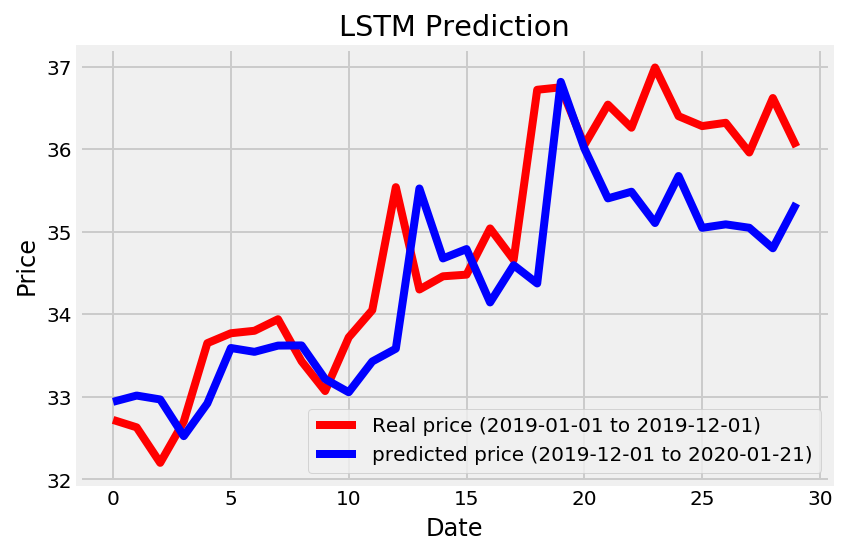

--------------------------
epochs is 80
batch_size:32
units num:50
--------------------------
Epoch 1/80
218/218 [==============================] - 20s 92ms/step - loss: 0.2500
Epoch 2/80
218/218 [==============================] - 3s 12ms/step - loss: 0.0210
Epoch 3/80
218/218 [==============================] - 3s 13ms/step - loss: 0.0203
Epoch 4/80
218/218 [==============================] - 3s 14ms/step - loss: 0.0201
Epoch 5/80
218/218 [==============================] - 3s 14ms/step - loss: 0.0260
Epoch 6/80
218/218 [==============================] - 3s 14ms/step - loss: 0.0261
Epoch 7/80
218/218 [==============================] - 3s 14ms/step - loss: 0.0335
Epoch 8/80
218/218 [==============================] - 3s 15ms/step - loss: 0.0307
Epoch 9/80
218/218 [==============================] - 3s 15ms/step - loss: 0.0350
Epoch 10/80
218/218 [==============================] - 3s 15ms/step - loss: 0.0348
Epoch 11/80
218/218 [==============================] - 3s 15ms/step - loss: 0.0185
E

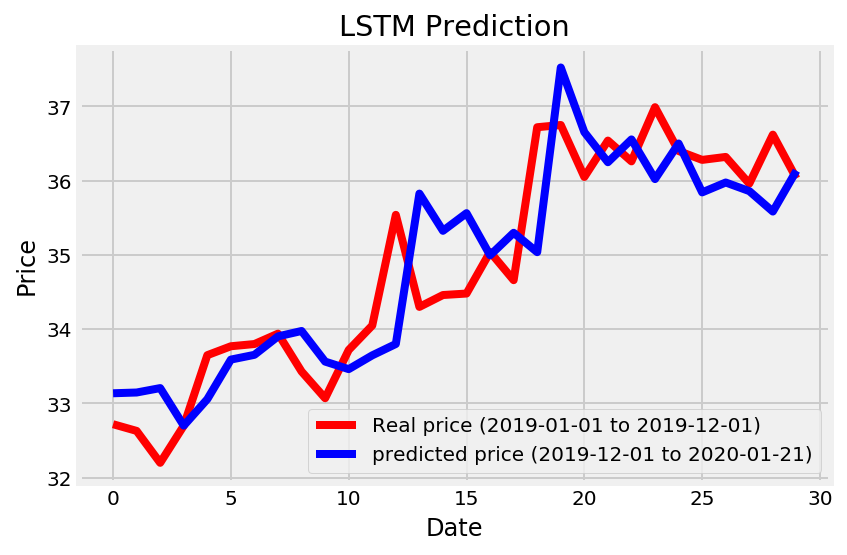

--------------------------
epochs is 80
batch_size:32
units num:80
--------------------------
Epoch 1/80
218/218 [==============================] - 20s 90ms/step - loss: 0.2256
Epoch 2/80
218/218 [==============================] - 3s 12ms/step - loss: 0.0223
Epoch 3/80
218/218 [==============================] - 3s 13ms/step - loss: 0.0215
Epoch 4/80
218/218 [==============================] - 3s 14ms/step - loss: 0.0300
Epoch 5/80
218/218 [==============================] - 3s 15ms/step - loss: 0.0289
Epoch 6/80
218/218 [==============================] - 3s 15ms/step - loss: 0.0400
Epoch 7/80
218/218 [==============================] - 3s 16ms/step - loss: 0.0309
Epoch 8/80
218/218 [==============================] - 3s 16ms/step - loss: 0.0423
Epoch 9/80
218/218 [==============================] - 4s 17ms/step - loss: 0.0246
Epoch 10/80
218/218 [==============================] - 4s 17ms/step - loss: 0.0263
Epoch 11/80
218/218 [==============================] - 4s 17ms/step - loss: 0.0346
E

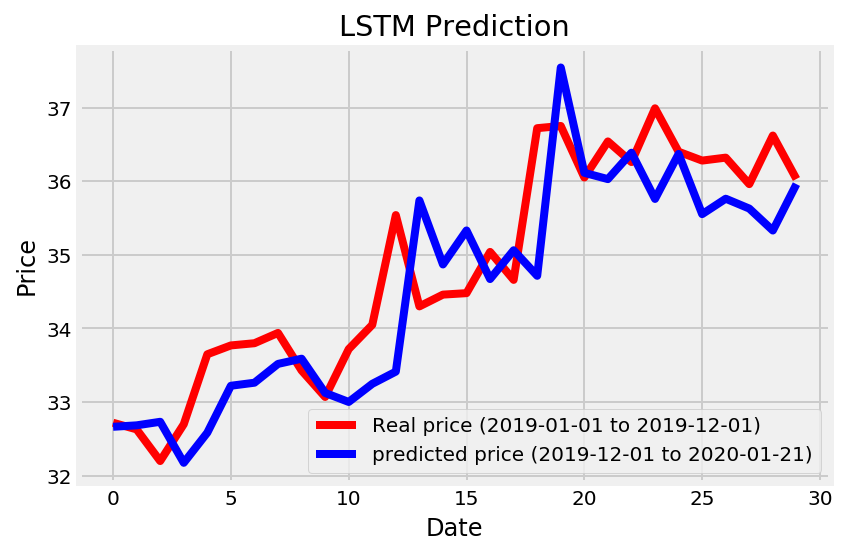

--------------------------
epochs is 80
batch_size:32
units num:110
--------------------------
Epoch 1/80
218/218 [==============================] - 20s 93ms/step - loss: 1.6261
Epoch 2/80
218/218 [==============================] - 3s 13ms/step - loss: 0.0231
Epoch 3/80
218/218 [==============================] - 3s 13ms/step - loss: 0.0215
Epoch 4/80
218/218 [==============================] - 3s 14ms/step - loss: 0.0198
Epoch 5/80
218/218 [==============================] - 3s 15ms/step - loss: 0.0268
Epoch 6/80
218/218 [==============================] - 3s 16ms/step - loss: 0.0266
Epoch 7/80
218/218 [==============================] - 4s 17ms/step - loss: 0.0167
Epoch 8/80
218/218 [==============================] - 4s 18ms/step - loss: 0.0424
Epoch 9/80
218/218 [==============================] - 4s 18ms/step - loss: 0.0274
Epoch 10/80
218/218 [==============================] - 4s 19ms/step - loss: 0.0577
Epoch 11/80
218/218 [==============================] - 4s 20ms/step - loss: 0.0234


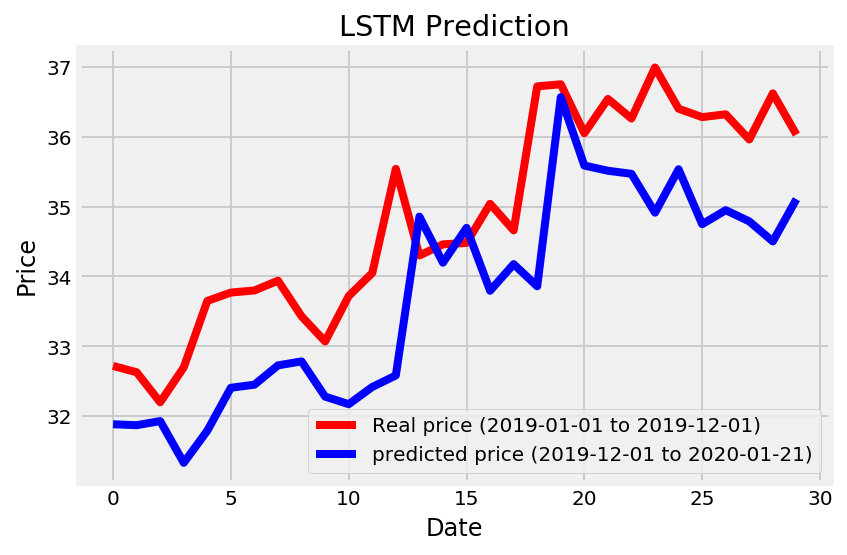

--------------------------
epochs is 110
batch_size:32
units num:50
--------------------------
Epoch 1/110
218/218 [==============================] - 21s 95ms/step - loss: 0.1992
Epoch 2/110
218/218 [==============================] - 2s 11ms/step - loss: 0.0232
Epoch 3/110
218/218 [==============================] - 3s 12ms/step - loss: 0.0235
Epoch 4/110
218/218 [==============================] - 3s 13ms/step - loss: 0.0240
Epoch 5/110
218/218 [==============================] - 3s 14ms/step - loss: 0.0322
Epoch 6/110
218/218 [==============================] - 3s 14ms/step - loss: 0.0273
Epoch 7/110
218/218 [==============================] - 3s 14ms/step - loss: 0.0395
Epoch 8/110
218/218 [==============================] - 3s 14ms/step - loss: 0.0204
Epoch 9/110
218/218 [==============================] - 3s 15ms/step - loss: 0.0326
Epoch 10/110
218/218 [==============================] - 3s 15ms/step - loss: 0.0239
Epoch 11/110
218/218 [==============================] - 3s 15ms/step - lo

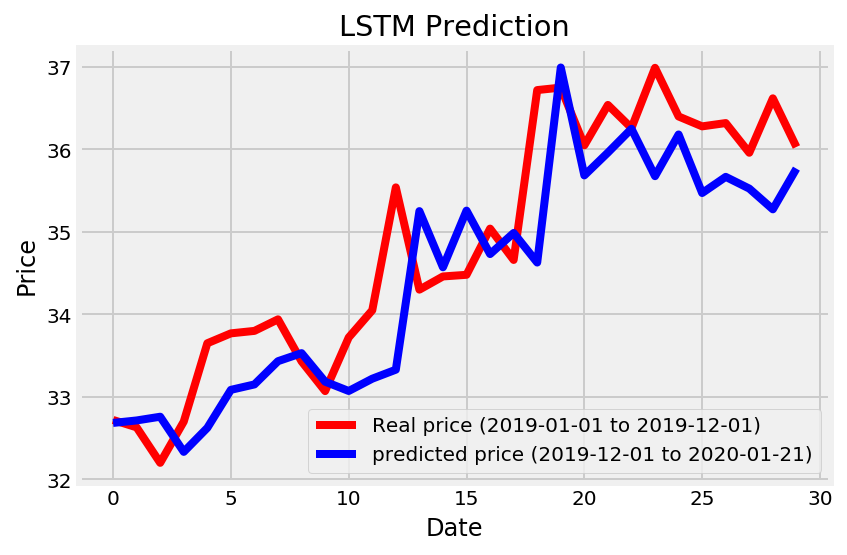

--------------------------
epochs is 110
batch_size:32
units num:80
--------------------------
Epoch 1/110
218/218 [==============================] - 23s 103ms/step - loss: 0.2619
Epoch 2/110
218/218 [==============================] - 3s 12ms/step - loss: 0.0271
Epoch 3/110
218/218 [==============================] - 3s 13ms/step - loss: 0.0290
Epoch 4/110
218/218 [==============================] - 3s 14ms/step - loss: 0.0247
Epoch 5/110
218/218 [==============================] - 3s 15ms/step - loss: 0.0279
Epoch 6/110
218/218 [==============================] - 3s 15ms/step - loss: 0.0231
Epoch 7/110
218/218 [==============================] - 3s 16ms/step - loss: 0.0445
Epoch 8/110
218/218 [==============================] - 3s 16ms/step - loss: 0.0352
Epoch 9/110
218/218 [==============================] - 4s 16ms/step - loss: 0.0424
Epoch 10/110
218/218 [==============================] - 4s 16ms/step - loss: 0.0282
Epoch 11/110
218/218 [==============================] - 4s 16ms/step - l

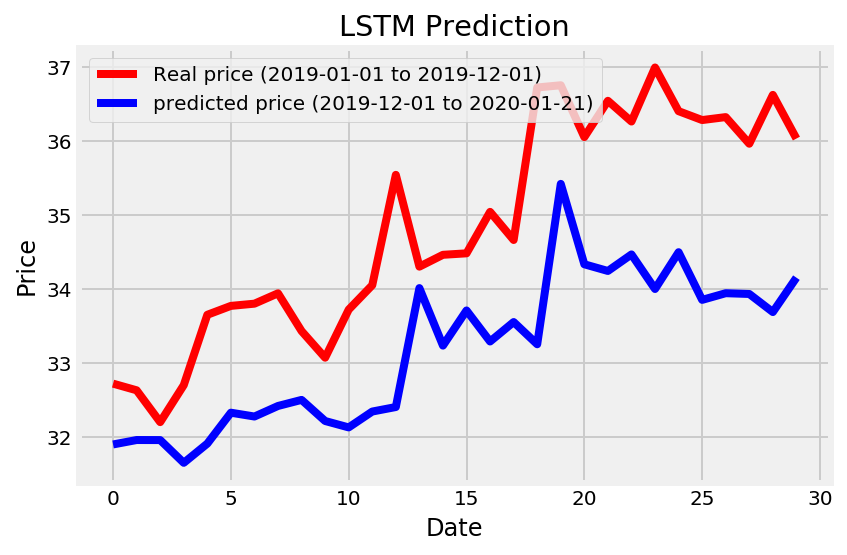

--------------------------
epochs is 110
batch_size:32
units num:110
--------------------------
Epoch 1/110
218/218 [==============================] - 22s 101ms/step - loss: 0.9076
Epoch 2/110
218/218 [==============================] - 3s 13ms/step - loss: 0.0346
Epoch 3/110
218/218 [==============================] - 3s 13ms/step - loss: 0.0239
Epoch 4/110
218/218 [==============================] - 3s 13ms/step - loss: 0.0210
Epoch 5/110
218/218 [==============================] - 3s 13ms/step - loss: 0.0210
Epoch 6/110
218/218 [==============================] - 3s 15ms/step - loss: 0.0269
Epoch 7/110
218/218 [==============================] - 4s 19ms/step - loss: 0.0361
Epoch 8/110
218/218 [==============================] - 4s 19ms/step - loss: 0.0245
Epoch 9/110
218/218 [==============================] - 4s 20ms/step - loss: 0.0366
Epoch 10/110
218/218 [==============================] - 5s 22ms/step - loss: 0.0183
Epoch 11/110
218/218 [==============================] - 5s 21ms/step - 

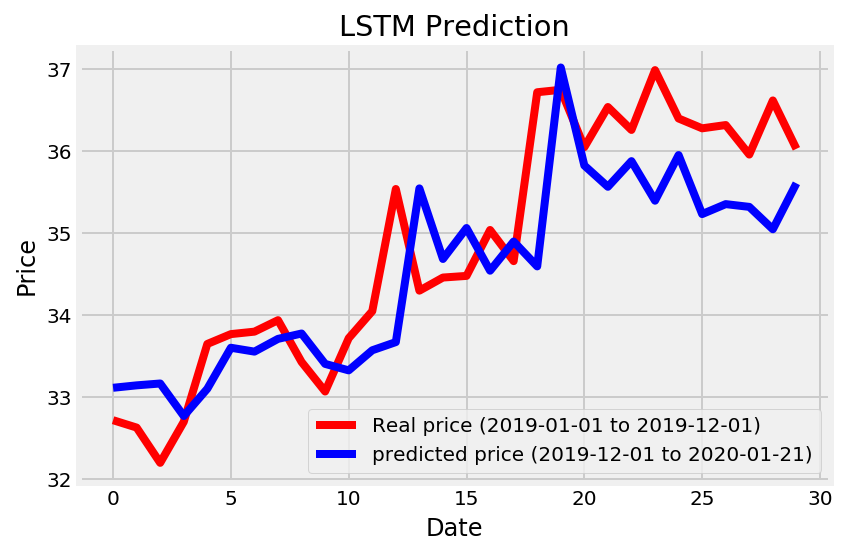

--------------------------
epochs is 150
batch_size:32
units num:50
--------------------------
Epoch 1/150
218/218 [==============================] - 21s 96ms/step - loss: 0.2137
Epoch 2/150
218/218 [==============================] - 2s 11ms/step - loss: 0.0248
Epoch 3/150
218/218 [==============================] - 2s 11ms/step - loss: 0.0217
Epoch 4/150
218/218 [==============================] - 2s 11ms/step - loss: 0.0220
Epoch 5/150
218/218 [==============================] - 2s 11ms/step - loss: 0.0237
Epoch 6/150
218/218 [==============================] - 2s 11ms/step - loss: 0.0209
Epoch 7/150
218/218 [==============================] - 2s 11ms/step - loss: 0.0345
Epoch 8/150
218/218 [==============================] - 2s 11ms/step - loss: 0.0279
Epoch 9/150
218/218 [==============================] - 2s 11ms/step - loss: 0.0313
Epoch 10/150
218/218 [==============================] - 2s 11ms/step - loss: 0.0212
Epoch 11/150
218/218 [==============================] - 3s 12ms/step - lo

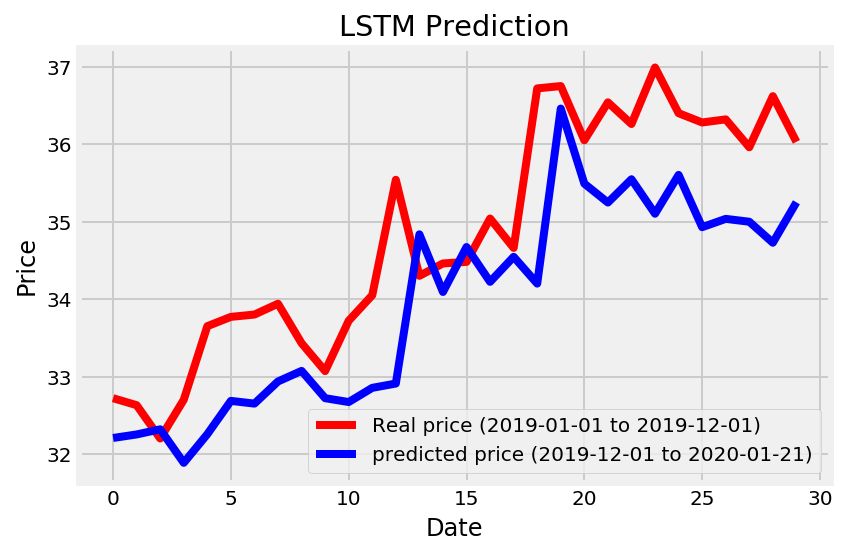

--------------------------
epochs is 150
batch_size:32
units num:80
--------------------------
Epoch 1/150
218/218 [==============================] - 21s 97ms/step - loss: 0.2499
Epoch 2/150
218/218 [==============================] - 2s 11ms/step - loss: 0.0258
Epoch 3/150
218/218 [==============================] - 2s 11ms/step - loss: 0.0258
Epoch 4/150
218/218 [==============================] - 2s 11ms/step - loss: 0.0233
Epoch 5/150
218/218 [==============================] - 3s 12ms/step - loss: 0.0324
Epoch 6/150
218/218 [==============================] - 2s 11ms/step - loss: 0.0307
Epoch 7/150
218/218 [==============================] - 3s 12ms/step - loss: 0.0335
Epoch 8/150
218/218 [==============================] - 3s 12ms/step - loss: 0.0371
Epoch 9/150
218/218 [==============================] - 3s 12ms/step - loss: 0.0315
Epoch 10/150
218/218 [==============================] - 3s 12ms/step - loss: 0.0331
Epoch 11/150
218/218 [==============================] - 3s 12ms/step - lo

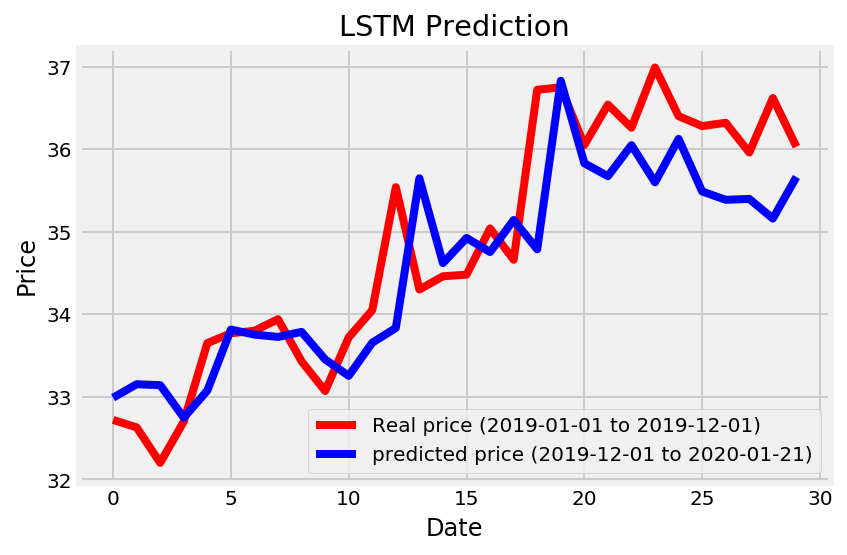

--------------------------
epochs is 150
batch_size:32
units num:110
--------------------------
Epoch 1/150
218/218 [==============================] - 22s 101ms/step - loss: 1.3811
Epoch 2/150
218/218 [==============================] - 3s 12ms/step - loss: 0.0274
Epoch 3/150
218/218 [==============================] - 3s 12ms/step - loss: 0.0198
Epoch 4/150
218/218 [==============================] - 3s 13ms/step - loss: 0.0208
Epoch 5/150
218/218 [==============================] - 3s 13ms/step - loss: 0.0225
Epoch 6/150
218/218 [==============================] - 3s 13ms/step - loss: 0.0186
Epoch 7/150
218/218 [==============================] - 3s 13ms/step - loss: 0.0305
Epoch 8/150
218/218 [==============================] - 3s 14ms/step - loss: 0.0378
Epoch 9/150
218/218 [==============================] - 3s 14ms/step - loss: 0.0351
Epoch 10/150
218/218 [==============================] - 3s 15ms/step - loss: 0.0251
Epoch 11/150
218/218 [==============================] - 3s 15ms/step - 

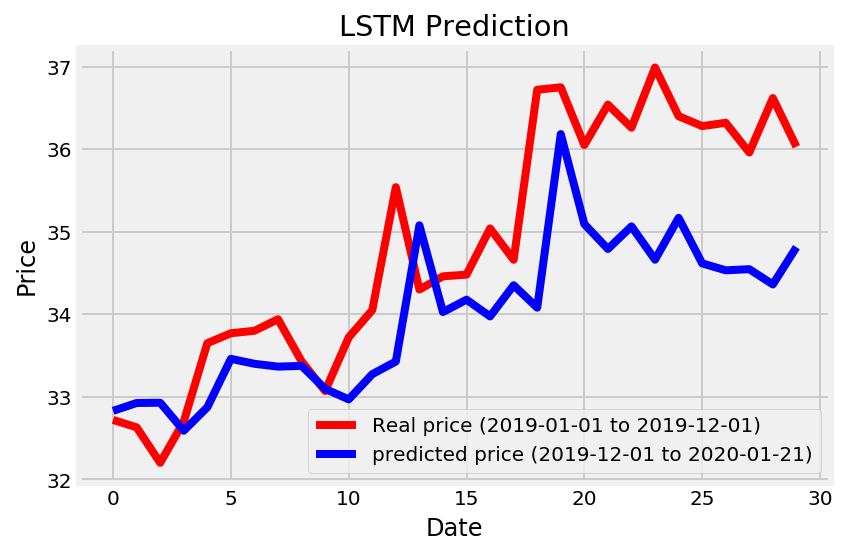

--------------------------
epochs is 50
batch_size:64
units num:50
--------------------------
Epoch 1/50
218/218 [==============================] - 21s 95ms/step - loss: 0.2140
Epoch 2/50
218/218 [==============================] - 1s 6ms/step - loss: 0.0819
Epoch 3/50
218/218 [==============================] - 1s 6ms/step - loss: 0.0253
Epoch 4/50
218/218 [==============================] - 1s 6ms/step - loss: 0.0253
Epoch 5/50
218/218 [==============================] - 1s 6ms/step - loss: 0.0391
Epoch 6/50
218/218 [==============================] - 1s 6ms/step - loss: 0.0502
Epoch 7/50
218/218 [==============================] - 1s 6ms/step - loss: 0.0231
Epoch 8/50
218/218 [==============================] - 1s 7ms/step - loss: 0.0255
Epoch 9/50
218/218 [==============================] - 1s 7ms/step - loss: 0.0320
Epoch 10/50
218/218 [==============================] - 1s 7ms/step - loss: 0.0394
Epoch 11/50
218/218 [==============================] - 1s 7ms/step - loss: 0.0272
Epoch 12/50

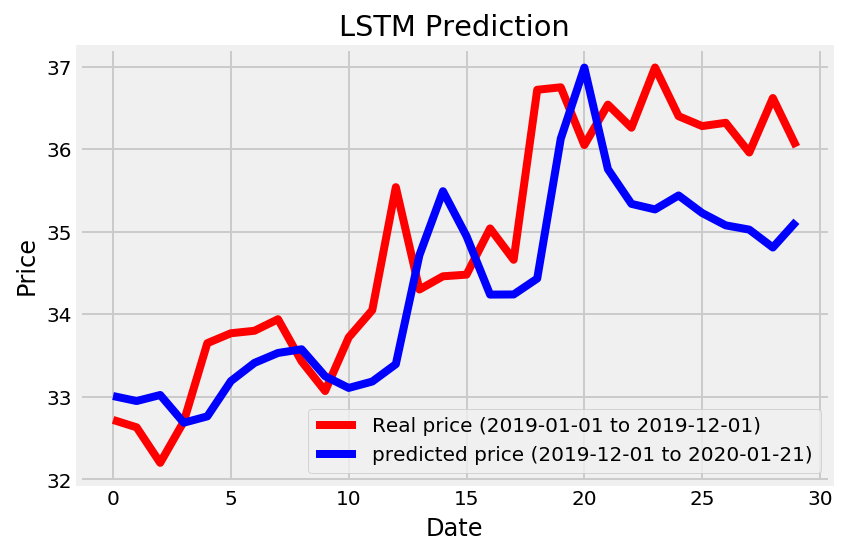

--------------------------
epochs is 50
batch_size:64
units num:80
--------------------------
Epoch 1/50
218/218 [==============================] - 21s 97ms/step - loss: 0.5854
Epoch 2/50
218/218 [==============================] - 1s 7ms/step - loss: 0.1024
Epoch 3/50
218/218 [==============================] - 1s 7ms/step - loss: 0.0268
Epoch 4/50
218/218 [==============================] - 1s 7ms/step - loss: 0.0213
Epoch 5/50
218/218 [==============================] - 1s 7ms/step - loss: 0.0216
Epoch 6/50
218/218 [==============================] - 1s 7ms/step - loss: 0.0211
Epoch 7/50
218/218 [==============================] - 2s 7ms/step - loss: 0.0206
Epoch 8/50
218/218 [==============================] - 2s 7ms/step - loss: 0.0256
Epoch 9/50
218/218 [==============================] - 2s 7ms/step - loss: 0.0247
Epoch 10/50
218/218 [==============================] - 2s 7ms/step - loss: 0.0240
Epoch 11/50
218/218 [==============================] - 2s 7ms/step - loss: 0.0450
Epoch 12/50

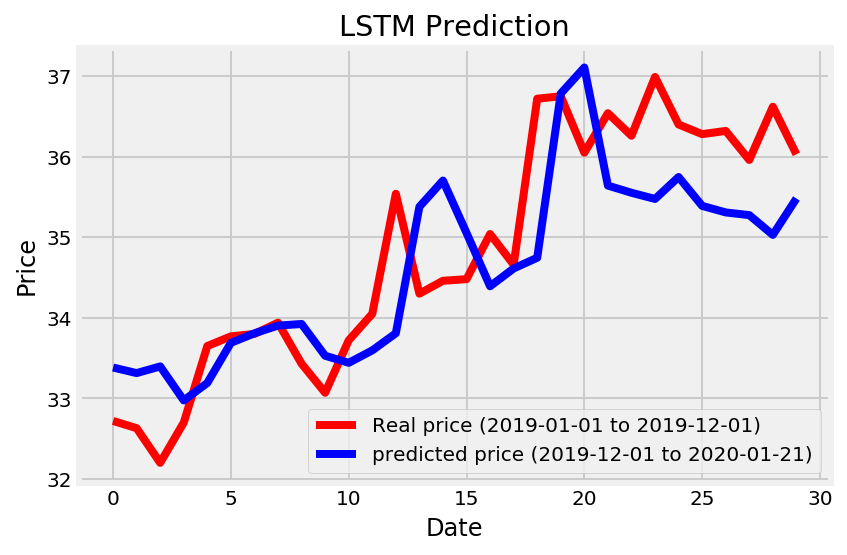

--------------------------
epochs is 50
batch_size:64
units num:110
--------------------------
Epoch 1/50
218/218 [==============================] - 22s 100ms/step - loss: 1.3039
Epoch 2/50
218/218 [==============================] - 2s 7ms/step - loss: 0.1412
Epoch 3/50
218/218 [==============================] - 2s 7ms/step - loss: 0.0346
Epoch 4/50
218/218 [==============================] - 2s 8ms/step - loss: 0.0202
Epoch 5/50
218/218 [==============================] - 2s 8ms/step - loss: 0.0184
Epoch 6/50
218/218 [==============================] - 2s 8ms/step - loss: 0.0213
Epoch 7/50
218/218 [==============================] - 2s 8ms/step - loss: 0.0540
Epoch 8/50
218/218 [==============================] - 2s 8ms/step - loss: 0.0201
Epoch 9/50
218/218 [==============================] - 2s 8ms/step - loss: 0.0259
Epoch 10/50
218/218 [==============================] - 2s 8ms/step - loss: 0.0315
Epoch 11/50
218/218 [==============================] - 2s 8ms/step - loss: 0.0258
Epoch 12/

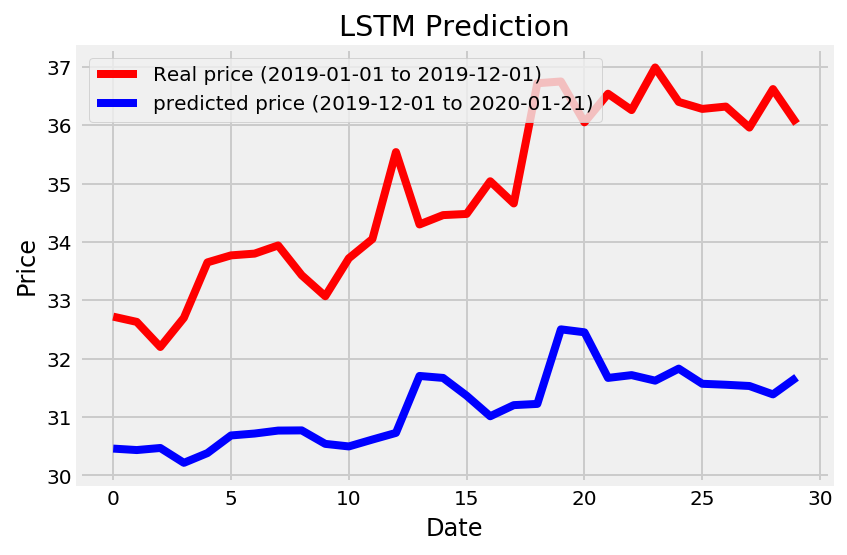

--------------------------
epochs is 80
batch_size:64
units num:50
--------------------------
Epoch 1/80
218/218 [==============================] - 22s 101ms/step - loss: 0.2553
Epoch 2/80
218/218 [==============================] - 1s 6ms/step - loss: 0.0778
Epoch 3/80
218/218 [==============================] - 1s 6ms/step - loss: 0.0240
Epoch 4/80
218/218 [==============================] - 1s 6ms/step - loss: 0.0229
Epoch 5/80
218/218 [==============================] - 1s 6ms/step - loss: 0.0222
Epoch 6/80
218/218 [==============================] - 1s 6ms/step - loss: 0.0235
Epoch 7/80
218/218 [==============================] - 1s 6ms/step - loss: 0.0221
Epoch 8/80
218/218 [==============================] - 1s 7ms/step - loss: 0.0232
Epoch 9/80
218/218 [==============================] - 1s 7ms/step - loss: 0.0306
Epoch 10/80
218/218 [==============================] - 2s 7ms/step - loss: 0.0402
Epoch 11/80
218/218 [==============================] - 1s 7ms/step - loss: 0.0311
Epoch 12/8

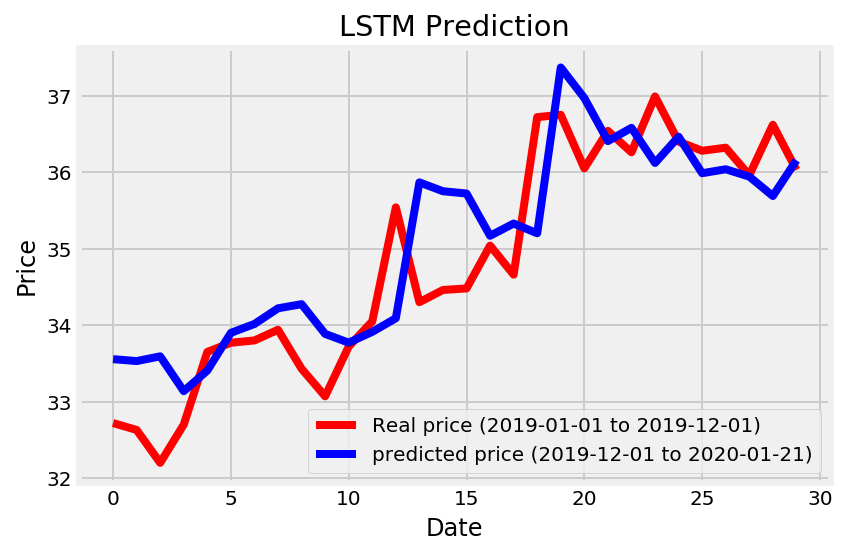

--------------------------
epochs is 80
batch_size:64
units num:80
--------------------------
Epoch 1/80
218/218 [==============================] - 23s 103ms/step - loss: 0.5048
Epoch 2/80
218/218 [==============================] - 1s 7ms/step - loss: 0.1210
Epoch 3/80
218/218 [==============================] - 1s 7ms/step - loss: 0.0305
Epoch 4/80
218/218 [==============================] - 1s 7ms/step - loss: 0.0199
Epoch 5/80
218/218 [==============================] - 1s 7ms/step - loss: 0.0208
Epoch 6/80
218/218 [==============================] - 1s 7ms/step - loss: 0.0208
Epoch 7/80
218/218 [==============================] - 1s 7ms/step - loss: 0.0219
Epoch 8/80
218/218 [==============================] - 2s 7ms/step - loss: 0.0258
Epoch 9/80
218/218 [==============================] - 2s 7ms/step - loss: 0.0347
Epoch 10/80
218/218 [==============================] - 2s 7ms/step - loss: 0.0348
Epoch 11/80
218/218 [==============================] - 2s 7ms/step - loss: 0.0393
Epoch 12/8

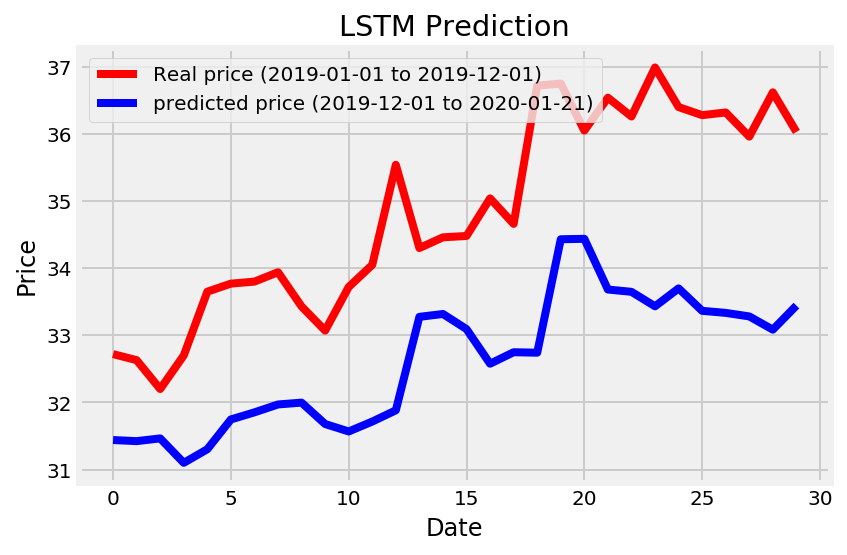

--------------------------
epochs is 80
batch_size:64
units num:110
--------------------------
Epoch 1/80
218/218 [==============================] - 24s 108ms/step - loss: 0.6773
Epoch 2/80
218/218 [==============================] - 2s 7ms/step - loss: 0.1626
Epoch 3/80
218/218 [==============================] - 2s 7ms/step - loss: 0.0440
Epoch 4/80
218/218 [==============================] - 2s 8ms/step - loss: 0.0204
Epoch 5/80
218/218 [==============================] - 2s 8ms/step - loss: 0.0203
Epoch 6/80
218/218 [==============================] - 2s 8ms/step - loss: 0.0228
Epoch 7/80
218/218 [==============================] - 2s 8ms/step - loss: 0.0291
Epoch 8/80
218/218 [==============================] - 2s 8ms/step - loss: 0.0293
Epoch 9/80
218/218 [==============================] - 2s 8ms/step - loss: 0.0284
Epoch 10/80
218/218 [==============================] - 2s 8ms/step - loss: 0.0204
Epoch 11/80
218/218 [==============================] - 2s 8ms/step - loss: 0.0409
Epoch 12/

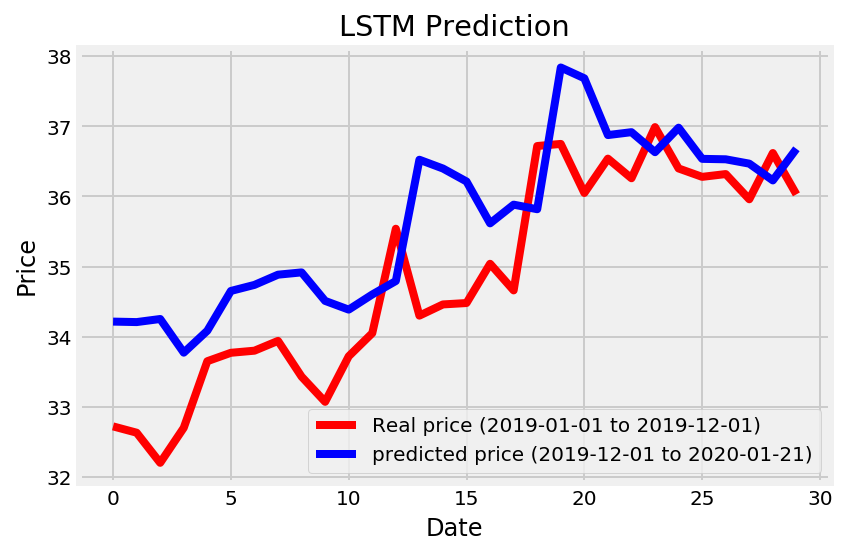

--------------------------
epochs is 110
batch_size:64
units num:50
--------------------------
Epoch 1/110
218/218 [==============================] - 24s 109ms/step - loss: 0.2337
Epoch 2/110
218/218 [==============================] - 1s 6ms/step - loss: 0.0824
Epoch 3/110
218/218 [==============================] - 1s 6ms/step - loss: 0.0220
Epoch 4/110
218/218 [==============================] - 1s 6ms/step - loss: 0.0225
Epoch 5/110
218/218 [==============================] - 1s 7ms/step - loss: 0.0268
Epoch 6/110
218/218 [==============================] - 1s 6ms/step - loss: 0.0288
Epoch 7/110
218/218 [==============================] - 1s 6ms/step - loss: 0.0229
Epoch 8/110
218/218 [==============================] - 1s 7ms/step - loss: 0.0272
Epoch 9/110
218/218 [==============================] - 1s 7ms/step - loss: 0.0468
Epoch 10/110
218/218 [==============================] - 1s 7ms/step - loss: 0.0214
Epoch 11/110
218/218 [==============================] - 1s 7ms/step - loss: 0.026

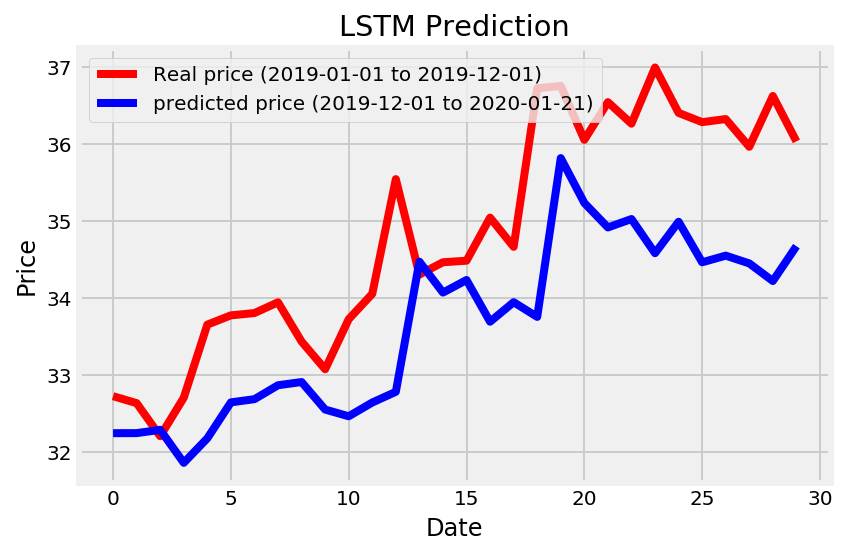

--------------------------
epochs is 110
batch_size:64
units num:80
--------------------------
Epoch 1/110
218/218 [==============================] - 24s 111ms/step - loss: 0.4057
Epoch 2/110
218/218 [==============================] - 1s 7ms/step - loss: 0.0980
Epoch 3/110
218/218 [==============================] - 1s 7ms/step - loss: 0.0248
Epoch 4/110
218/218 [==============================] - 1s 7ms/step - loss: 0.0219
Epoch 5/110
218/218 [==============================] - 1s 7ms/step - loss: 0.0229
Epoch 6/110
218/218 [==============================] - 1s 7ms/step - loss: 0.0243
Epoch 7/110
218/218 [==============================] - 1s 7ms/step - loss: 0.0331
Epoch 8/110
218/218 [==============================] - 2s 7ms/step - loss: 0.0220
Epoch 9/110
218/218 [==============================] - 2s 7ms/step - loss: 0.0212
Epoch 10/110
218/218 [==============================] - 2s 7ms/step - loss: 0.0319
Epoch 11/110
218/218 [==============================] - 2s 7ms/step - loss: 0.025

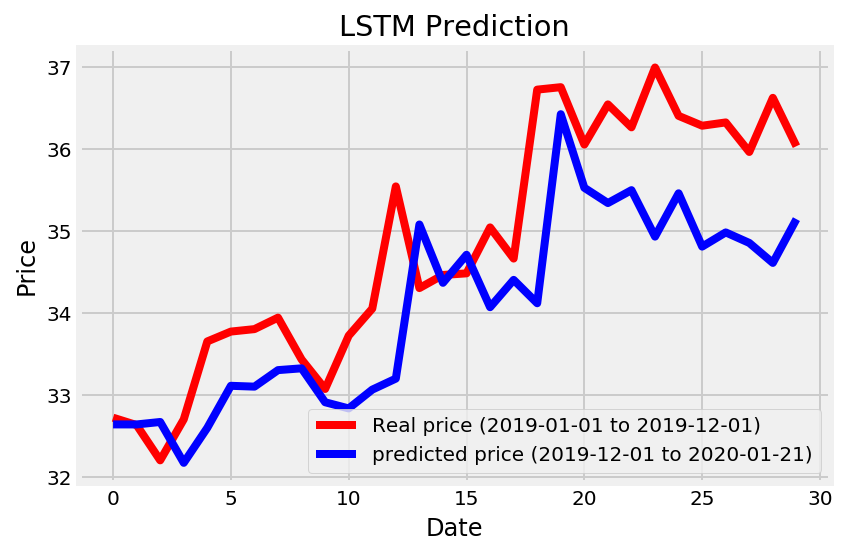

--------------------------
epochs is 110
batch_size:64
units num:110
--------------------------
Epoch 1/110
218/218 [==============================] - 25s 115ms/step - loss: 1.1546
Epoch 2/110
218/218 [==============================] - 2s 7ms/step - loss: 0.1342
Epoch 3/110
218/218 [==============================] - 2s 7ms/step - loss: 0.0341
Epoch 4/110
218/218 [==============================] - 2s 8ms/step - loss: 0.0224
Epoch 5/110
218/218 [==============================] - 2s 8ms/step - loss: 0.0215
Epoch 6/110
218/218 [==============================] - 2s 8ms/step - loss: 0.0197
Epoch 7/110
218/218 [==============================] - 2s 8ms/step - loss: 0.0213
Epoch 8/110
218/218 [==============================] - 2s 8ms/step - loss: 0.0308
Epoch 9/110
218/218 [==============================] - 2s 8ms/step - loss: 0.0208
Epoch 10/110
218/218 [==============================] - 2s 8ms/step - loss: 0.0237
Epoch 11/110
218/218 [==============================] - 2s 8ms/step - loss: 0.02

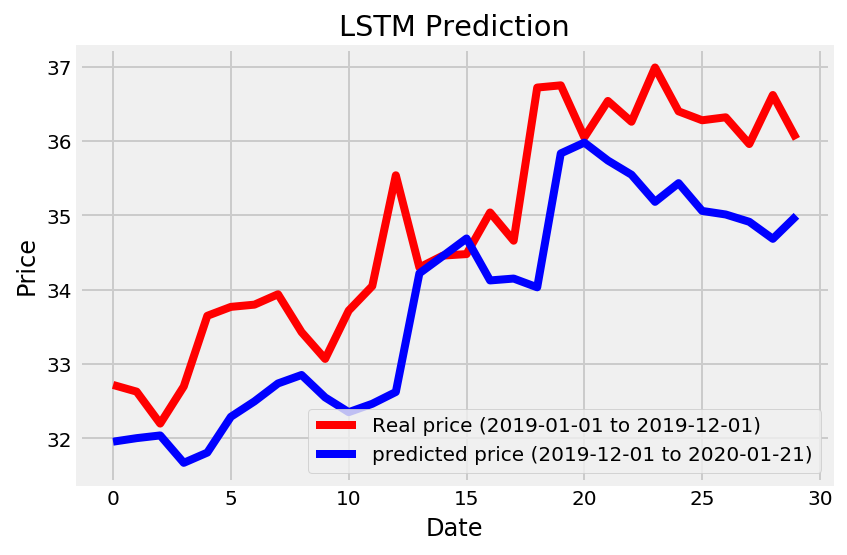

--------------------------
epochs is 150
batch_size:32
units num:50
--------------------------
Epoch 1/150
218/218 [==============================] - 26s 120ms/step - loss: 0.2305
Epoch 2/150
218/218 [==============================] - 2s 11ms/step - loss: 0.0223
Epoch 3/150
218/218 [==============================] - 2s 11ms/step - loss: 0.0232
Epoch 4/150
218/218 [==============================] - 2s 11ms/step - loss: 0.0337
Epoch 5/150
218/218 [==============================] - 2s 11ms/step - loss: 0.0222
Epoch 6/150
218/218 [==============================] - 2s 11ms/step - loss: 0.0270
Epoch 7/150
218/218 [==============================] - 2s 11ms/step - loss: 0.0258
Epoch 8/150
218/218 [==============================] - 2s 11ms/step - loss: 0.0373
Epoch 9/150
218/218 [==============================] - 2s 11ms/step - loss: 0.0252
Epoch 10/150
218/218 [==============================] - 3s 12ms/step - loss: 0.0332
Epoch 11/150
218/218 [==============================] - 3s 12ms/step - l

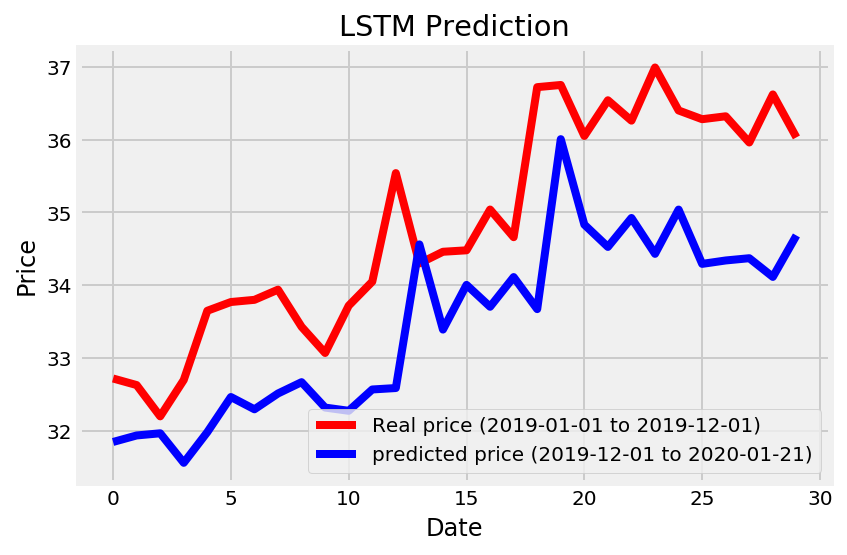

--------------------------
epochs is 150
batch_size:32
units num:80
--------------------------
Epoch 1/150
218/218 [==============================] - 26s 121ms/step - loss: 0.2699
Epoch 2/150
218/218 [==============================] - 2s 11ms/step - loss: 0.0269
Epoch 3/150
218/218 [==============================] - 2s 11ms/step - loss: 0.0236
Epoch 4/150
218/218 [==============================] - 2s 11ms/step - loss: 0.0306
Epoch 5/150
218/218 [==============================] - 2s 11ms/step - loss: 0.0211
Epoch 6/150
218/218 [==============================] - 3s 12ms/step - loss: 0.0578
Epoch 7/150
218/218 [==============================] - 3s 12ms/step - loss: 0.0240
Epoch 8/150
218/218 [==============================] - 3s 12ms/step - loss: 0.0228
Epoch 9/150
218/218 [==============================] - 3s 12ms/step - loss: 0.0295
Epoch 10/150
218/218 [==============================] - 3s 12ms/step - loss: 0.0668
Epoch 11/150
218/218 [==============================] - 3s 12ms/step - l

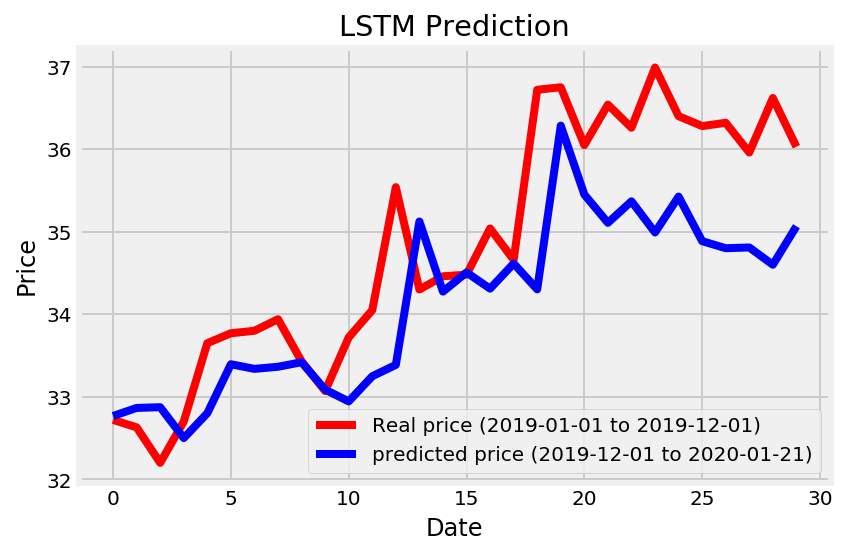

--------------------------
epochs is 150
batch_size:32
units num:110
--------------------------
Epoch 1/150
218/218 [==============================] - 27s 125ms/step - loss: 0.5549
Epoch 2/150
218/218 [==============================] - 3s 12ms/step - loss: 0.0458
Epoch 3/150
218/218 [==============================] - 3s 12ms/step - loss: 0.0246
Epoch 4/150
218/218 [==============================] - 3s 12ms/step - loss: 0.0259
Epoch 5/150
218/218 [==============================] - 3s 12ms/step - loss: 0.0270
Epoch 6/150
218/218 [==============================] - 3s 13ms/step - loss: 0.0196
Epoch 7/150
218/218 [==============================] - 3s 13ms/step - loss: 0.0393
Epoch 8/150
218/218 [==============================] - 3s 13ms/step - loss: 0.0253
Epoch 9/150
218/218 [==============================] - 3s 13ms/step - loss: 0.0458
Epoch 10/150
218/218 [==============================] - 3s 13ms/step - loss: 0.0266
Epoch 11/150
218/218 [==============================] - 3s 13ms/step - 

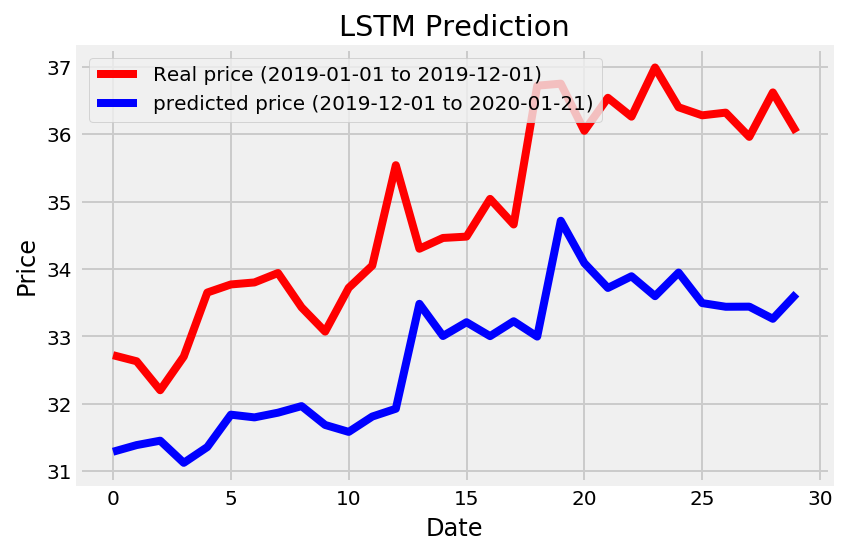

number of previous days in features: 15

y scales:[0.0277585],
x scaled:[0.0277585  0.21842857 0.6165454  0.15570526 0.09498607 0.68778477
 0.         0.16266492 0.12318841 0.48480243 0.11832947 0.07784431]

length of X_1:243

length of X train set is: 213
length of y train set is: 213

--------------------------
epochs is 50
batch_size:32
units num:50
--------------------------
Epoch 1/50
213/213 [==============================] - 28s 133ms/step - loss: 0.1952
Epoch 2/50
213/213 [==============================] - 3s 16ms/step - loss: 0.0281
Epoch 3/50
213/213 [==============================] - 4s 17ms/step - loss: 0.0203
Epoch 4/50
213/213 [==============================] - 4s 18ms/step - loss: 0.0220
Epoch 5/50
213/213 [==============================] - 4s 18ms/step - loss: 0.0207
Epoch 6/50
213/213 [==============================] - 4s 18ms/step - loss: 0.0220
Epoch 7/50
213/213 [==============================] - 4s 18ms/step - loss: 0.0391
Epoch 8/50
213/213 [======================

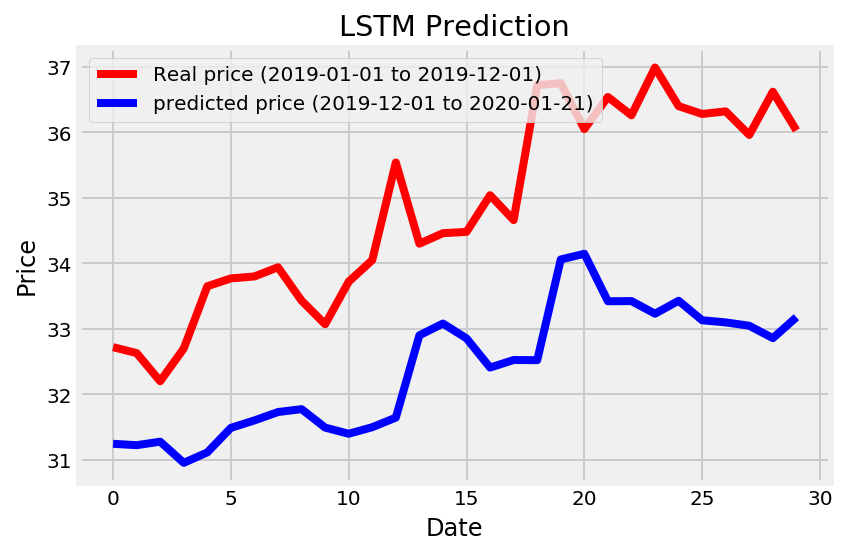

--------------------------
epochs is 50
batch_size:32
units num:80
--------------------------
Epoch 1/50
213/213 [==============================] - 29s 136ms/step - loss: 0.2114
Epoch 2/50
213/213 [==============================] - 4s 17ms/step - loss: 0.0260
Epoch 3/50
213/213 [==============================] - 4s 17ms/step - loss: 0.0275
Epoch 4/50
213/213 [==============================] - 4s 18ms/step - loss: 0.0363
Epoch 5/50
213/213 [==============================] - 4s 18ms/step - loss: 0.0259
Epoch 6/50
213/213 [==============================] - 4s 18ms/step - loss: 0.0396
Epoch 7/50
213/213 [==============================] - 4s 18ms/step - loss: 0.0239
Epoch 8/50
213/213 [==============================] - 4s 19ms/step - loss: 0.0371
Epoch 9/50
213/213 [==============================] - 4s 19ms/step - loss: 0.0299
Epoch 10/50
213/213 [==============================] - 4s 19ms/step - loss: 0.0242
Epoch 11/50
213/213 [==============================] - 4s 19ms/step - loss: 0.0376


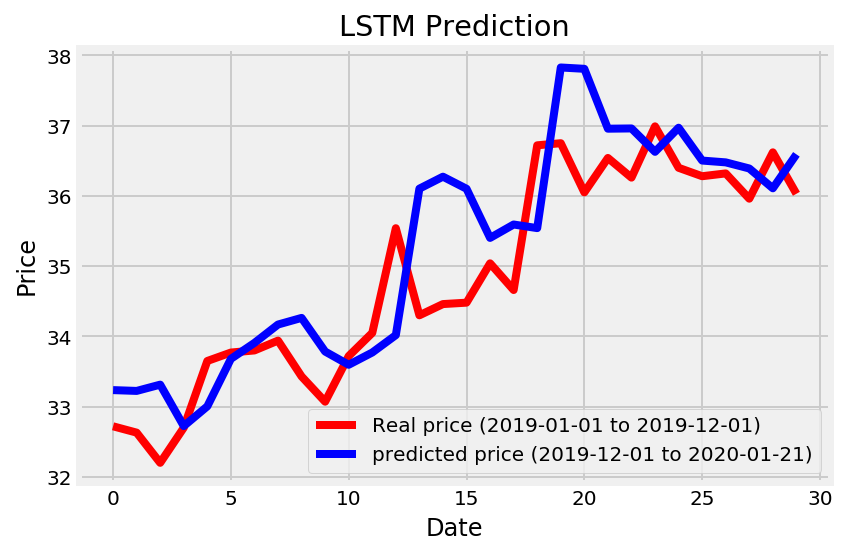

--------------------------
epochs is 50
batch_size:32
units num:110
--------------------------
Epoch 1/50
213/213 [==============================] - 29s 137ms/step - loss: 0.5969
Epoch 2/50
213/213 [==============================] - 4s 18ms/step - loss: 0.0299
Epoch 3/50
213/213 [==============================] - 4s 18ms/step - loss: 0.0218
Epoch 4/50
213/213 [==============================] - 4s 19ms/step - loss: 0.0234
Epoch 5/50
213/213 [==============================] - 4s 20ms/step - loss: 0.0234
Epoch 6/50
213/213 [==============================] - 4s 20ms/step - loss: 0.0280
Epoch 7/50
213/213 [==============================] - 4s 19ms/step - loss: 0.0410
Epoch 8/50
213/213 [==============================] - 4s 20ms/step - loss: 0.0361
Epoch 9/50
213/213 [==============================] - 4s 20ms/step - loss: 0.0248
Epoch 10/50
213/213 [==============================] - 4s 21ms/step - loss: 0.0503
Epoch 11/50
213/213 [==============================] - 4s 21ms/step - loss: 0.0283

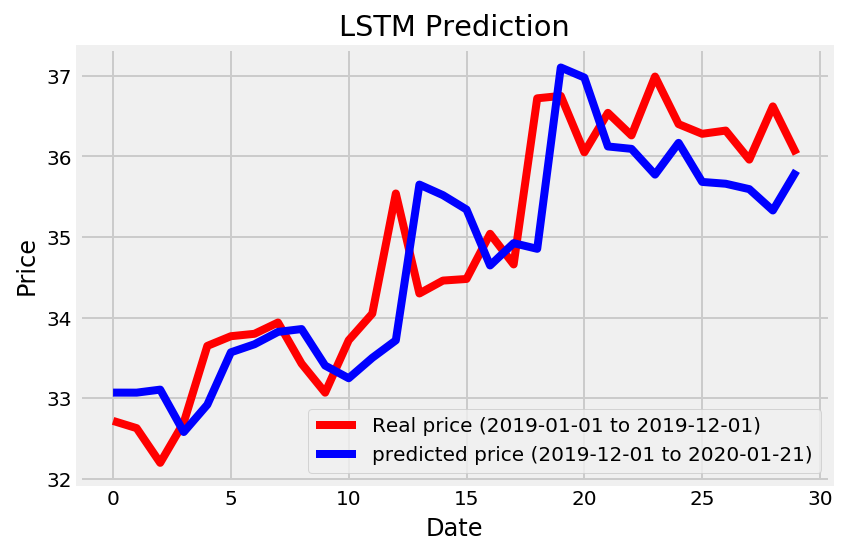

--------------------------
epochs is 80
batch_size:32
units num:50
--------------------------
Epoch 1/80
213/213 [==============================] - 29s 138ms/step - loss: 0.2248
Epoch 2/80
213/213 [==============================] - 3s 16ms/step - loss: 0.0262
Epoch 3/80
213/213 [==============================] - 4s 17ms/step - loss: 0.0197
Epoch 4/80
213/213 [==============================] - 4s 17ms/step - loss: 0.0224
Epoch 5/80
213/213 [==============================] - 4s 17ms/step - loss: 0.0178
Epoch 6/80
213/213 [==============================] - 4s 18ms/step - loss: 0.0323
Epoch 7/80
213/213 [==============================] - 4s 18ms/step - loss: 0.0403
Epoch 8/80
213/213 [==============================] - 4s 18ms/step - loss: 0.0198
Epoch 9/80
213/213 [==============================] - 4s 18ms/step - loss: 0.0281
Epoch 10/80
213/213 [==============================] - 4s 18ms/step - loss: 0.0304
Epoch 11/80
213/213 [==============================] - 4s 18ms/step - loss: 0.0254


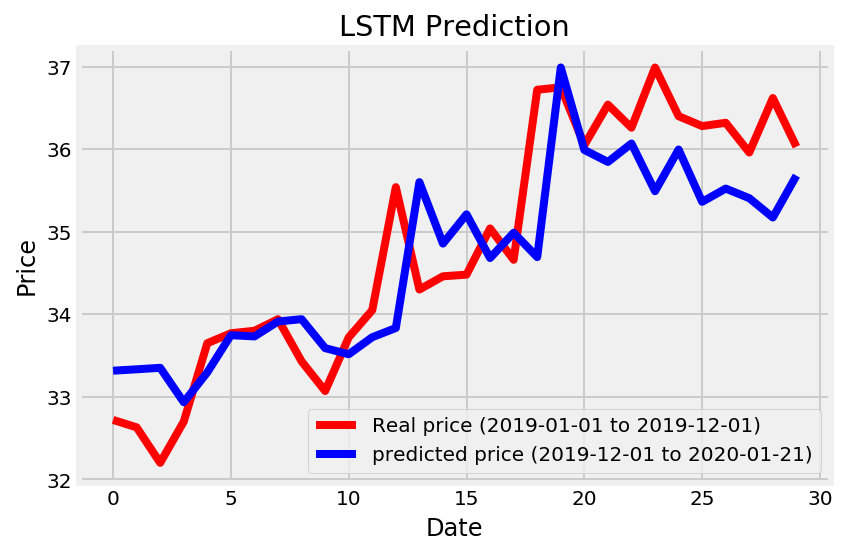

--------------------------
epochs is 80
batch_size:32
units num:80
--------------------------
Epoch 1/80
213/213 [==============================] - 31s 145ms/step - loss: 0.2008
Epoch 2/80
213/213 [==============================] - 4s 17ms/step - loss: 0.0298
Epoch 3/80
213/213 [==============================] - 4s 18ms/step - loss: 0.0206
Epoch 4/80
213/213 [==============================] - 4s 18ms/step - loss: 0.0276
Epoch 5/80
213/213 [==============================] - 4s 18ms/step - loss: 0.0294
Epoch 6/80
213/213 [==============================] - 4s 19ms/step - loss: 0.0363
Epoch 7/80
213/213 [==============================] - 4s 19ms/step - loss: 0.0271
Epoch 8/80
213/213 [==============================] - 4s 19ms/step - loss: 0.0475
Epoch 9/80
213/213 [==============================] - 4s 19ms/step - loss: 0.0283
Epoch 10/80
213/213 [==============================] - 4s 19ms/step - loss: 0.0270
Epoch 11/80
213/213 [==============================] - 4s 19ms/step - loss: 0.0229


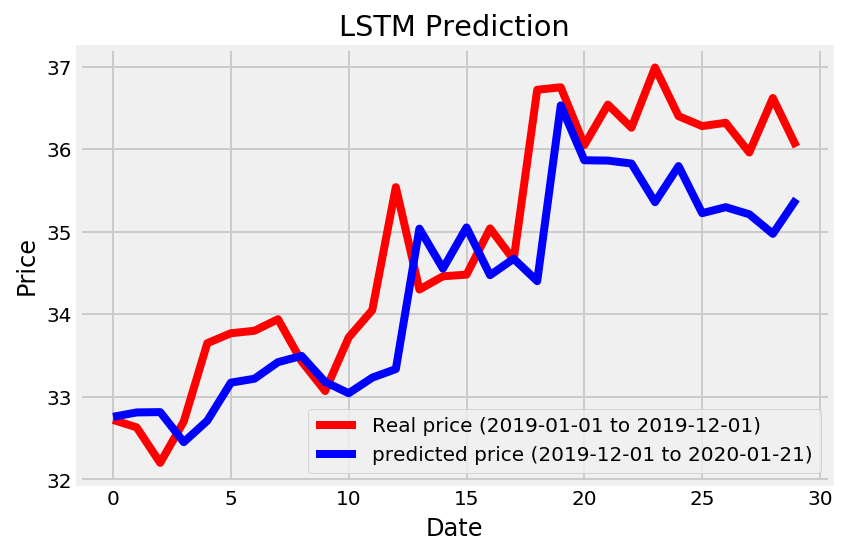

--------------------------
epochs is 80
batch_size:32
units num:110
--------------------------
Epoch 1/80
213/213 [==============================] - 31s 147ms/step - loss: 0.6279
Epoch 2/80
213/213 [==============================] - 4s 18ms/step - loss: 0.0360
Epoch 3/80
213/213 [==============================] - 4s 19ms/step - loss: 0.0205
Epoch 4/80
213/213 [==============================] - 4s 20ms/step - loss: 0.0231
Epoch 5/80
213/213 [==============================] - 4s 20ms/step - loss: 0.0319
Epoch 6/80
213/213 [==============================] - 4s 20ms/step - loss: 0.0208
Epoch 7/80
213/213 [==============================] - 4s 20ms/step - loss: 0.0384
Epoch 8/80
213/213 [==============================] - 4s 20ms/step - loss: 0.0259
Epoch 9/80
213/213 [==============================] - 4s 21ms/step - loss: 0.0325
Epoch 10/80
213/213 [==============================] - 4s 21ms/step - loss: 0.0406
Epoch 11/80
213/213 [==============================] - 4s 20ms/step - loss: 0.0563

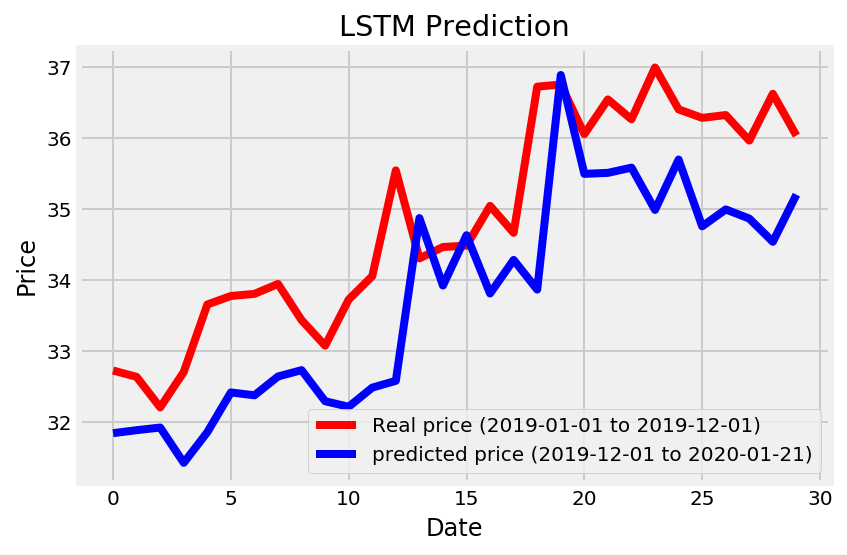

--------------------------
epochs is 110
batch_size:32
units num:50
--------------------------
Epoch 1/110
213/213 [==============================] - 31s 146ms/step - loss: 0.2599
Epoch 2/110
213/213 [==============================] - 4s 17ms/step - loss: 0.0267
Epoch 3/110
213/213 [==============================] - 4s 17ms/step - loss: 0.0195
Epoch 4/110
213/213 [==============================] - 4s 17ms/step - loss: 0.0194
Epoch 5/110
213/213 [==============================] - 4s 18ms/step - loss: 0.0185
Epoch 6/110
213/213 [==============================] - 4s 18ms/step - loss: 0.0308
Epoch 7/110
213/213 [==============================] - 4s 18ms/step - loss: 0.0294
Epoch 8/110
213/213 [==============================] - 4s 18ms/step - loss: 0.0373
Epoch 9/110
213/213 [==============================] - 4s 18ms/step - loss: 0.0234
Epoch 10/110
213/213 [==============================] - 4s 19ms/step - loss: 0.0338
Epoch 11/110
213/213 [==============================] - 4s 19ms/step - l

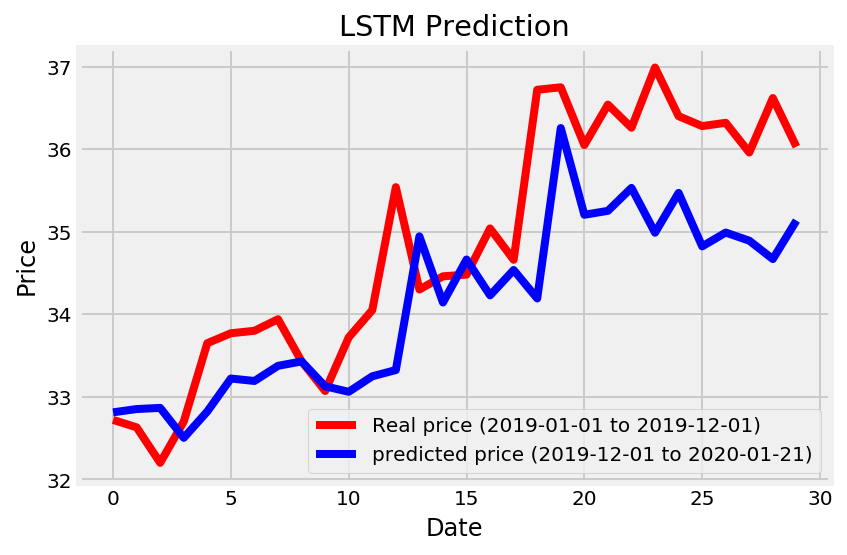

--------------------------
epochs is 110
batch_size:32
units num:80
--------------------------
Epoch 1/110
213/213 [==============================] - 32s 152ms/step - loss: 0.1781
Epoch 2/110
213/213 [==============================] - 4s 17ms/step - loss: 0.0231
Epoch 3/110
213/213 [==============================] - 4s 17ms/step - loss: 0.0341
Epoch 4/110
213/213 [==============================] - 4s 18ms/step - loss: 0.0380
Epoch 5/110
213/213 [==============================] - 4s 18ms/step - loss: 0.0353
Epoch 6/110
213/213 [==============================] - 4s 19ms/step - loss: 0.0254
Epoch 7/110
213/213 [==============================] - 4s 19ms/step - loss: 0.0369
Epoch 8/110
213/213 [==============================] - 4s 19ms/step - loss: 0.0251
Epoch 9/110
213/213 [==============================] - 4s 19ms/step - loss: 0.0272
Epoch 10/110
213/213 [==============================] - 4s 19ms/step - loss: 0.0312
Epoch 11/110
213/213 [==============================] - 4s 19ms/step - l

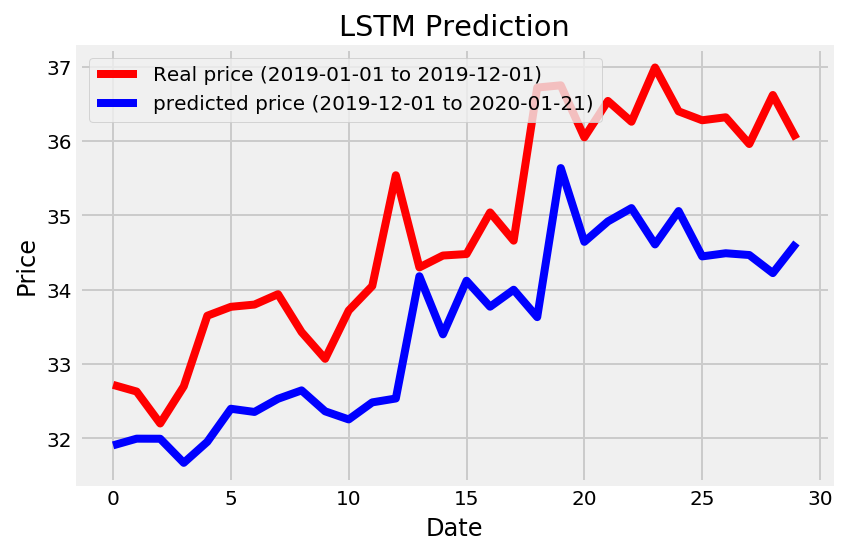

--------------------------
epochs is 110
batch_size:32
units num:110
--------------------------
Epoch 1/110
213/213 [==============================] - 33s 154ms/step - loss: 1.4020
Epoch 2/110
213/213 [==============================] - 4s 18ms/step - loss: 0.0230
Epoch 3/110
213/213 [==============================] - 4s 19ms/step - loss: 0.0187
Epoch 4/110
213/213 [==============================] - 4s 19ms/step - loss: 0.0200
Epoch 5/110
213/213 [==============================] - 4s 20ms/step - loss: 0.0299
Epoch 6/110
213/213 [==============================] - 4s 20ms/step - loss: 0.0194
Epoch 7/110
213/213 [==============================] - 4s 20ms/step - loss: 0.0279
Epoch 8/110
213/213 [==============================] - 4s 20ms/step - loss: 0.0353
Epoch 9/110
213/213 [==============================] - 4s 21ms/step - loss: 0.0337
Epoch 10/110
213/213 [==============================] - 4s 21ms/step - loss: 0.0384
Epoch 11/110
213/213 [==============================] - 4s 21ms/step - 

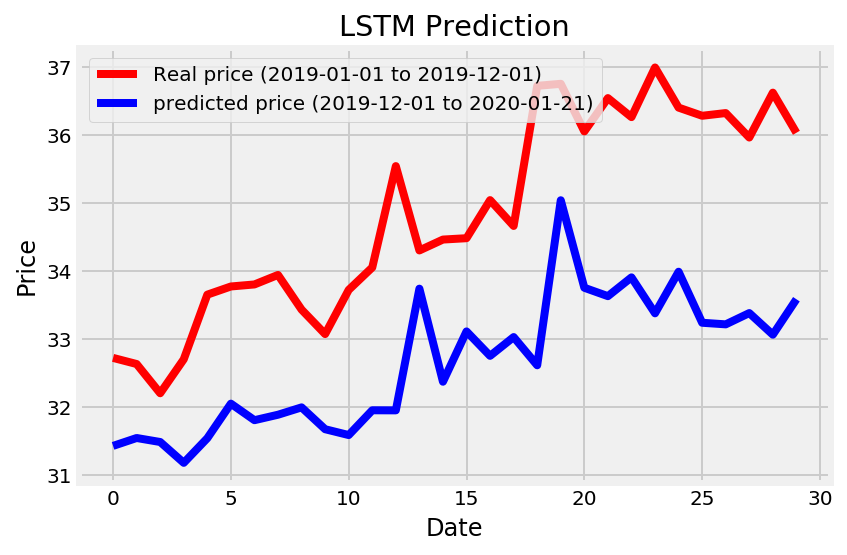

--------------------------
epochs is 150
batch_size:32
units num:50
--------------------------
Epoch 1/150
213/213 [==============================] - 33s 154ms/step - loss: 0.2726
Epoch 2/150
213/213 [==============================] - 4s 16ms/step - loss: 0.0238
Epoch 3/150
213/213 [==============================] - 4s 17ms/step - loss: 0.0212
Epoch 4/150
213/213 [==============================] - 4s 18ms/step - loss: 0.0238
Epoch 5/150
213/213 [==============================] - 4s 18ms/step - loss: 0.0194
Epoch 6/150
213/213 [==============================] - 4s 18ms/step - loss: 0.0274
Epoch 7/150
213/213 [==============================] - 4s 18ms/step - loss: 0.0244
Epoch 8/150
213/213 [==============================] - 4s 18ms/step - loss: 0.0314
Epoch 9/150
213/213 [==============================] - 4s 18ms/step - loss: 0.0406
Epoch 10/150
213/213 [==============================] - 4s 18ms/step - loss: 0.0188
Epoch 11/150
213/213 [==============================] - 4s 18ms/step - l

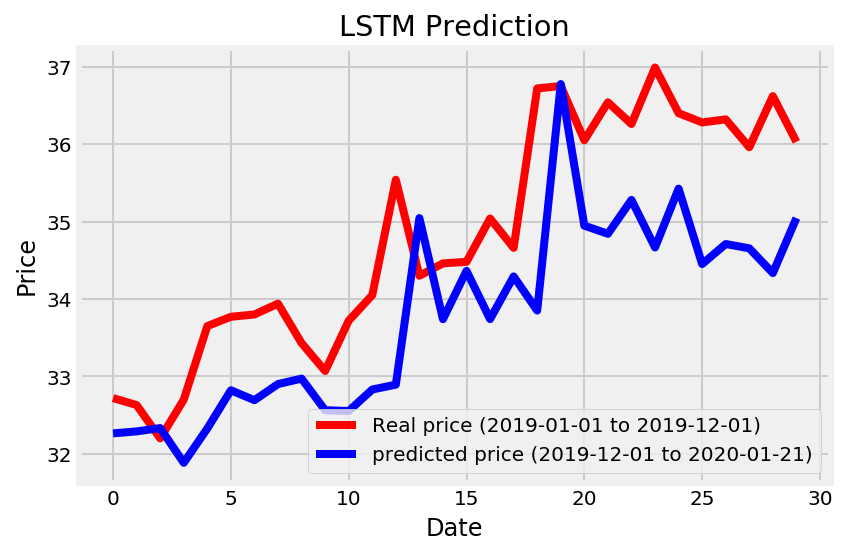

--------------------------
epochs is 150
batch_size:32
units num:80
--------------------------
Epoch 1/150
213/213 [==============================] - 33s 155ms/step - loss: 0.2363
Epoch 2/150
213/213 [==============================] - 4s 17ms/step - loss: 0.0247
Epoch 3/150
213/213 [==============================] - 4s 17ms/step - loss: 0.0222
Epoch 4/150
213/213 [==============================] - 4s 18ms/step - loss: 0.0227
Epoch 5/150
213/213 [==============================] - 4s 18ms/step - loss: 0.0342
Epoch 6/150
213/213 [==============================] - 4s 18ms/step - loss: 0.0377
Epoch 7/150
213/213 [==============================] - 4s 19ms/step - loss: 0.0277
Epoch 8/150
213/213 [==============================] - 4s 19ms/step - loss: 0.0287
Epoch 9/150
213/213 [==============================] - 4s 19ms/step - loss: 0.0346
Epoch 10/150
213/213 [==============================] - 4s 19ms/step - loss: 0.0251
Epoch 11/150
213/213 [==============================] - 4s 19ms/step - l

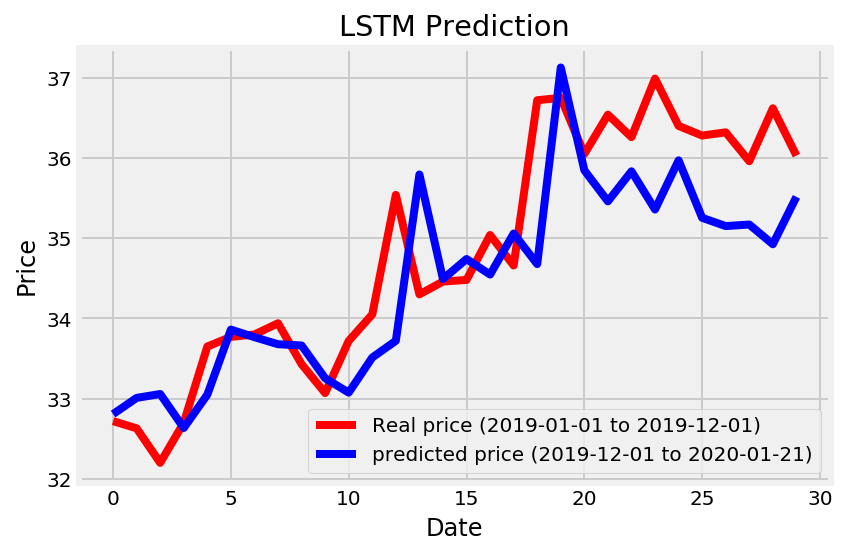

--------------------------
epochs is 150
batch_size:32
units num:110
--------------------------
Epoch 1/150
213/213 [==============================] - 34s 159ms/step - loss: 1.5790
Epoch 2/150
213/213 [==============================] - 4s 18ms/step - loss: 0.0202
Epoch 3/150
213/213 [==============================] - 4s 19ms/step - loss: 0.0185
Epoch 4/150
213/213 [==============================] - 4s 20ms/step - loss: 0.0189
Epoch 5/150
213/213 [==============================] - 4s 20ms/step - loss: 0.0172
Epoch 6/150
213/213 [==============================] - 4s 20ms/step - loss: 0.0357
Epoch 7/150
213/213 [==============================] - 4s 20ms/step - loss: 0.0300
Epoch 8/150
213/213 [==============================] - 4s 20ms/step - loss: 0.0180
Epoch 9/150
213/213 [==============================] - 4s 20ms/step - loss: 0.0514
Epoch 10/150
213/213 [==============================] - 4s 21ms/step - loss: 0.0394
Epoch 11/150
213/213 [==============================] - 4s 21ms/step - 

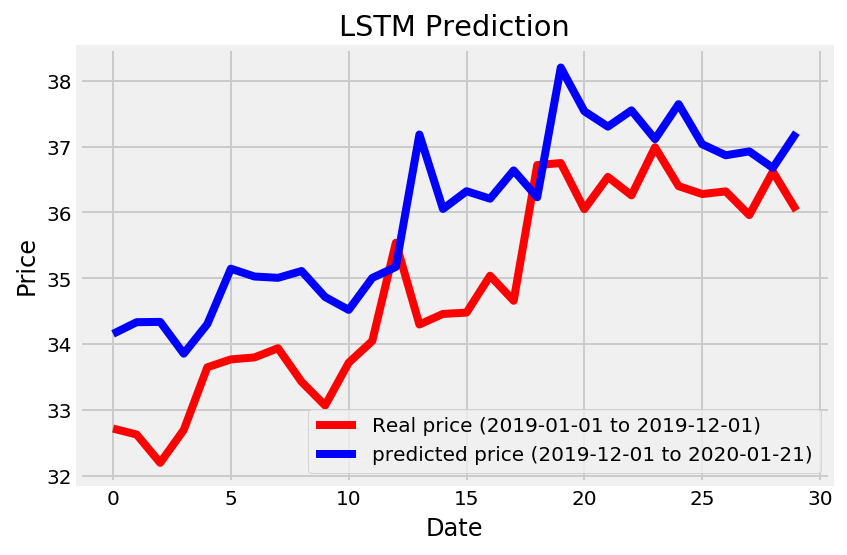

--------------------------
epochs is 50
batch_size:64
units num:50
--------------------------
Epoch 1/50
213/213 [==============================] - 32s 150ms/step - loss: 0.2522
Epoch 2/50
213/213 [==============================] - 2s 10ms/step - loss: 0.0631
Epoch 3/50
213/213 [==============================] - 2s 10ms/step - loss: 0.0207
Epoch 4/50
213/213 [==============================] - 2s 10ms/step - loss: 0.0206
Epoch 5/50
213/213 [==============================] - 2s 10ms/step - loss: 0.0193
Epoch 6/50
213/213 [==============================] - 2s 10ms/step - loss: 0.0202
Epoch 7/50
213/213 [==============================] - 2s 10ms/step - loss: 0.0188
Epoch 8/50
213/213 [==============================] - 2s 11ms/step - loss: 0.0187
Epoch 9/50
213/213 [==============================] - 2s 11ms/step - loss: 0.0323
Epoch 10/50
213/213 [==============================] - 2s 11ms/step - loss: 0.0182
Epoch 11/50
213/213 [==============================] - 2s 11ms/step - loss: 0.0313


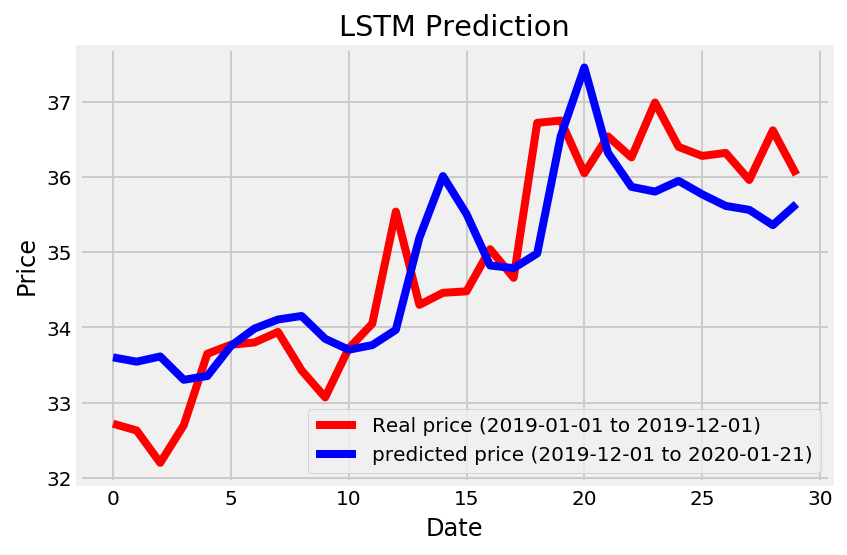

--------------------------
epochs is 50
batch_size:64
units num:80
--------------------------
Epoch 1/50
213/213 [==============================] - 33s 157ms/step - loss: 0.8094
Epoch 2/50
213/213 [==============================] - 2s 10ms/step - loss: 0.0853
Epoch 3/50
213/213 [==============================] - 2s 10ms/step - loss: 0.0254
Epoch 4/50
213/213 [==============================] - 2s 11ms/step - loss: 0.0190
Epoch 5/50
213/213 [==============================] - 2s 11ms/step - loss: 0.0180
Epoch 6/50
213/213 [==============================] - 2s 11ms/step - loss: 0.0180
Epoch 7/50
213/213 [==============================] - 2s 11ms/step - loss: 0.0204
Epoch 8/50
213/213 [==============================] - 2s 11ms/step - loss: 0.0186
Epoch 9/50
213/213 [==============================] - 2s 11ms/step - loss: 0.0180
Epoch 10/50
213/213 [==============================] - 2s 11ms/step - loss: 0.0191
Epoch 11/50
213/213 [==============================] - 2s 11ms/step - loss: 0.0317


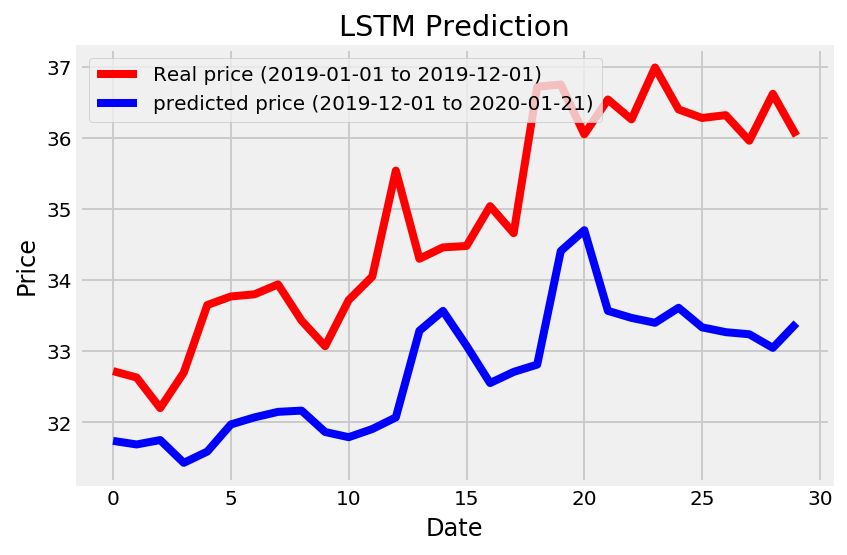

--------------------------
epochs is 50
batch_size:64
units num:110
--------------------------
Epoch 1/50
213/213 [==============================] - 34s 159ms/step - loss: 1.0720
Epoch 2/50
213/213 [==============================] - 3s 12ms/step - loss: 0.1585
Epoch 3/50
213/213 [==============================] - 3s 12ms/step - loss: 0.0544
Epoch 4/50
213/213 [==============================] - 3s 12ms/step - loss: 0.0211
Epoch 5/50
213/213 [==============================] - 3s 12ms/step - loss: 0.0206
Epoch 6/50
213/213 [==============================] - 3s 13ms/step - loss: 0.0217
Epoch 7/50
213/213 [==============================] - 3s 13ms/step - loss: 0.0193
Epoch 8/50
213/213 [==============================] - 3s 13ms/step - loss: 0.0180
Epoch 9/50
213/213 [==============================] - 3s 13ms/step - loss: 0.0149
Epoch 10/50
213/213 [==============================] - 3s 13ms/step - loss: 0.0259
Epoch 11/50
213/213 [==============================] - 3s 13ms/step - loss: 0.0796

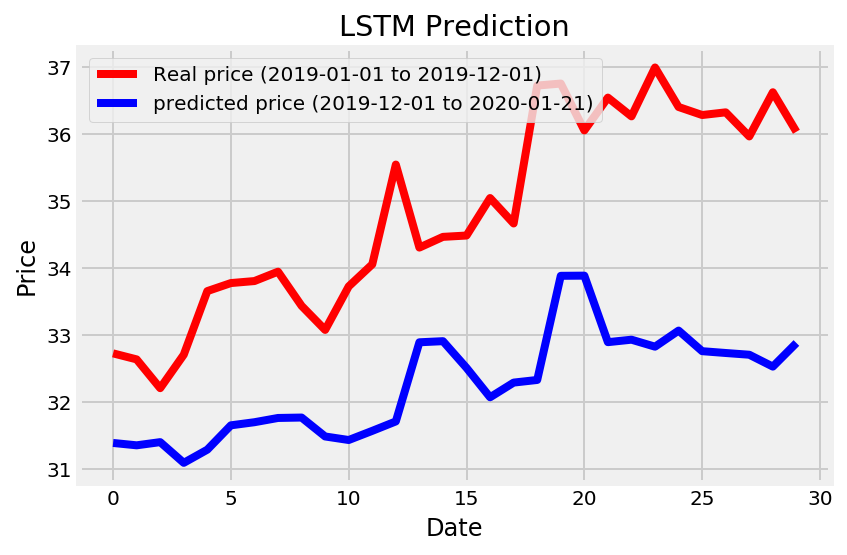

--------------------------
epochs is 80
batch_size:64
units num:50
--------------------------
Epoch 1/80
213/213 [==============================] - 34s 158ms/step - loss: 0.2207
Epoch 2/80
213/213 [==============================] - 2s 10ms/step - loss: 0.0737
Epoch 3/80
213/213 [==============================] - 2s 10ms/step - loss: 0.0203
Epoch 4/80
213/213 [==============================] - 2s 10ms/step - loss: 0.0198
Epoch 5/80
213/213 [==============================] - 2s 10ms/step - loss: 0.0194
Epoch 6/80
213/213 [==============================] - 2s 10ms/step - loss: 0.0188
Epoch 7/80
213/213 [==============================] - 2s 10ms/step - loss: 0.0335
Epoch 8/80
213/213 [==============================] - 2s 10ms/step - loss: 0.0198
Epoch 9/80
213/213 [==============================] - 2s 10ms/step - loss: 0.0354
Epoch 10/80
213/213 [==============================] - 2s 11ms/step - loss: 0.0168
Epoch 11/80
213/213 [==============================] - 2s 10ms/step - loss: 0.0405


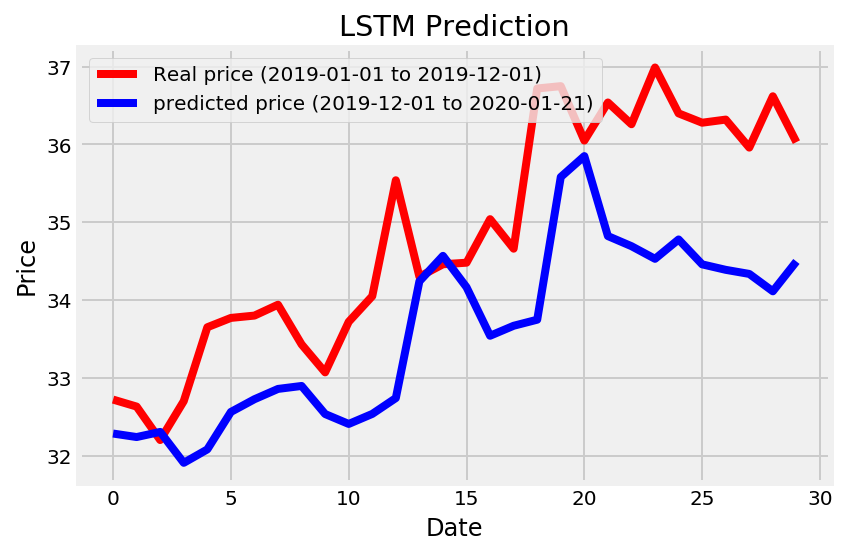

--------------------------
epochs is 80
batch_size:64
units num:80
--------------------------
Epoch 1/80
213/213 [==============================] - 34s 162ms/step - loss: 0.5846
Epoch 2/80
213/213 [==============================] - 2s 10ms/step - loss: 0.1185
Epoch 3/80
213/213 [==============================] - 2s 10ms/step - loss: 0.0285
Epoch 4/80
213/213 [==============================] - 2s 10ms/step - loss: 0.0187
Epoch 5/80
213/213 [==============================] - 2s 11ms/step - loss: 0.0187
Epoch 6/80
213/213 [==============================] - 2s 11ms/step - loss: 0.0207
Epoch 7/80
213/213 [==============================] - 2s 11ms/step - loss: 0.0192
Epoch 8/80
213/213 [==============================] - 2s 11ms/step - loss: 0.0243
Epoch 9/80
213/213 [==============================] - 2s 11ms/step - loss: 0.0229
Epoch 10/80
213/213 [==============================] - 2s 11ms/step - loss: 0.0319
Epoch 11/80
213/213 [==============================] - 2s 11ms/step - loss: 0.0256


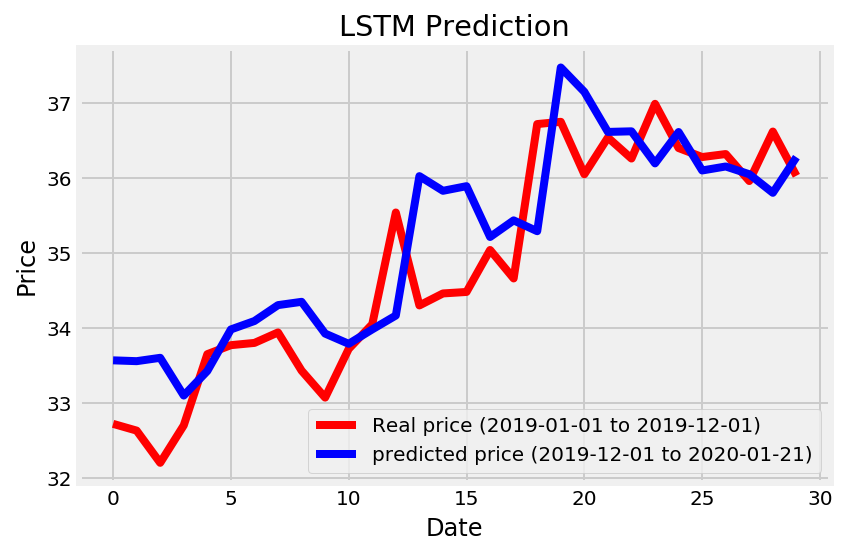

--------------------------
epochs is 80
batch_size:64
units num:110
--------------------------
Epoch 1/80
213/213 [==============================] - 37s 175ms/step - loss: 2.3934
Epoch 2/80
213/213 [==============================] - 2s 11ms/step - loss: 0.0911
Epoch 3/80
213/213 [==============================] - 2s 12ms/step - loss: 0.0215
Epoch 4/80
213/213 [==============================] - 3s 12ms/step - loss: 0.0183
Epoch 5/80
213/213 [==============================] - 3s 12ms/step - loss: 0.0195
Epoch 6/80
213/213 [==============================] - 3s 13ms/step - loss: 0.0183
Epoch 7/80
213/213 [==============================] - 3s 13ms/step - loss: 0.0169
Epoch 8/80
213/213 [==============================] - 3s 13ms/step - loss: 0.0221
Epoch 9/80
213/213 [==============================] - 3s 13ms/step - loss: 0.0221
Epoch 10/80
213/213 [==============================] - 3s 13ms/step - loss: 0.0252
Epoch 11/80
213/213 [==============================] - 3s 13ms/step - loss: 0.0175

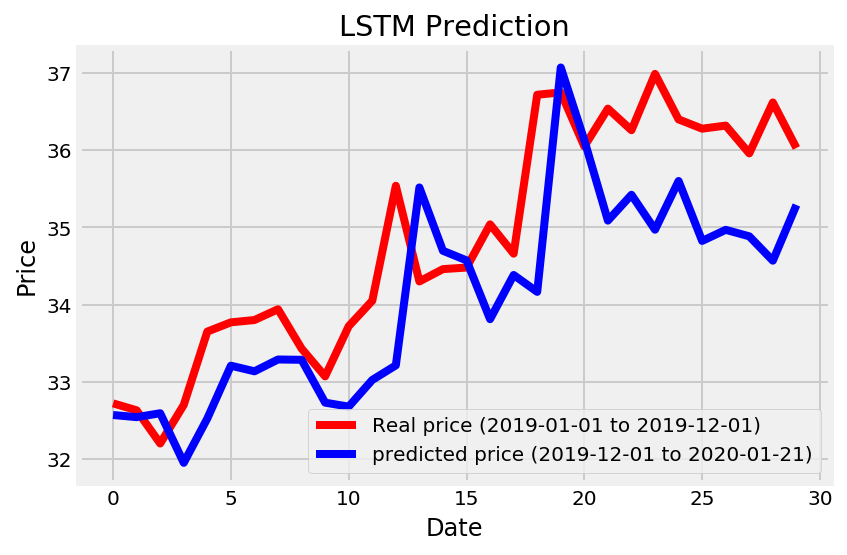

--------------------------
epochs is 110
batch_size:64
units num:50
--------------------------
Epoch 1/110
213/213 [==============================] - 36s 171ms/step - loss: 0.2262
Epoch 2/110
213/213 [==============================] - 2s 10ms/step - loss: 0.0701
Epoch 3/110
213/213 [==============================] - 2s 10ms/step - loss: 0.0194
Epoch 4/110
213/213 [==============================] - 2s 10ms/step - loss: 0.0241
Epoch 5/110
213/213 [==============================] - 2s 10ms/step - loss: 0.0219
Epoch 6/110
213/213 [==============================] - 2s 10ms/step - loss: 0.0236
Epoch 7/110
213/213 [==============================] - 2s 10ms/step - loss: 0.0223
Epoch 8/110
213/213 [==============================] - 2s 10ms/step - loss: 0.0321
Epoch 9/110
213/213 [==============================] - 2s 11ms/step - loss: 0.0311
Epoch 10/110
213/213 [==============================] - 2s 11ms/step - loss: 0.0219
Epoch 11/110
213/213 [==============================] - 2s 11ms/step - l

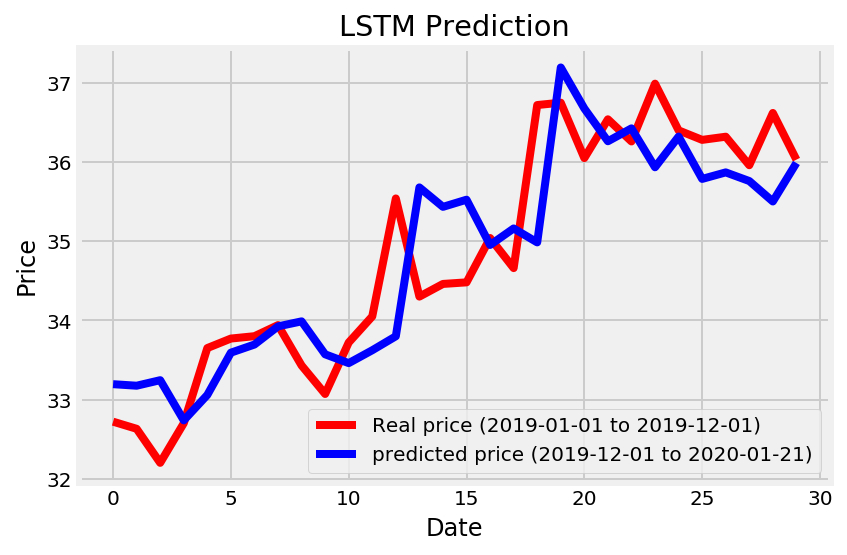

--------------------------
epochs is 110
batch_size:64
units num:80
--------------------------
Epoch 1/110
213/213 [==============================] - 37s 172ms/step - loss: 0.3605
Epoch 2/110
213/213 [==============================] - 2s 10ms/step - loss: 0.1099
Epoch 3/110
213/213 [==============================] - 2s 10ms/step - loss: 0.0231
Epoch 4/110
213/213 [==============================] - 2s 10ms/step - loss: 0.0228
Epoch 5/110
213/213 [==============================] - 2s 11ms/step - loss: 0.0223
Epoch 6/110
213/213 [==============================] - 2s 11ms/step - loss: 0.0230
Epoch 7/110
213/213 [==============================] - 2s 11ms/step - loss: 0.0260
Epoch 8/110
213/213 [==============================] - 2s 11ms/step - loss: 0.0254
Epoch 9/110
213/213 [==============================] - 2s 11ms/step - loss: 0.0209
Epoch 10/110
213/213 [==============================] - 2s 11ms/step - loss: 0.0377
Epoch 11/110
213/213 [==============================] - 2s 11ms/step - l

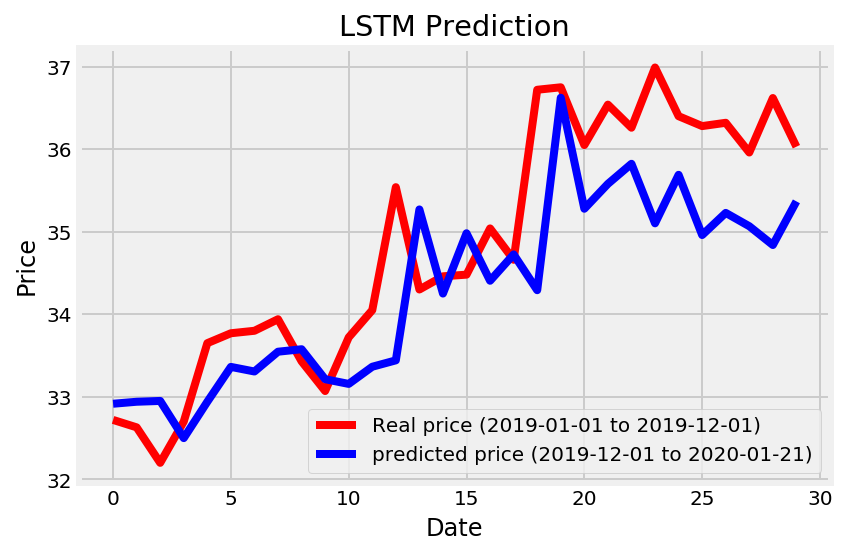

--------------------------
epochs is 110
batch_size:64
units num:110
--------------------------
Epoch 1/110
213/213 [==============================] - 37s 174ms/step - loss: 1.2770
Epoch 2/110
213/213 [==============================] - 2s 12ms/step - loss: 0.1286
Epoch 3/110
213/213 [==============================] - 3s 12ms/step - loss: 0.0295
Epoch 4/110
213/213 [==============================] - 3s 12ms/step - loss: 0.0185
Epoch 5/110
213/213 [==============================] - 3s 12ms/step - loss: 0.0203
Epoch 6/110
213/213 [==============================] - 3s 13ms/step - loss: 0.0245
Epoch 7/110
213/213 [==============================] - 3s 13ms/step - loss: 0.0204
Epoch 8/110
213/213 [==============================] - 3s 13ms/step - loss: 0.0182
Epoch 9/110
213/213 [==============================] - 3s 13ms/step - loss: 0.0323
Epoch 10/110
213/213 [==============================] - 3s 13ms/step - loss: 0.0284
Epoch 11/110
213/213 [==============================] - 3s 13ms/step - 

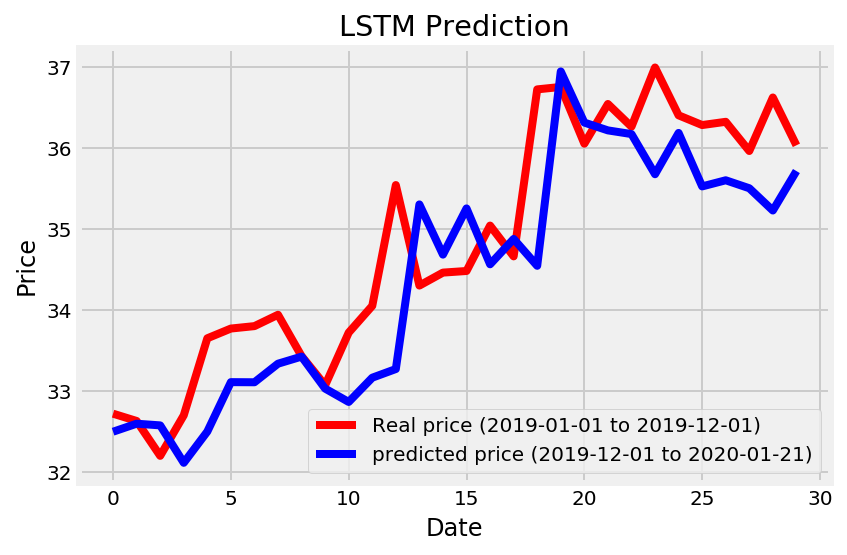

--------------------------
epochs is 150
batch_size:32
units num:50
--------------------------
Epoch 1/150
213/213 [==============================] - 39s 181ms/step - loss: 0.1586
Epoch 2/150
213/213 [==============================] - 4s 16ms/step - loss: 0.0216
Epoch 3/150
213/213 [==============================] - 4s 17ms/step - loss: 0.0234
Epoch 4/150
213/213 [==============================] - 4s 18ms/step - loss: 0.0392
Epoch 5/150
213/213 [==============================] - 4s 18ms/step - loss: 0.0308
Epoch 6/150
213/213 [==============================] - 4s 18ms/step - loss: 0.0303
Epoch 7/150
213/213 [==============================] - 4s 18ms/step - loss: 0.0308
Epoch 8/150
213/213 [==============================] - 4s 18ms/step - loss: 0.0367
Epoch 9/150
213/213 [==============================] - 4s 19ms/step - loss: 0.0165
Epoch 10/150
213/213 [==============================] - 4s 19ms/step - loss: 0.0300
Epoch 11/150
213/213 [==============================] - 4s 19ms/step - l

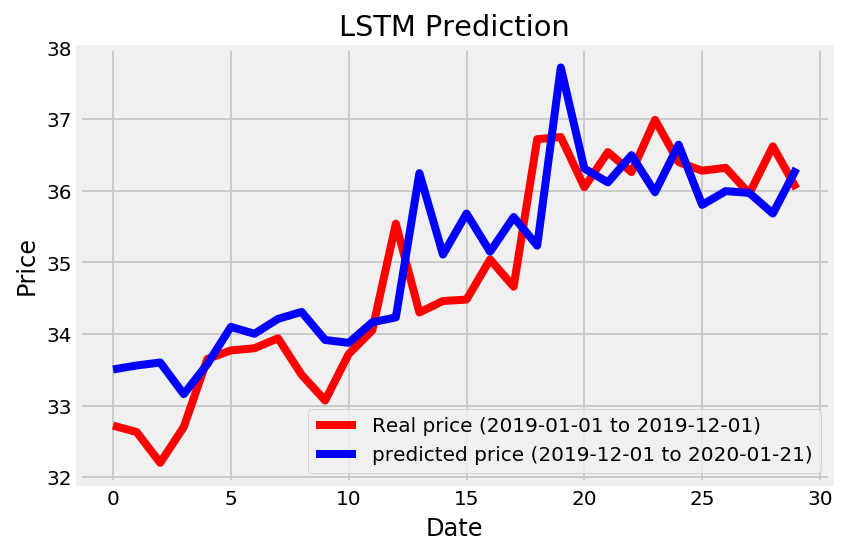

--------------------------
epochs is 150
batch_size:32
units num:80
--------------------------
Epoch 1/150
213/213 [==============================] - 40s 186ms/step - loss: 0.1375
Epoch 2/150
213/213 [==============================] - 4s 17ms/step - loss: 0.0592
Epoch 3/150
213/213 [==============================] - 4s 17ms/step - loss: 0.0261
Epoch 4/150
213/213 [==============================] - 4s 18ms/step - loss: 0.0332
Epoch 5/150
213/213 [==============================] - 4s 19ms/step - loss: 0.0354
Epoch 6/150
213/213 [==============================] - 4s 19ms/step - loss: 0.0477
Epoch 7/150
213/213 [==============================] - 4s 19ms/step - loss: 0.0251
Epoch 8/150
213/213 [==============================] - 4s 19ms/step - loss: 0.0325
Epoch 9/150
213/213 [==============================] - 4s 19ms/step - loss: 0.0211
Epoch 10/150
213/213 [==============================] - 4s 19ms/step - loss: 0.0272
Epoch 11/150
213/213 [==============================] - 4s 19ms/step - l

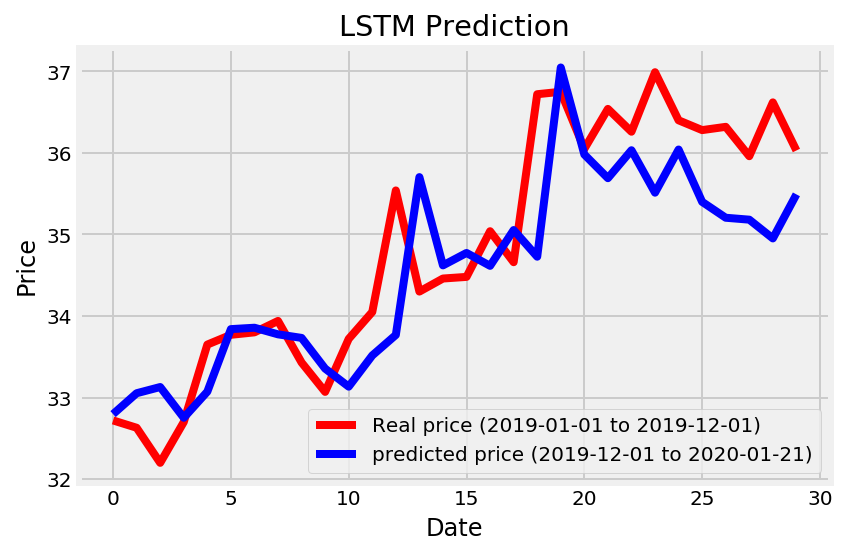

--------------------------
epochs is 150
batch_size:32
units num:110
--------------------------
Epoch 1/150
213/213 [==============================] - 40s 187ms/step - loss: 1.1982
Epoch 2/150
213/213 [==============================] - 4s 18ms/step - loss: 0.0317
Epoch 3/150
213/213 [==============================] - 4s 18ms/step - loss: 0.0193
Epoch 4/150
213/213 [==============================] - 4s 20ms/step - loss: 0.0190
Epoch 5/150
213/213 [==============================] - 4s 20ms/step - loss: 0.0228
Epoch 6/150
213/213 [==============================] - 4s 20ms/step - loss: 0.0219
Epoch 7/150
213/213 [==============================] - 4s 20ms/step - loss: 0.0170
Epoch 8/150
213/213 [==============================] - 4s 20ms/step - loss: 0.0341
Epoch 9/150
213/213 [==============================] - 4s 20ms/step - loss: 0.0309
Epoch 10/150
213/213 [==============================] - 4s 21ms/step - loss: 0.0302
Epoch 11/150
213/213 [==============================] - 4s 21ms/step - 

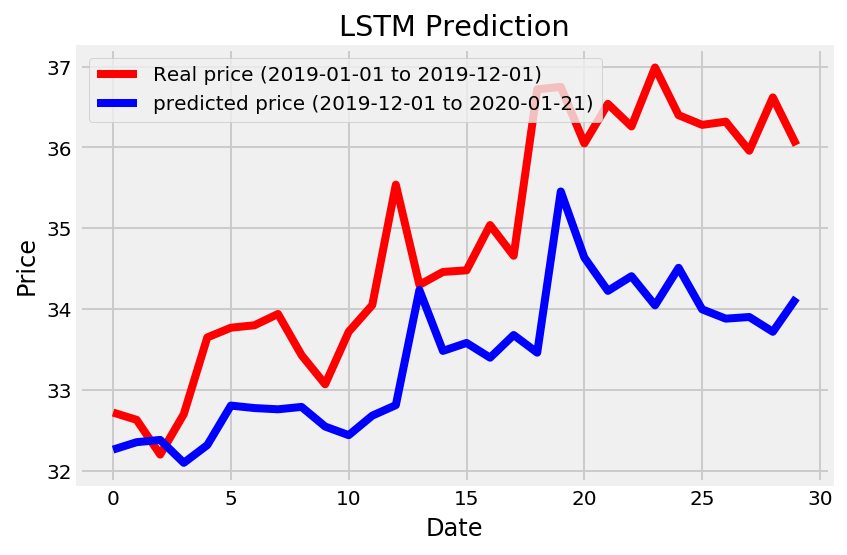

number of previous days in features: 30

y scales:[0.0277585],
x scaled:[0.0277585  0.21842857 0.6165454  0.15570526 0.09498607 0.68778477
 0.         0.16266492 0.12318841 0.48480243 0.11832947 0.07784431]

length of X_1:228

length of X train set is: 198
length of y train set is: 198

--------------------------
epochs is 50
batch_size:32
units num:50
--------------------------
Epoch 1/50
198/198 [==============================] - 44s 220ms/step - loss: 0.1445
Epoch 2/50
198/198 [==============================] - 7s 37ms/step - loss: 0.0332
Epoch 3/50
198/198 [==============================] - 8s 39ms/step - loss: 0.0307
Epoch 4/50
198/198 [==============================] - 8s 40ms/step - loss: 0.0254
Epoch 5/50
198/198 [==============================] - 8s 39ms/step - loss: 0.0312
Epoch 6/50
198/198 [==============================] - 8s 40ms/step - loss: 0.0335
Epoch 7/50
198/198 [==============================] - 8s 41ms/step - loss: 0.0190
Epoch 8/50
198/198 [======================

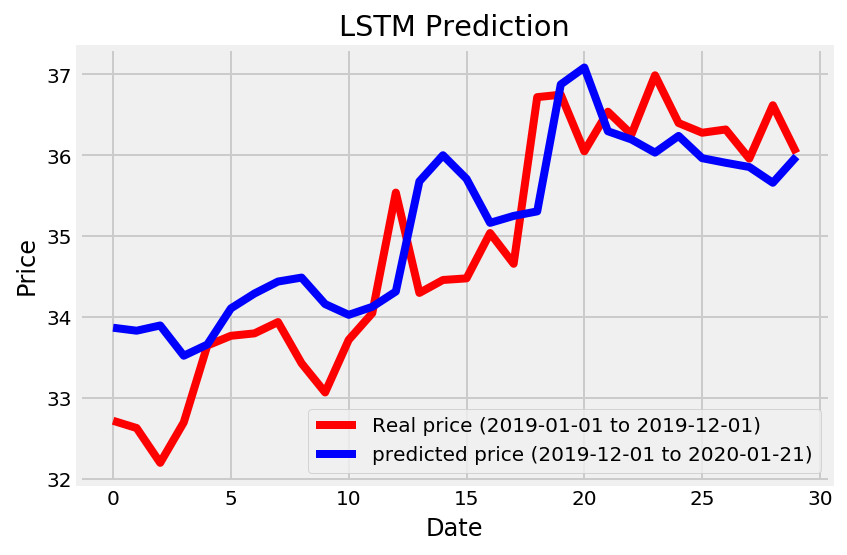

--------------------------
epochs is 50
batch_size:32
units num:80
--------------------------
Epoch 1/50
198/198 [==============================] - 44s 224ms/step - loss: 0.1896
Epoch 2/50
198/198 [==============================] - 7s 38ms/step - loss: 0.0381
Epoch 3/50
198/198 [==============================] - 8s 40ms/step - loss: 0.0322
Epoch 4/50
198/198 [==============================] - 8s 40ms/step - loss: 0.0862
Epoch 5/50
198/198 [==============================] - 8s 41ms/step - loss: 0.0209
Epoch 6/50
198/198 [==============================] - 8s 42ms/step - loss: 0.0235
Epoch 7/50
198/198 [==============================] - 8s 42ms/step - loss: 0.0252
Epoch 8/50
198/198 [==============================] - 8s 42ms/step - loss: 0.0157
Epoch 9/50
198/198 [==============================] - 8s 41ms/step - loss: 0.0493
Epoch 10/50
198/198 [==============================] - 8s 42ms/step - loss: 0.0162
Epoch 11/50
198/198 [==============================] - 8s 41ms/step - loss: 0.0427


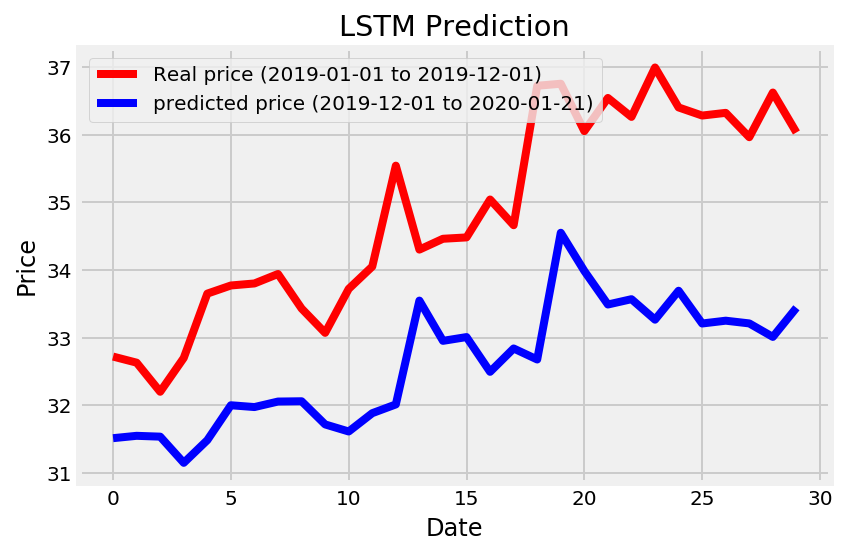

--------------------------
epochs is 50
batch_size:32
units num:110
--------------------------
Epoch 1/50
198/198 [==============================] - 45s 228ms/step - loss: 1.5421
Epoch 2/50
198/198 [==============================] - 8s 41ms/step - loss: 0.0285
Epoch 3/50
198/198 [==============================] - 9s 43ms/step - loss: 0.0177
Epoch 4/50
198/198 [==============================] - 9s 43ms/step - loss: 0.0172
Epoch 5/50
198/198 [==============================] - 9s 44ms/step - loss: 0.0248
Epoch 6/50
198/198 [==============================] - 9s 44ms/step - loss: 0.0162
Epoch 7/50
198/198 [==============================] - 9s 45ms/step - loss: 0.0313
Epoch 8/50
198/198 [==============================] - 9s 44ms/step - loss: 0.0178
Epoch 9/50
198/198 [==============================] - 9s 44ms/step - loss: 0.0429
Epoch 10/50
198/198 [==============================] - 9s 44ms/step - loss: 0.0385
Epoch 11/50
198/198 [==============================] - 9s 44ms/step - loss: 0.0228

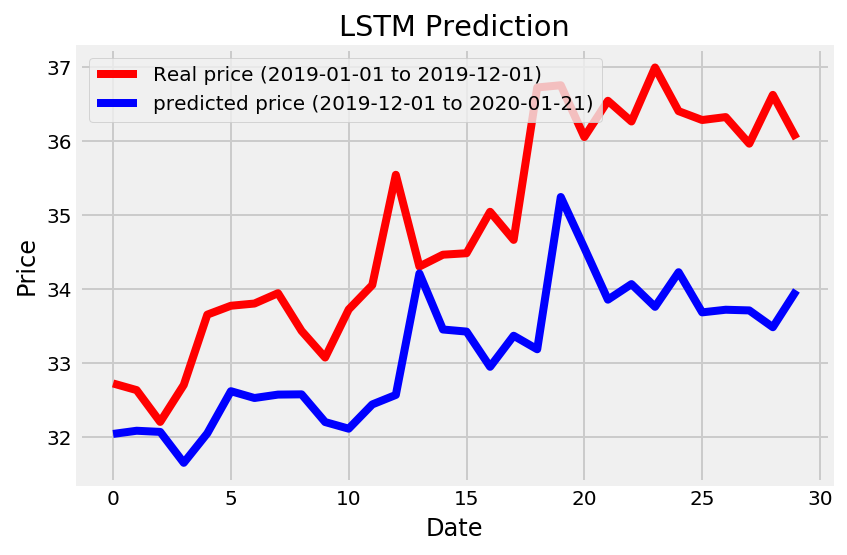

--------------------------
epochs is 80
batch_size:32
units num:50
--------------------------
Epoch 1/80
198/198 [==============================] - 45s 225ms/step - loss: 0.2558
Epoch 2/80
198/198 [==============================] - 7s 37ms/step - loss: 0.0261
Epoch 3/80
198/198 [==============================] - 8s 39ms/step - loss: 0.0168
Epoch 4/80
198/198 [==============================] - 8s 40ms/step - loss: 0.0176
Epoch 5/80
198/198 [==============================] - 8s 40ms/step - loss: 0.0174
Epoch 6/80
198/198 [==============================] - 8s 40ms/step - loss: 0.0316
Epoch 7/80
198/198 [==============================] - 8s 41ms/step - loss: 0.0220
Epoch 8/80
198/198 [==============================] - 8s 41ms/step - loss: 0.0303
Epoch 9/80
198/198 [==============================] - 8s 41ms/step - loss: 0.0330
Epoch 10/80
198/198 [==============================] - 8s 41ms/step - loss: 0.0184
Epoch 11/80
198/198 [==============================] - 8s 41ms/step - loss: 0.0340


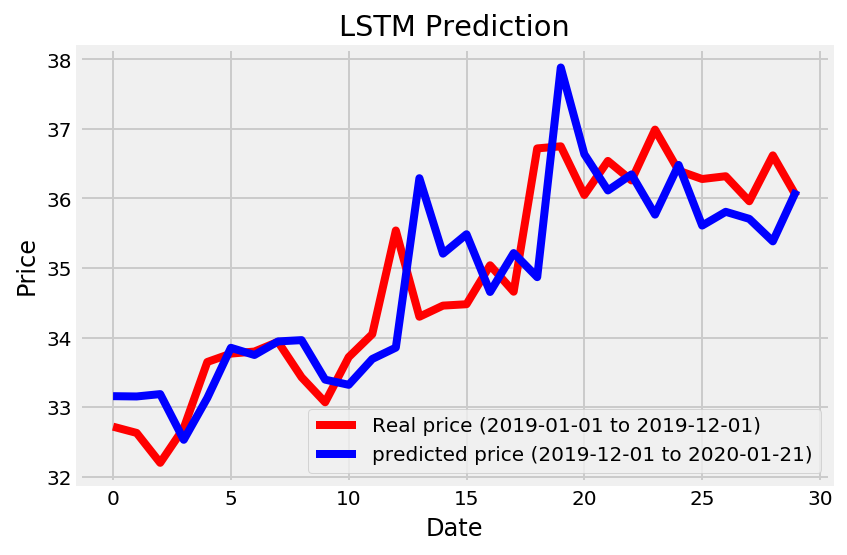

--------------------------
epochs is 80
batch_size:32
units num:80
--------------------------
Epoch 1/80
198/198 [==============================] - 45s 228ms/step - loss: 0.9704
Epoch 2/80
198/198 [==============================] - 8s 38ms/step - loss: 0.0207
Epoch 3/80
198/198 [==============================] - 8s 40ms/step - loss: 0.0187
Epoch 4/80
198/198 [==============================] - 8s 40ms/step - loss: 0.0158
Epoch 5/80
198/198 [==============================] - 8s 41ms/step - loss: 0.0190
Epoch 6/80
198/198 [==============================] - 8s 42ms/step - loss: 0.0159
Epoch 7/80
198/198 [==============================] - 8s 42ms/step - loss: 0.0382
Epoch 8/80
198/198 [==============================] - 8s 42ms/step - loss: 0.0390
Epoch 9/80
198/198 [==============================] - 8s 41ms/step - loss: 0.0152
Epoch 10/80
198/198 [==============================] - 8s 41ms/step - loss: 0.0381
Epoch 11/80
198/198 [==============================] - 8s 41ms/step - loss: 0.0317


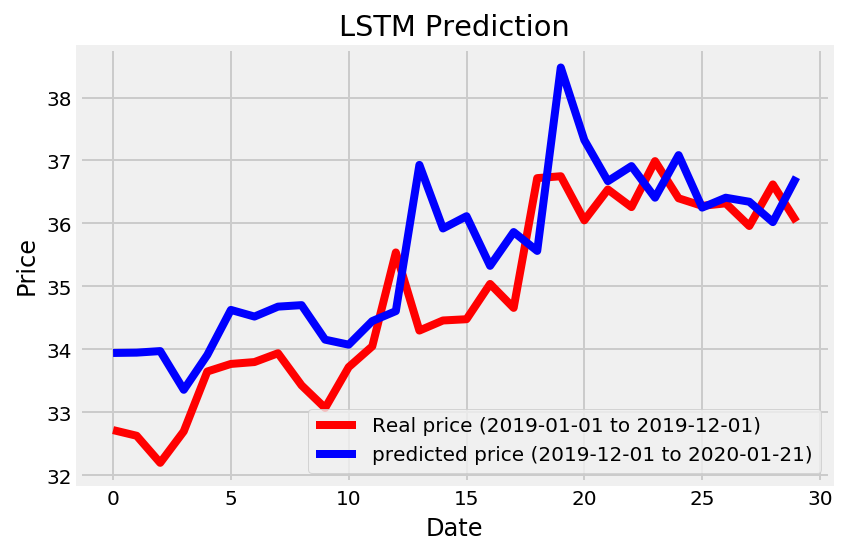

--------------------------
epochs is 80
batch_size:32
units num:110
--------------------------
Epoch 1/80
198/198 [==============================] - 47s 236ms/step - loss: 0.4728
Epoch 2/80
198/198 [==============================] - 8s 41ms/step - loss: 0.0431
Epoch 3/80
198/198 [==============================] - 9s 43ms/step - loss: 0.0508
Epoch 4/80
198/198 [==============================] - 9s 43ms/step - loss: 0.0172
Epoch 5/80
198/198 [==============================] - 9s 44ms/step - loss: 0.0195
Epoch 6/80
198/198 [==============================] - 9s 44ms/step - loss: 0.0410
Epoch 7/80
198/198 [==============================] - 9s 44ms/step - loss: 0.0156
Epoch 8/80
198/198 [==============================] - 9s 44ms/step - loss: 0.0448
Epoch 9/80
198/198 [==============================] - 9s 44ms/step - loss: 0.0280
Epoch 10/80
198/198 [==============================] - 9s 45ms/step - loss: 0.0271
Epoch 11/80
198/198 [==============================] - 9s 44ms/step - loss: 0.0385

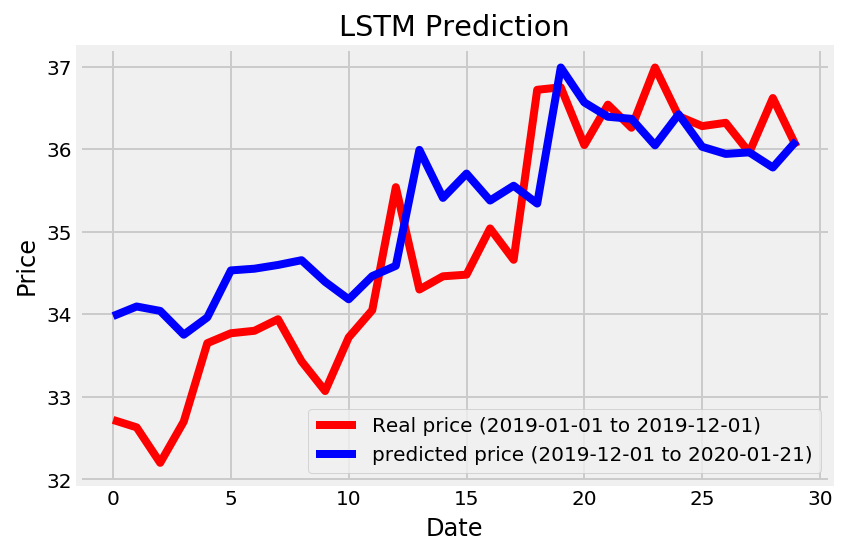

--------------------------
epochs is 110
batch_size:32
units num:50
--------------------------
Epoch 1/110
198/198 [==============================] - 46s 234ms/step - loss: 0.2791
Epoch 2/110
198/198 [==============================] - 7s 37ms/step - loss: 0.0199
Epoch 3/110
198/198 [==============================] - 8s 38ms/step - loss: 0.0190
Epoch 4/110
198/198 [==============================] - 8s 39ms/step - loss: 0.0193
Epoch 5/110
198/198 [==============================] - 8s 39ms/step - loss: 0.0276
Epoch 6/110
198/198 [==============================] - 8s 40ms/step - loss: 0.0291
Epoch 7/110
198/198 [==============================] - 8s 41ms/step - loss: 0.0183
Epoch 8/110
198/198 [==============================] - 8s 41ms/step - loss: 0.0349
Epoch 9/110
198/198 [==============================] - 8s 41ms/step - loss: 0.0290
Epoch 10/110
198/198 [==============================] - 8s 41ms/step - loss: 0.0167
Epoch 11/110
198/198 [==============================] - 8s 41ms/step - l

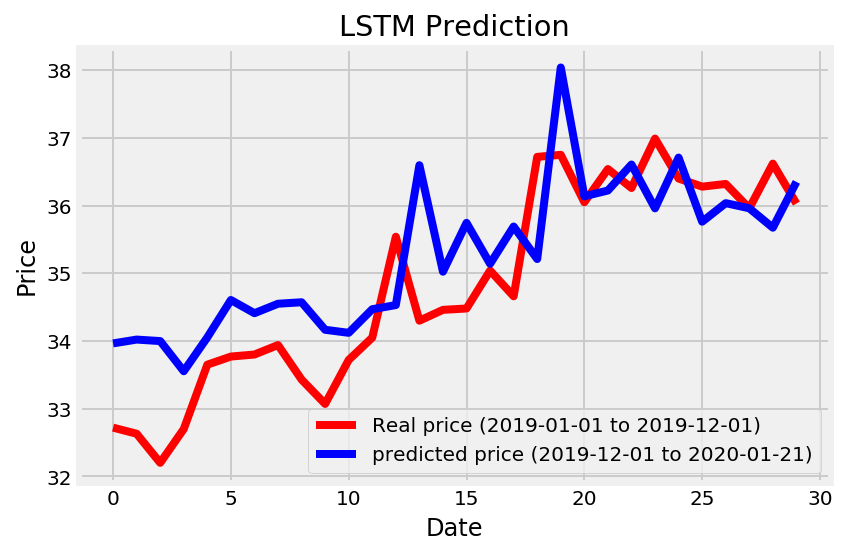

--------------------------
epochs is 110
batch_size:32
units num:80
--------------------------
Epoch 1/110
198/198 [==============================] - 47s 236ms/step - loss: 0.2783
Epoch 2/110
198/198 [==============================] - 8s 38ms/step - loss: 0.0234
Epoch 3/110
198/198 [==============================] - 8s 40ms/step - loss: 0.0215
Epoch 4/110
198/198 [==============================] - 8s 40ms/step - loss: 0.0200
Epoch 5/110
198/198 [==============================] - 8s 41ms/step - loss: 0.0323
Epoch 6/110
198/198 [==============================] - 8s 41ms/step - loss: 0.0184
Epoch 7/110
198/198 [==============================] - 8s 42ms/step - loss: 0.0469
Epoch 8/110
198/198 [==============================] - 8s 42ms/step - loss: 0.0243
Epoch 9/110
198/198 [==============================] - 8s 42ms/step - loss: 0.0333
Epoch 10/110
198/198 [==============================] - 8s 42ms/step - loss: 0.0175
Epoch 11/110
198/198 [==============================] - 8s 42ms/step - l

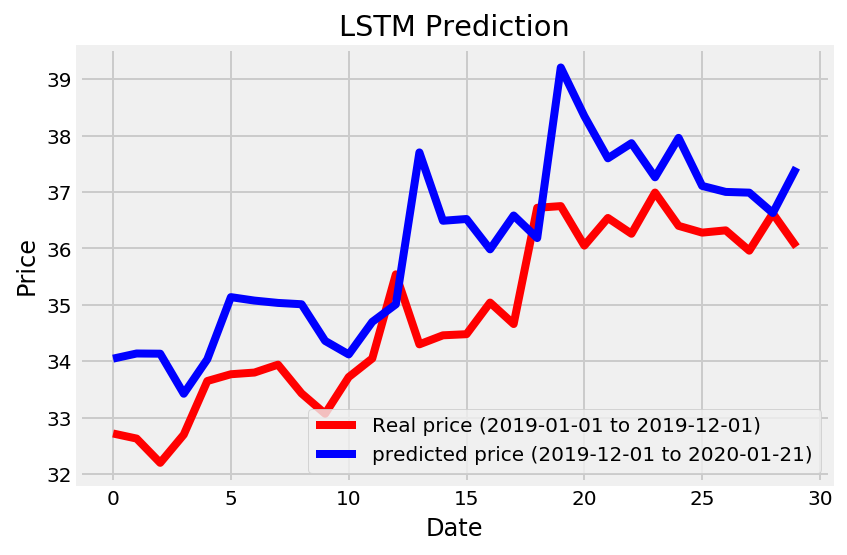

--------------------------
epochs is 110
batch_size:32
units num:110
--------------------------
Epoch 1/110
198/198 [==============================] - 48s 240ms/step - loss: 0.6583
Epoch 2/110
198/198 [==============================] - 8s 41ms/step - loss: 0.0277
Epoch 3/110
198/198 [==============================] - 9s 43ms/step - loss: 0.0212
Epoch 4/110
198/198 [==============================] - 9s 43ms/step - loss: 0.0294
Epoch 5/110
198/198 [==============================] - 9s 43ms/step - loss: 0.0220
Epoch 6/110
198/198 [==============================] - 9s 44ms/step - loss: 0.0249
Epoch 7/110
198/198 [==============================] - 9s 45ms/step - loss: 0.0276
Epoch 8/110
198/198 [==============================] - 9s 45ms/step - loss: 0.0300
Epoch 9/110
198/198 [==============================] - 9s 45ms/step - loss: 0.0340
Epoch 10/110
198/198 [==============================] - 9s 45ms/step - loss: 0.0184
Epoch 11/110
198/198 [==============================] - 9s 45ms/step - 

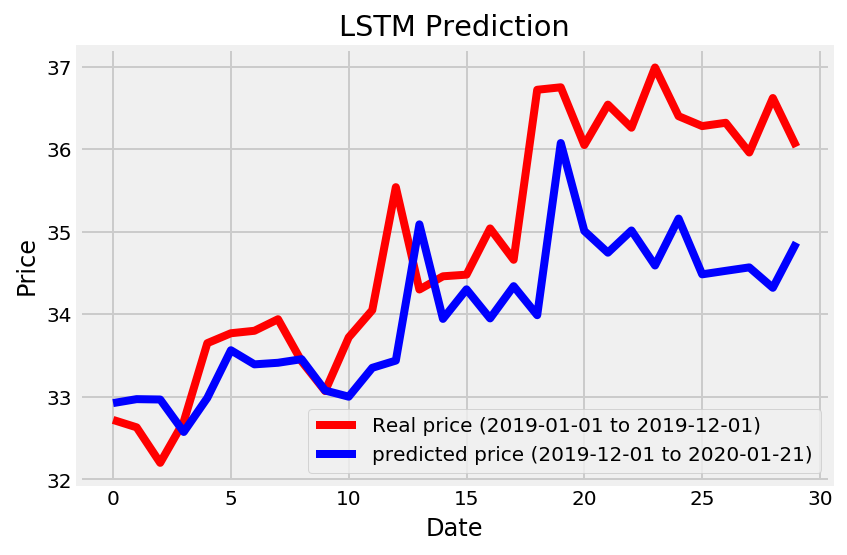

--------------------------
epochs is 150
batch_size:32
units num:50
--------------------------
Epoch 1/150
198/198 [==============================] - 47s 239ms/step - loss: 0.2262
Epoch 2/150
198/198 [==============================] - 7s 36ms/step - loss: 0.0213
Epoch 3/150
198/198 [==============================] - 8s 39ms/step - loss: 0.0208
Epoch 4/150
198/198 [==============================] - 8s 40ms/step - loss: 0.0188
Epoch 5/150
198/198 [==============================] - 8s 39ms/step - loss: 0.0187
Epoch 6/150
198/198 [==============================] - 8s 40ms/step - loss: 0.0436
Epoch 7/150
198/198 [==============================] - 8s 41ms/step - loss: 0.0159
Epoch 8/150
198/198 [==============================] - 8s 41ms/step - loss: 0.0235
Epoch 9/150
198/198 [==============================] - 8s 41ms/step - loss: 0.0608
Epoch 10/150
198/198 [==============================] - 8s 41ms/step - loss: 0.0169
Epoch 11/150
198/198 [==============================] - 8s 41ms/step - l

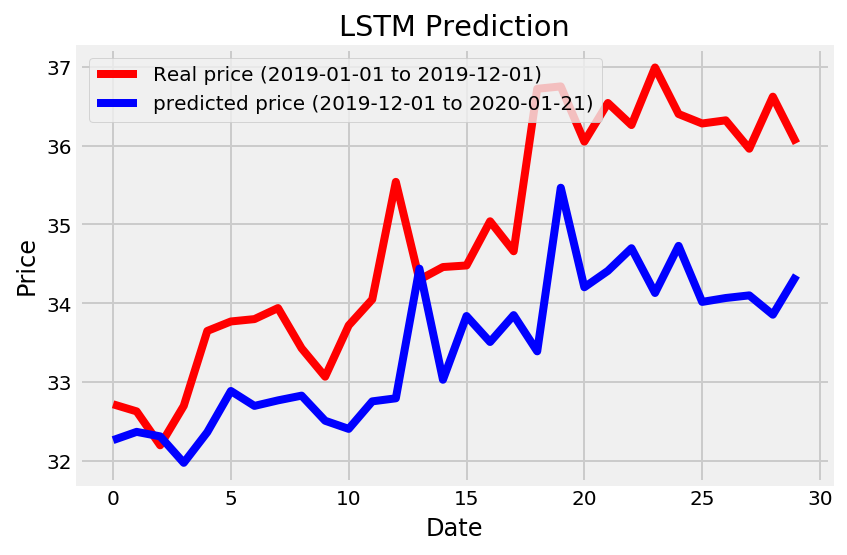

--------------------------
epochs is 150
batch_size:32
units num:80
--------------------------
Epoch 1/150
198/198 [==============================] - 52s 263ms/step - loss: 0.1919
Epoch 2/150
198/198 [==============================] - 8s 38ms/step - loss: 0.0241
Epoch 3/150
198/198 [==============================] - 8s 39ms/step - loss: 0.0383
Epoch 4/150
198/198 [==============================] - 8s 40ms/step - loss: 0.0561
Epoch 5/150
198/198 [==============================] - 8s 40ms/step - loss: 0.0487
Epoch 6/150
198/198 [==============================] - 8s 42ms/step - loss: 0.0180
Epoch 7/150
198/198 [==============================] - 8s 42ms/step - loss: 0.0370
Epoch 8/150
198/198 [==============================] - 8s 42ms/step - loss: 0.0155
Epoch 9/150
198/198 [==============================] - 8s 42ms/step - loss: 0.0253
Epoch 10/150
198/198 [==============================] - 8s 42ms/step - loss: 0.0295
Epoch 11/150
198/198 [==============================] - 8s 42ms/step - l

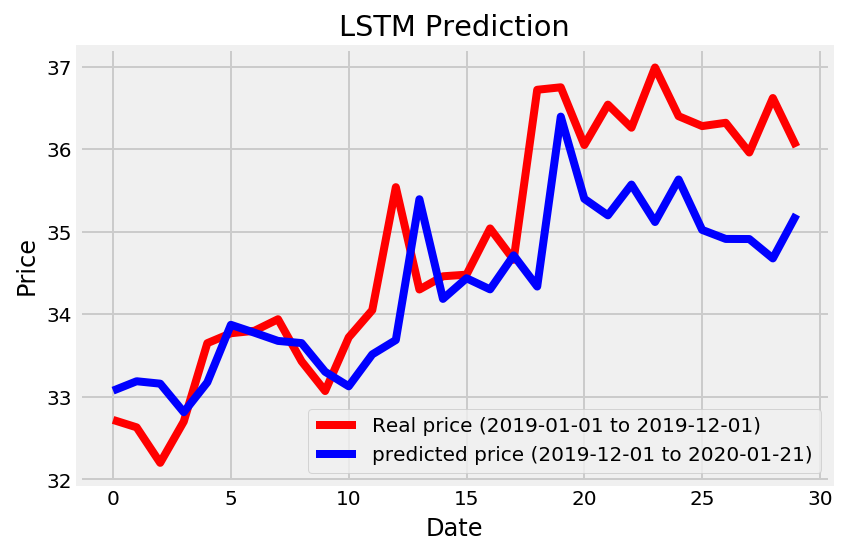

--------------------------
epochs is 150
batch_size:32
units num:110
--------------------------
Epoch 1/150
198/198 [==============================] - 50s 254ms/step - loss: 1.5321
Epoch 2/150
198/198 [==============================] - 8s 41ms/step - loss: 0.0209
Epoch 3/150
198/198 [==============================] - 9s 43ms/step - loss: 0.0152
Epoch 4/150
198/198 [==============================] - 9s 43ms/step - loss: 0.0175
Epoch 5/150
198/198 [==============================] - 9s 44ms/step - loss: 0.0158
Epoch 6/150
198/198 [==============================] - 9s 44ms/step - loss: 0.0333
Epoch 7/150
198/198 [==============================] - 9s 44ms/step - loss: 0.0228
Epoch 8/150
198/198 [==============================] - 9s 44ms/step - loss: 0.0309
Epoch 9/150
198/198 [==============================] - 9s 44ms/step - loss: 0.0274
Epoch 10/150
198/198 [==============================] - 9s 44ms/step - loss: 0.0429
Epoch 11/150
198/198 [==============================] - 9s 45ms/step - 

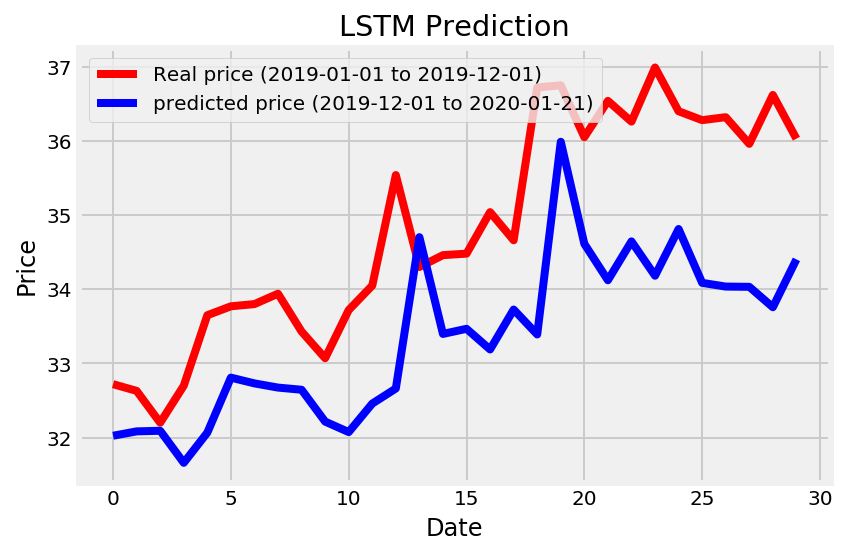

--------------------------
epochs is 50
batch_size:64
units num:50
--------------------------
Epoch 1/50
198/198 [==============================] - 47s 239ms/step - loss: 0.2412
Epoch 2/50
198/198 [==============================] - 4s 21ms/step - loss: 0.0810
Epoch 3/50
198/198 [==============================] - 4s 22ms/step - loss: 0.0191
Epoch 4/50
198/198 [==============================] - 4s 22ms/step - loss: 0.0292
Epoch 5/50
198/198 [==============================] - 5s 23ms/step - loss: 0.0253
Epoch 6/50
198/198 [==============================] - 5s 23ms/step - loss: 0.0183
Epoch 7/50
198/198 [==============================] - 5s 23ms/step - loss: 0.0178
Epoch 8/50
198/198 [==============================] - 5s 23ms/step - loss: 0.0625
Epoch 9/50
198/198 [==============================] - 5s 23ms/step - loss: 0.0175
Epoch 10/50
198/198 [==============================] - 5s 24ms/step - loss: 0.0262
Epoch 11/50
198/198 [==============================] - 5s 24ms/step - loss: 0.0271


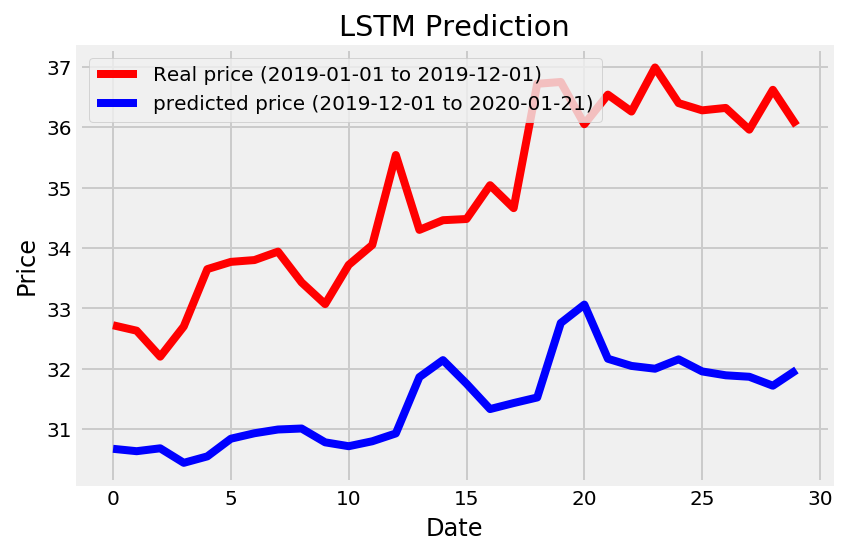

--------------------------
epochs is 50
batch_size:64
units num:80
--------------------------
Epoch 1/50
198/198 [==============================] - 47s 238ms/step - loss: 0.2073
Epoch 2/50
198/198 [==============================] - 5s 23ms/step - loss: 0.0995
Epoch 3/50
198/198 [==============================] - 5s 23ms/step - loss: 0.0269
Epoch 4/50
198/198 [==============================] - 5s 24ms/step - loss: 0.1136
Epoch 5/50
198/198 [==============================] - 5s 24ms/step - loss: 0.0193
Epoch 6/50
198/198 [==============================] - 5s 25ms/step - loss: 0.0202
Epoch 7/50
198/198 [==============================] - 5s 25ms/step - loss: 0.0269
Epoch 8/50
198/198 [==============================] - 5s 25ms/step - loss: 0.0225
Epoch 9/50
198/198 [==============================] - 5s 25ms/step - loss: 0.0181
Epoch 10/50
198/198 [==============================] - 5s 25ms/step - loss: 0.0417
Epoch 11/50
198/198 [==============================] - 5s 25ms/step - loss: 0.0173


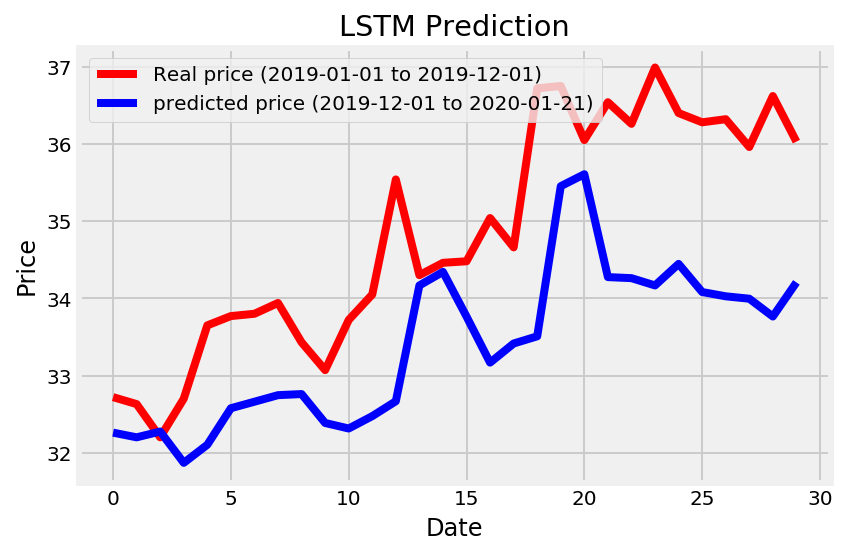

--------------------------
epochs is 50
batch_size:64
units num:110
--------------------------
Epoch 1/50
198/198 [==============================] - 49s 245ms/step - loss: 1.0242
Epoch 2/50
198/198 [==============================] - 5s 27ms/step - loss: 0.1659
Epoch 3/50
198/198 [==============================] - 5s 27ms/step - loss: 0.0276
Epoch 4/50
198/198 [==============================] - 6s 28ms/step - loss: 0.0161
Epoch 5/50
198/198 [==============================] - 6s 28ms/step - loss: 0.0232
Epoch 6/50
198/198 [==============================] - 6s 28ms/step - loss: 0.0605
Epoch 7/50
198/198 [==============================] - 6s 28ms/step - loss: 0.0161
Epoch 8/50
198/198 [==============================] - 6s 29ms/step - loss: 0.0140
Epoch 9/50
198/198 [==============================] - 6s 29ms/step - loss: 0.0155
Epoch 10/50
198/198 [==============================] - 6s 29ms/step - loss: 0.0229
Epoch 11/50
198/198 [==============================] - 6s 30ms/step - loss: 0.0384

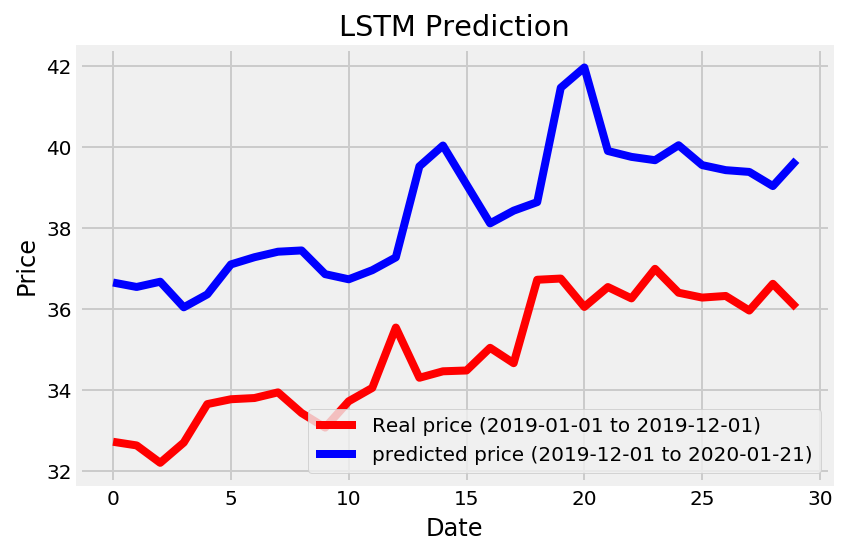

--------------------------
epochs is 80
batch_size:64
units num:50
--------------------------
Epoch 1/80
198/198 [==============================] - 48s 243ms/step - loss: 0.2389
Epoch 2/80
198/198 [==============================] - 4s 21ms/step - loss: 0.0764
Epoch 3/80
198/198 [==============================] - 4s 22ms/step - loss: 0.0171
Epoch 4/80
198/198 [==============================] - 4s 22ms/step - loss: 0.0159
Epoch 5/80
198/198 [==============================] - 5s 23ms/step - loss: 0.0161
Epoch 6/80
198/198 [==============================] - 5s 23ms/step - loss: 0.0178
Epoch 7/80
198/198 [==============================] - 5s 23ms/step - loss: 0.0161
Epoch 8/80
198/198 [==============================] - 5s 23ms/step - loss: 0.0207
Epoch 9/80
198/198 [==============================] - 5s 23ms/step - loss: 0.0218
Epoch 10/80
198/198 [==============================] - 5s 24ms/step - loss: 0.0173
Epoch 11/80
198/198 [==============================] - 5s 24ms/step - loss: 0.0195


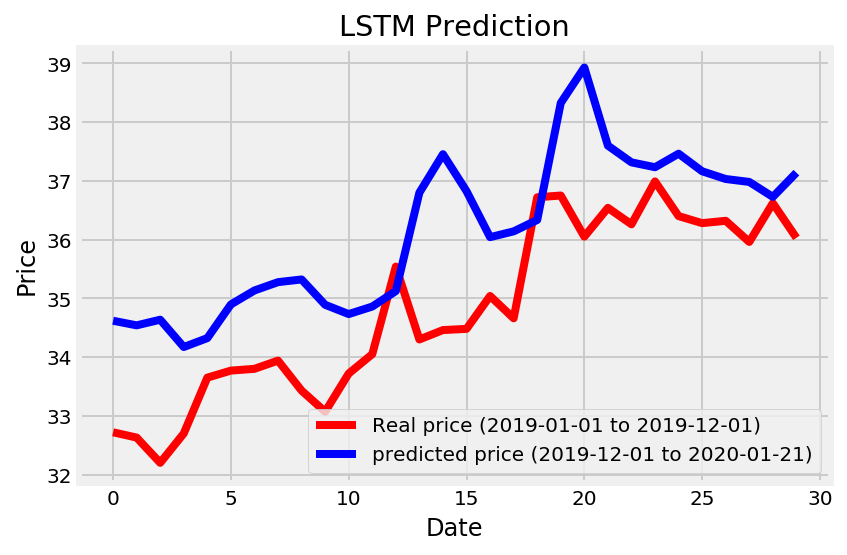

--------------------------
epochs is 80
batch_size:64
units num:80
--------------------------
Epoch 1/80
198/198 [==============================] - 49s 246ms/step - loss: 0.2685
Epoch 2/80
198/198 [==============================] - 4s 23ms/step - loss: 0.1158
Epoch 3/80
198/198 [==============================] - 5s 23ms/step - loss: 0.0302
Epoch 4/80
198/198 [==============================] - 5s 24ms/step - loss: 0.0187
Epoch 5/80
198/198 [==============================] - 5s 24ms/step - loss: 0.0329
Epoch 6/80
198/198 [==============================] - 5s 24ms/step - loss: 0.0447
Epoch 7/80
198/198 [==============================] - 5s 25ms/step - loss: 0.0205
Epoch 8/80
198/198 [==============================] - 5s 25ms/step - loss: 0.0176
Epoch 9/80
198/198 [==============================] - 5s 25ms/step - loss: 0.0241
Epoch 10/80
198/198 [==============================] - 5s 25ms/step - loss: 0.0153
Epoch 11/80
198/198 [==============================] - 5s 25ms/step - loss: 0.0877


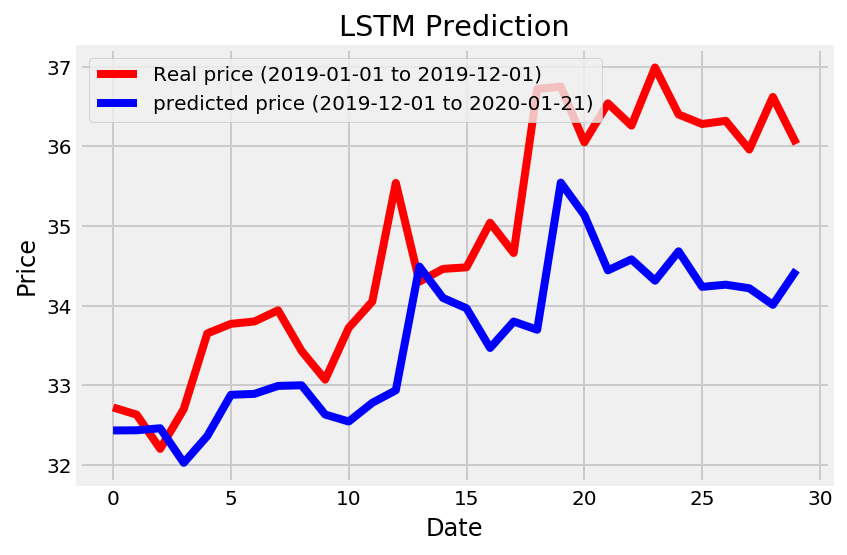

--------------------------
epochs is 80
batch_size:64
units num:110
--------------------------
Epoch 1/80
198/198 [==============================] - 50s 253ms/step - loss: 1.4059
Epoch 2/80
198/198 [==============================] - 5s 26ms/step - loss: 0.1521
Epoch 3/80
198/198 [==============================] - 5s 27ms/step - loss: 0.0461
Epoch 4/80
198/198 [==============================] - 6s 28ms/step - loss: 0.0173
Epoch 5/80
198/198 [==============================] - 6s 28ms/step - loss: 0.0230
Epoch 6/80
198/198 [==============================] - 6s 28ms/step - loss: 0.0173
Epoch 7/80
198/198 [==============================] - 6s 29ms/step - loss: 0.0152
Epoch 8/80
198/198 [==============================] - 6s 29ms/step - loss: 0.0265
Epoch 9/80
198/198 [==============================] - 6s 29ms/step - loss: 0.0153
Epoch 10/80
198/198 [==============================] - 6s 29ms/step - loss: 0.0202
Epoch 11/80
198/198 [==============================] - 6s 29ms/step - loss: 0.0305

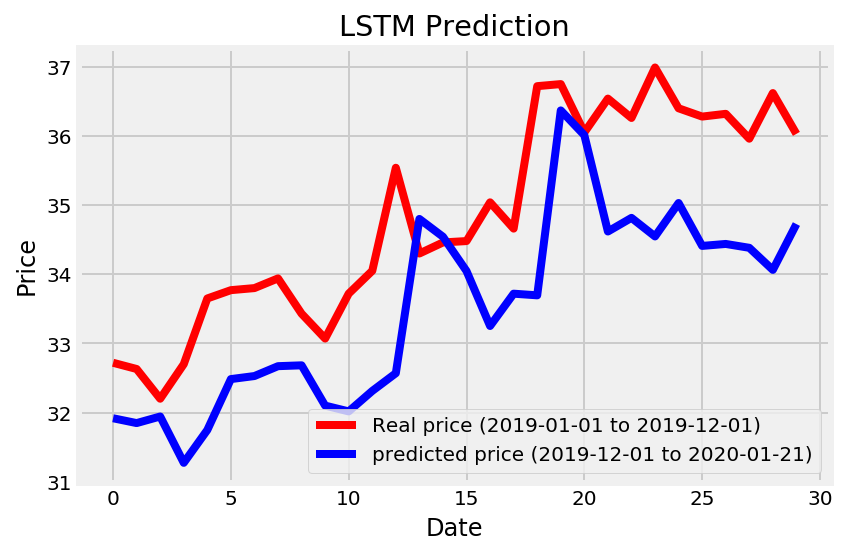

--------------------------
epochs is 110
batch_size:64
units num:50
--------------------------
Epoch 1/110
198/198 [==============================] - 50s 252ms/step - loss: 0.1982
Epoch 2/110
198/198 [==============================] - 4s 21ms/step - loss: 0.0506
Epoch 3/110
198/198 [==============================] - 4s 22ms/step - loss: 0.0155
Epoch 4/110
198/198 [==============================] - 4s 23ms/step - loss: 0.0138
Epoch 5/110
198/198 [==============================] - 5s 23ms/step - loss: 0.0151
Epoch 6/110
198/198 [==============================] - 5s 23ms/step - loss: 0.0359
Epoch 7/110
198/198 [==============================] - 5s 23ms/step - loss: 0.0213
Epoch 8/110
198/198 [==============================] - 5s 23ms/step - loss: 0.0479
Epoch 9/110
198/198 [==============================] - 5s 23ms/step - loss: 0.0184
Epoch 10/110
198/198 [==============================] - 5s 24ms/step - loss: 0.0165
Epoch 11/110
198/198 [==============================] - 5s 24ms/step - l

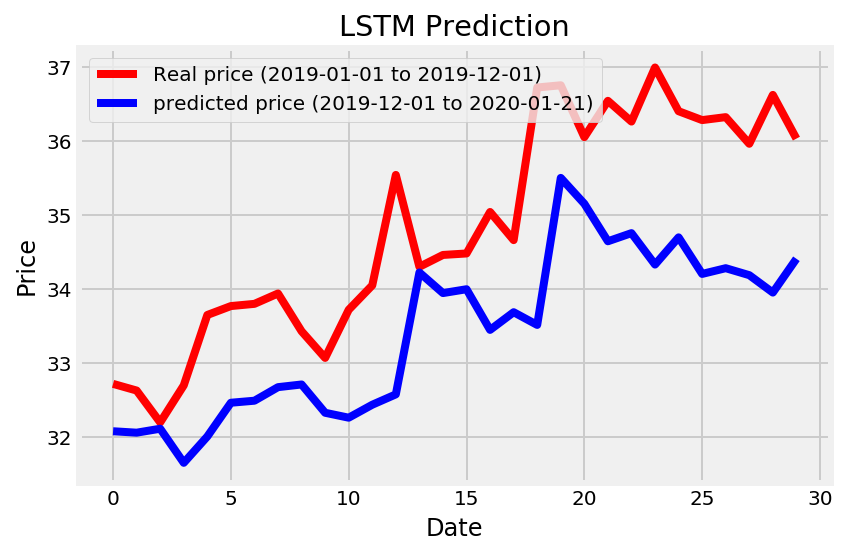

--------------------------
epochs is 110
batch_size:64
units num:80
--------------------------
Epoch 1/110
198/198 [==============================] - 50s 252ms/step - loss: 0.5246
Epoch 2/110
198/198 [==============================] - 4s 22ms/step - loss: 0.1129
Epoch 3/110
198/198 [==============================] - 5s 23ms/step - loss: 0.0187
Epoch 4/110
198/198 [==============================] - 5s 24ms/step - loss: 0.0271
Epoch 5/110
198/198 [==============================] - 5s 24ms/step - loss: 0.0180
Epoch 6/110
198/198 [==============================] - 5s 24ms/step - loss: 0.0224
Epoch 7/110
198/198 [==============================] - 5s 25ms/step - loss: 0.0410
Epoch 8/110
198/198 [==============================] - 5s 25ms/step - loss: 0.0155
Epoch 9/110
198/198 [==============================] - 5s 25ms/step - loss: 0.0248
Epoch 10/110
198/198 [==============================] - 5s 25ms/step - loss: 0.0173
Epoch 11/110
198/198 [==============================] - 5s 25ms/step - l

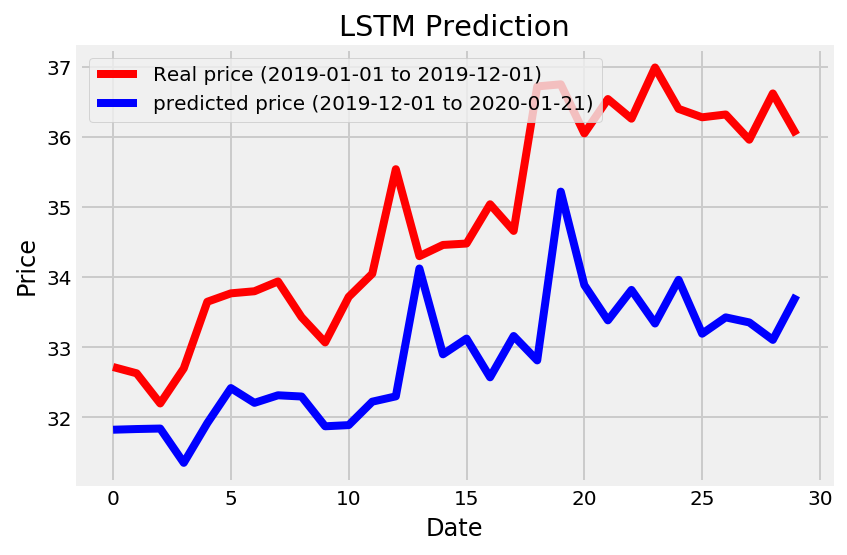

--------------------------
epochs is 110
batch_size:64
units num:110
--------------------------
Epoch 1/110
198/198 [==============================] - 51s 257ms/step - loss: 0.5036
Epoch 2/110
198/198 [==============================] - 5s 26ms/step - loss: 0.1729
Epoch 3/110
198/198 [==============================] - 5s 27ms/step - loss: 0.0304
Epoch 4/110
198/198 [==============================] - 5s 27ms/step - loss: 0.0154
Epoch 5/110
198/198 [==============================] - 5s 28ms/step - loss: 0.0304
Epoch 6/110
198/198 [==============================] - 6s 28ms/step - loss: 0.0211
Epoch 7/110
198/198 [==============================] - 6s 28ms/step - loss: 0.0306
Epoch 8/110
198/198 [==============================] - 6s 28ms/step - loss: 0.0165
Epoch 9/110
198/198 [==============================] - 6s 29ms/step - loss: 0.0748
Epoch 10/110
198/198 [==============================] - 6s 29ms/step - loss: 0.0182
Epoch 11/110
198/198 [==============================] - 6s 29ms/step - 

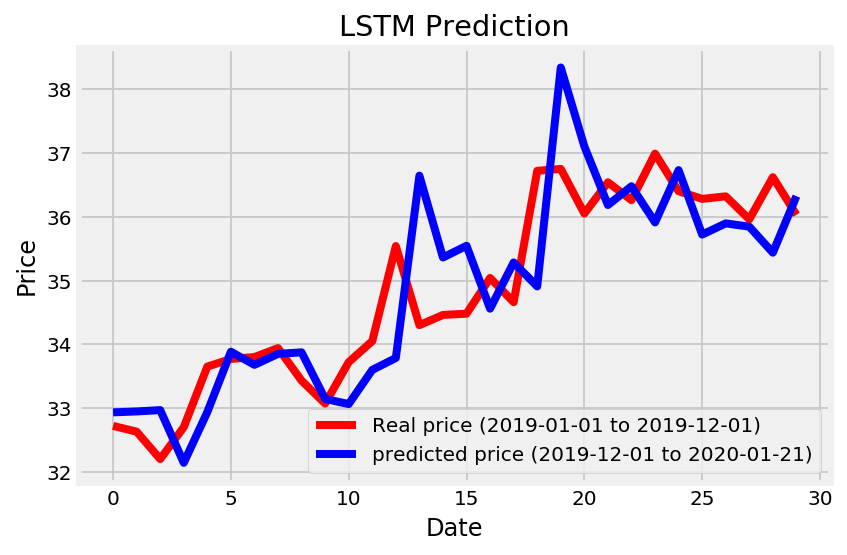

--------------------------
epochs is 150
batch_size:32
units num:50
--------------------------
Epoch 1/150
198/198 [==============================] - 54s 270ms/step - loss: 0.3093
Epoch 2/150
198/198 [==============================] - 7s 36ms/step - loss: 0.0225
Epoch 3/150
198/198 [==============================] - 8s 38ms/step - loss: 0.0178
Epoch 4/150
198/198 [==============================] - 8s 39ms/step - loss: 0.0186
Epoch 5/150
198/198 [==============================] - 8s 40ms/step - loss: 0.0204
Epoch 6/150
198/198 [==============================] - 8s 40ms/step - loss: 0.0349
Epoch 7/150
198/198 [==============================] - 8s 41ms/step - loss: 0.0187
Epoch 8/150
198/198 [==============================] - 8s 41ms/step - loss: 0.0362
Epoch 9/150
198/198 [==============================] - 8s 41ms/step - loss: 0.0217
Epoch 10/150
198/198 [==============================] - 8s 41ms/step - loss: 0.0350
Epoch 11/150
198/198 [==============================] - 8s 41ms/step - l

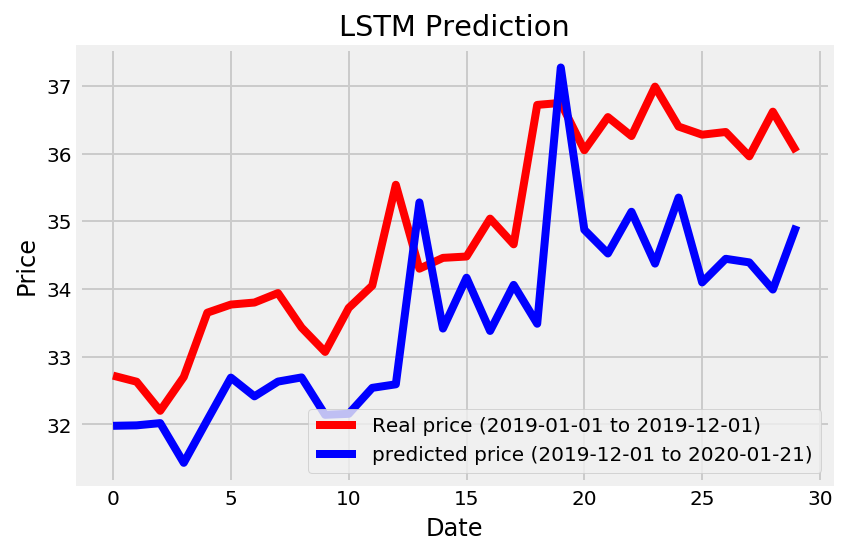

--------------------------
epochs is 150
batch_size:32
units num:80
--------------------------
Epoch 1/150
198/198 [==============================] - 54s 273ms/step - loss: 0.2109
Epoch 2/150
198/198 [==============================] - 8s 38ms/step - loss: 0.0189
Epoch 3/150
198/198 [==============================] - 8s 39ms/step - loss: 0.0310
Epoch 4/150
198/198 [==============================] - 8s 40ms/step - loss: 0.0355
Epoch 5/150
198/198 [==============================] - 8s 40ms/step - loss: 0.0268
Epoch 6/150
198/198 [==============================] - 8s 41ms/step - loss: 0.0223
Epoch 7/150
198/198 [==============================] - 8s 41ms/step - loss: 0.0458
Epoch 8/150
198/198 [==============================] - 8s 41ms/step - loss: 0.0250
Epoch 9/150
198/198 [==============================] - 8s 42ms/step - loss: 0.0264
Epoch 10/150
198/198 [==============================] - 8s 42ms/step - loss: 0.0296
Epoch 11/150
198/198 [==============================] - 8s 42ms/step - l

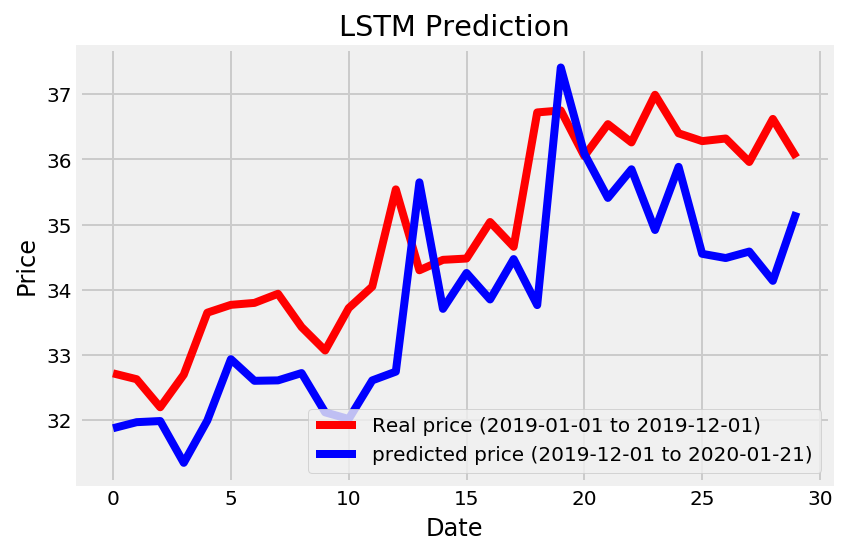

--------------------------
epochs is 150
batch_size:32
units num:110
--------------------------
Epoch 1/150
198/198 [==============================] - 56s 284ms/step - loss: 0.4885
Epoch 2/150
198/198 [==============================] - 8s 41ms/step - loss: 0.0338
Epoch 3/150
198/198 [==============================] - 8s 42ms/step - loss: 0.0170
Epoch 4/150
198/198 [==============================] - 8s 43ms/step - loss: 0.0225
Epoch 5/150
198/198 [==============================] - 9s 44ms/step - loss: 0.0283
Epoch 6/150
198/198 [==============================] - 9s 44ms/step - loss: 0.0286
Epoch 7/150
198/198 [==============================] - 9s 44ms/step - loss: 0.0182
Epoch 8/150
198/198 [==============================] - 9s 45ms/step - loss: 0.0347
Epoch 9/150
198/198 [==============================] - 9s 45ms/step - loss: 0.0289
Epoch 10/150
198/198 [==============================] - 9s 45ms/step - loss: 0.0274
Epoch 11/150
198/198 [==============================] - 9s 45ms/step - 

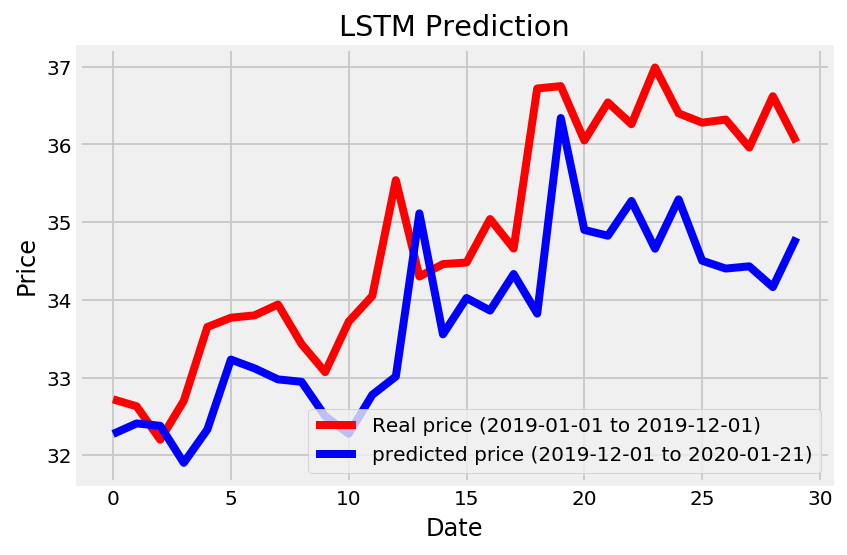

number of previous days in features: 50

y scales:[0.0277585],
x scaled:[0.0277585  0.21842857 0.6165454  0.15570526 0.09498607 0.68778477
 0.         0.16266492 0.12318841 0.48480243 0.11832947 0.07784431]

length of X_1:208

length of X train set is: 178
length of y train set is: 178

--------------------------
epochs is 50
batch_size:32
units num:50
--------------------------
Epoch 1/50
178/178 [==============================] - 59s 330ms/step - loss: 0.2383
Epoch 2/50
178/178 [==============================] - 10s 59ms/step - loss: 0.0205
Epoch 3/50
178/178 [==============================] - 11s 61ms/step - loss: 0.0182
Epoch 4/50
178/178 [==============================] - 11s 62ms/step - loss: 0.0182
Epoch 5/50
178/178 [==============================] - 11s 64ms/step - loss: 0.0198
Epoch 6/50
178/178 [==============================] - 11s 64ms/step - loss: 0.0243
Epoch 7/50
178/178 [==============================] - 12s 65ms/step - loss: 0.0310
Epoch 8/50
178/178 [================

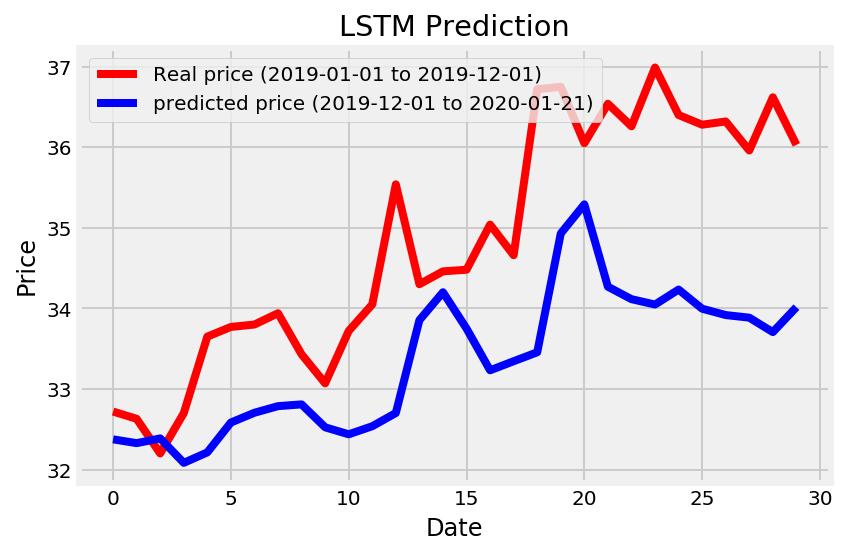

--------------------------
epochs is 50
batch_size:32
units num:80
--------------------------
Epoch 1/50
178/178 [==============================] - 59s 333ms/step - loss: 0.4586
Epoch 2/50
178/178 [==============================] - 11s 61ms/step - loss: 0.0286
Epoch 3/50
178/178 [==============================] - 11s 63ms/step - loss: 0.0165
Epoch 4/50
178/178 [==============================] - 11s 64ms/step - loss: 0.0176
Epoch 5/50
178/178 [==============================] - 12s 66ms/step - loss: 0.0170
Epoch 6/50
178/178 [==============================] - 12s 65ms/step - loss: 0.0197
Epoch 7/50
178/178 [==============================] - 12s 67ms/step - loss: 0.0144
Epoch 8/50
178/178 [==============================] - 12s 67ms/step - loss: 0.0345
Epoch 9/50
178/178 [==============================] - 12s 67ms/step - loss: 0.0222
Epoch 10/50
178/178 [==============================] - 12s 67ms/step - loss: 0.0265
Epoch 11/50
178/178 [==============================] - 12s 67ms/step - los

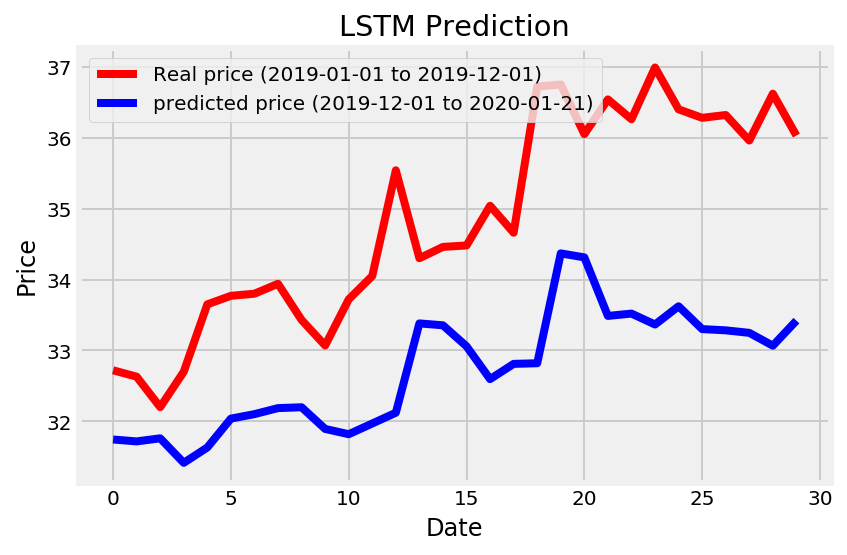

--------------------------
epochs is 50
batch_size:32
units num:110
--------------------------
Epoch 1/50
178/178 [==============================] - 60s 339ms/step - loss: 0.8849
Epoch 2/50
178/178 [==============================] - 12s 66ms/step - loss: 0.0653
Epoch 3/50
178/178 [==============================] - 12s 68ms/step - loss: 0.0146
Epoch 4/50
178/178 [==============================] - 12s 70ms/step - loss: 0.0148
Epoch 5/50
178/178 [==============================] - 13s 70ms/step - loss: 0.0146
Epoch 6/50
178/178 [==============================] - 13s 70ms/step - loss: 0.0262
Epoch 7/50
178/178 [==============================] - 13s 71ms/step - loss: 0.0203
Epoch 8/50
178/178 [==============================] - 13s 71ms/step - loss: 0.0220
Epoch 9/50
178/178 [==============================] - 13s 71ms/step - loss: 0.0228
Epoch 10/50
178/178 [==============================] - 13s 71ms/step - loss: 0.0306
Epoch 11/50
178/178 [==============================] - 13s 71ms/step - lo

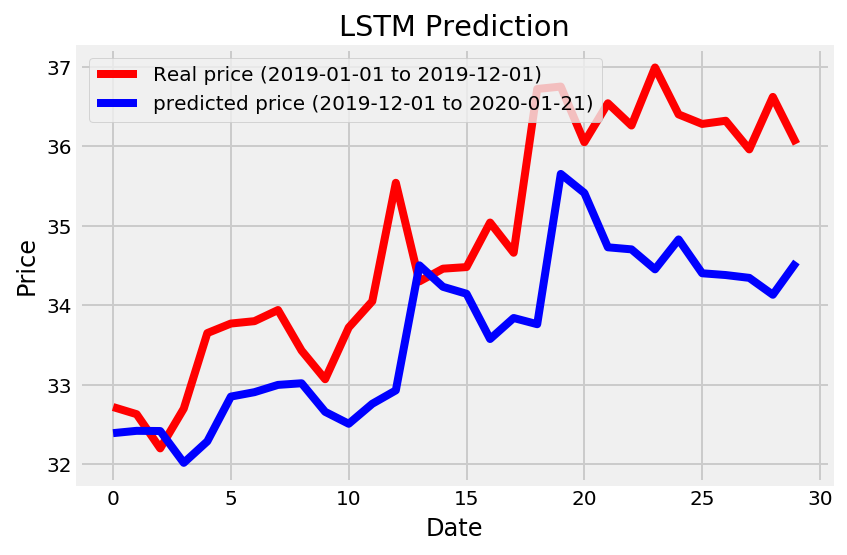

--------------------------
epochs is 80
batch_size:32
units num:50
--------------------------
Epoch 1/80
178/178 [==============================] - 60s 335ms/step - loss: 0.2099
Epoch 2/80
178/178 [==============================] - 11s 59ms/step - loss: 0.0187
Epoch 3/80
178/178 [==============================] - 11s 62ms/step - loss: 0.0164
Epoch 4/80
178/178 [==============================] - 11s 62ms/step - loss: 0.0201
Epoch 5/80
178/178 [==============================] - 11s 64ms/step - loss: 0.0154
Epoch 6/80
178/178 [==============================] - 11s 64ms/step - loss: 0.0240
Epoch 7/80
178/178 [==============================] - 11s 64ms/step - loss: 0.0235
Epoch 8/80
178/178 [==============================] - 11s 64ms/step - loss: 0.0224
Epoch 9/80
178/178 [==============================] - 11s 64ms/step - loss: 0.0198
Epoch 10/80
178/178 [==============================] - 11s 64ms/step - loss: 0.0278
Epoch 11/80
178/178 [==============================] - 11s 64ms/step - los

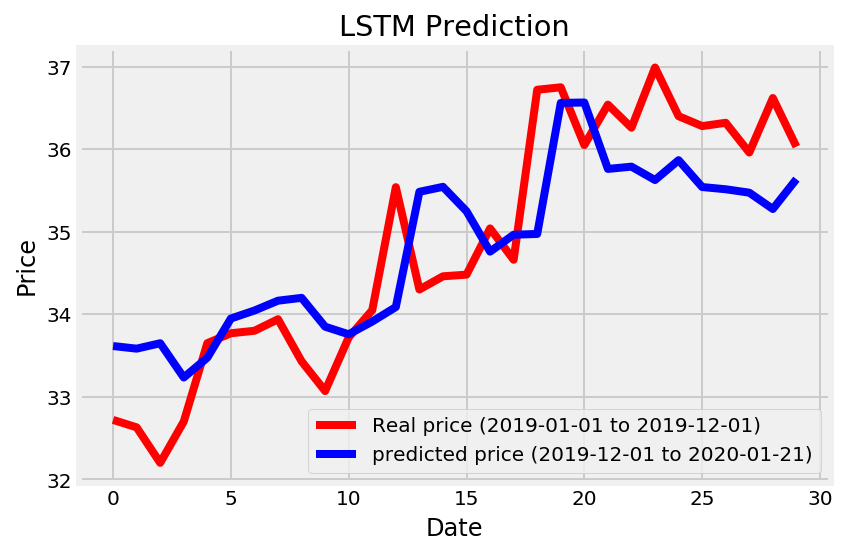

--------------------------
epochs is 80
batch_size:32
units num:80
--------------------------
Epoch 1/80
178/178 [==============================] - 61s 342ms/step - loss: 0.6909
Epoch 2/80
178/178 [==============================] - 11s 61ms/step - loss: 0.0464
Epoch 3/80
178/178 [==============================] - 11s 63ms/step - loss: 0.0149
Epoch 4/80
178/178 [==============================] - 12s 65ms/step - loss: 0.0153
Epoch 5/80
178/178 [==============================] - 12s 66ms/step - loss: 0.0174
Epoch 6/80
178/178 [==============================] - 12s 66ms/step - loss: 0.0148
Epoch 7/80
178/178 [==============================] - 12s 67ms/step - loss: 0.0141
Epoch 8/80
178/178 [==============================] - 12s 68ms/step - loss: 0.0344
Epoch 9/80
178/178 [==============================] - 12s 67ms/step - loss: 0.0139
Epoch 10/80
178/178 [==============================] - 12s 69ms/step - loss: 0.0262
Epoch 11/80
178/178 [==============================] - 12s 69ms/step - los

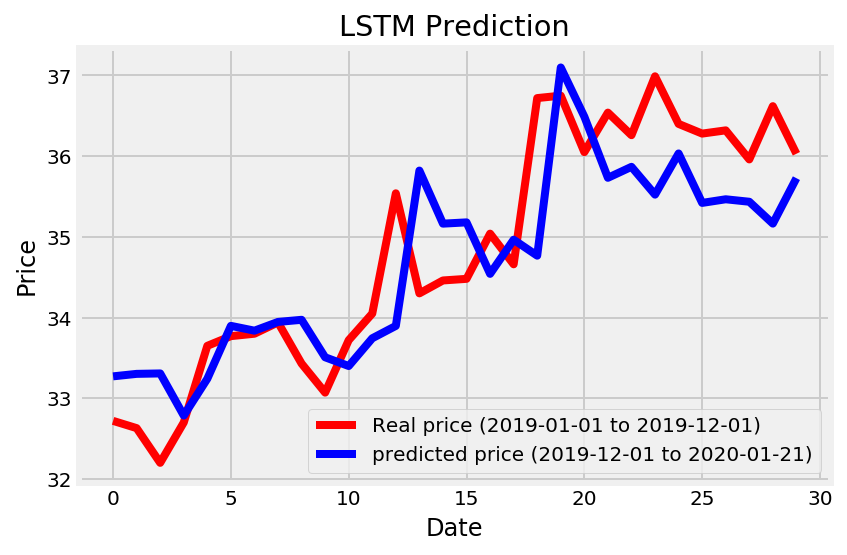

--------------------------
epochs is 80
batch_size:32
units num:110
--------------------------
Epoch 1/80
178/178 [==============================] - 62s 347ms/step - loss: 0.4990
Epoch 2/80
178/178 [==============================] - 12s 66ms/step - loss: 0.0909
Epoch 3/80
178/178 [==============================] - 12s 68ms/step - loss: 0.0150
Epoch 4/80
178/178 [==============================] - 12s 69ms/step - loss: 0.0145
Epoch 5/80
178/178 [==============================] - 13s 70ms/step - loss: 0.0213
Epoch 6/80
178/178 [==============================] - 13s 71ms/step - loss: 0.0362
Epoch 7/80
178/178 [==============================] - 13s 71ms/step - loss: 0.0189
Epoch 8/80
178/178 [==============================] - 13s 71ms/step - loss: 0.0223
Epoch 9/80
178/178 [==============================] - 13s 71ms/step - loss: 0.0242
Epoch 10/80
178/178 [==============================] - 13s 71ms/step - loss: 0.0223
Epoch 11/80
178/178 [==============================] - 13s 71ms/step - lo

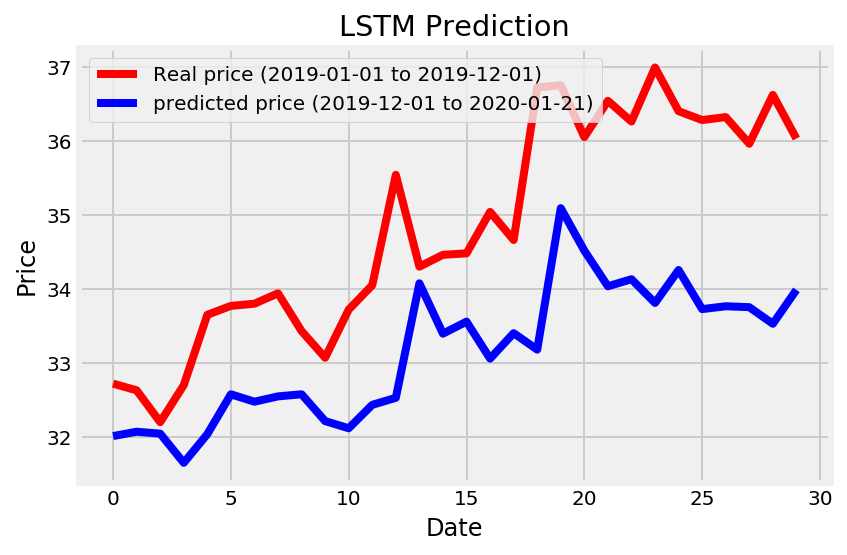

--------------------------
epochs is 110
batch_size:32
units num:50
--------------------------
Epoch 1/110
178/178 [==============================] - 61s 343ms/step - loss: 0.2195
Epoch 2/110
178/178 [==============================] - 10s 59ms/step - loss: 0.0283
Epoch 3/110
178/178 [==============================] - 11s 61ms/step - loss: 0.0148
Epoch 4/110
178/178 [==============================] - 11s 62ms/step - loss: 0.0144
Epoch 5/110
178/178 [==============================] - 11s 63ms/step - loss: 0.0165
Epoch 6/110
178/178 [==============================] - 11s 64ms/step - loss: 0.0236
Epoch 7/110
178/178 [==============================] - 11s 64ms/step - loss: 0.0342
Epoch 8/110
178/178 [==============================] - 11s 64ms/step - loss: 0.0270
Epoch 9/110
178/178 [==============================] - 11s 64ms/step - loss: 0.0162
Epoch 10/110
178/178 [==============================] - 11s 64ms/step - loss: 0.0300
Epoch 11/110
178/178 [==============================] - 11s 63m

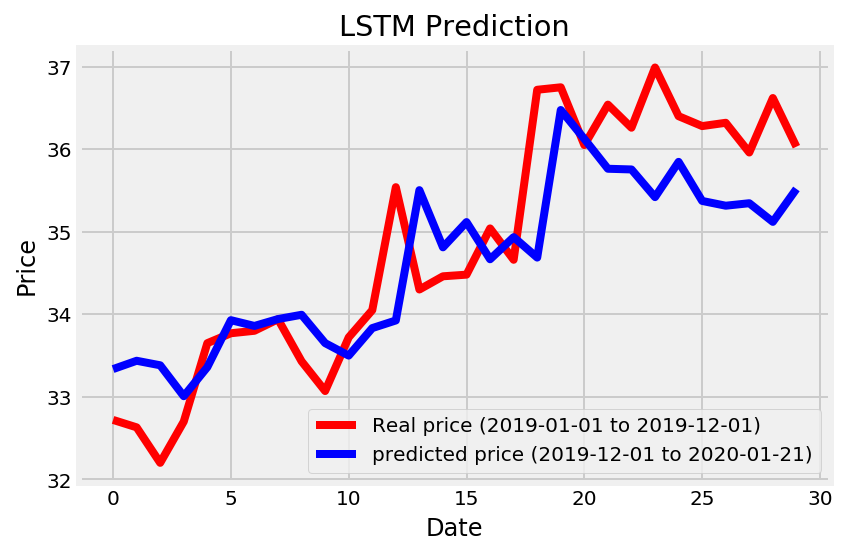

--------------------------
epochs is 110
batch_size:32
units num:80
--------------------------
Epoch 1/110
178/178 [==============================] - 73s 409ms/step - loss: 0.1992
Epoch 2/110
178/178 [==============================] - 11s 61ms/step - loss: 0.0338
Epoch 3/110
178/178 [==============================] - 11s 63ms/step - loss: 0.0312
Epoch 4/110
178/178 [==============================] - 11s 64ms/step - loss: 0.0197
Epoch 5/110
178/178 [==============================] - 12s 66ms/step - loss: 0.0170
Epoch 6/110
178/178 [==============================] - 12s 66ms/step - loss: 0.0425
Epoch 7/110
178/178 [==============================] - 12s 66ms/step - loss: 0.0155
Epoch 8/110
178/178 [==============================] - 12s 66ms/step - loss: 0.0446
Epoch 9/110
178/178 [==============================] - 12s 66ms/step - loss: 0.0187
Epoch 10/110
178/178 [==============================] - 12s 66ms/step - loss: 0.0261
Epoch 11/110
178/178 [==============================] - 12s 67m

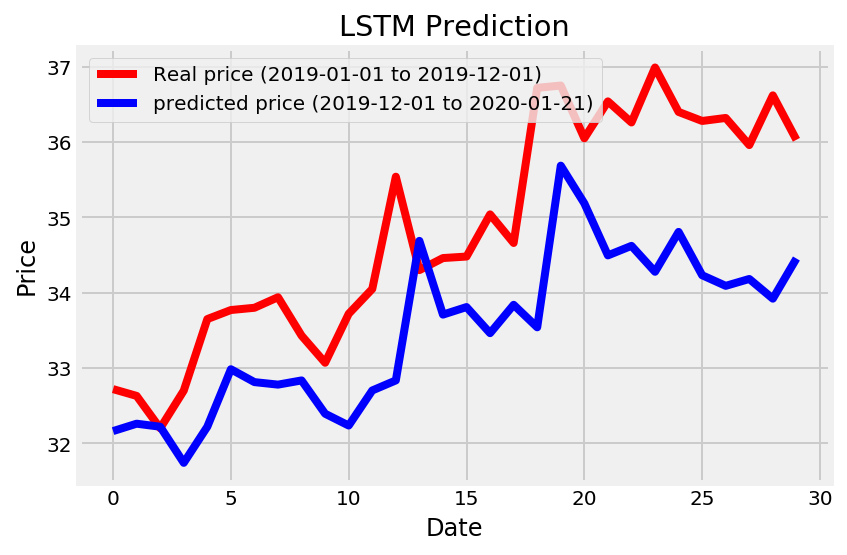

--------------------------
epochs is 110
batch_size:32
units num:110
--------------------------
Epoch 1/110
178/178 [==============================] - 65s 365ms/step - loss: 1.0025
Epoch 2/110
178/178 [==============================] - 12s 65ms/step - loss: 0.0420
Epoch 3/110
178/178 [==============================] - 12s 68ms/step - loss: 0.0147
Epoch 4/110
178/178 [==============================] - 12s 69ms/step - loss: 0.0181
Epoch 5/110
178/178 [==============================] - 12s 70ms/step - loss: 0.0133
Epoch 6/110
178/178 [==============================] - 12s 70ms/step - loss: 0.0208
Epoch 7/110
178/178 [==============================] - 13s 71ms/step - loss: 0.0284
Epoch 8/110
178/178 [==============================] - 13s 70ms/step - loss: 0.0133
Epoch 9/110
178/178 [==============================] - 13s 71ms/step - loss: 0.0319
Epoch 10/110
178/178 [==============================] - 12s 70ms/step - loss: 0.0229
Epoch 11/110
178/178 [==============================] - 13s 71

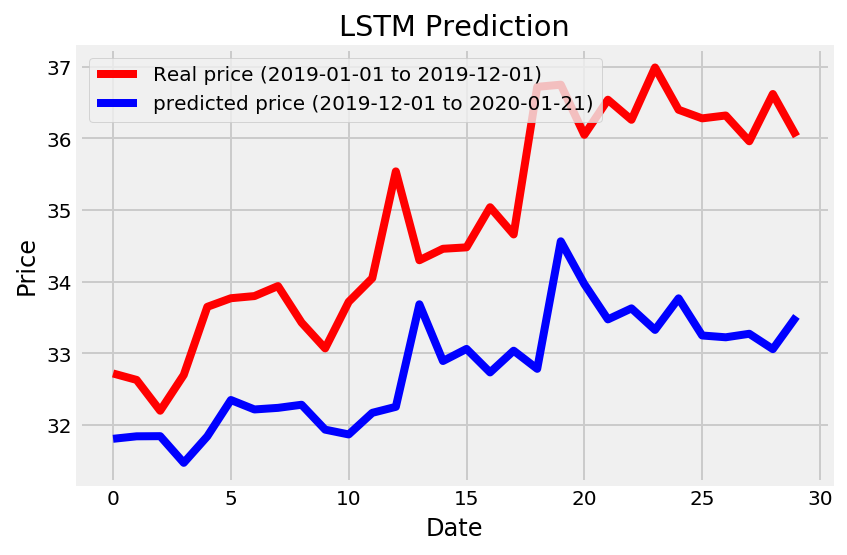

--------------------------
epochs is 150
batch_size:32
units num:50
--------------------------
Epoch 1/150
178/178 [==============================] - 64s 359ms/step - loss: 0.1382
Epoch 2/150
178/178 [==============================] - 10s 58ms/step - loss: 0.0167
Epoch 3/150
178/178 [==============================] - 11s 60ms/step - loss: 0.0213
Epoch 4/150
178/178 [==============================] - 11s 62ms/step - loss: 0.0270
Epoch 5/150
178/178 [==============================] - 11s 62ms/step - loss: 0.0311
Epoch 6/150
178/178 [==============================] - 11s 64ms/step - loss: 0.0242
Epoch 7/150
178/178 [==============================] - 11s 64ms/step - loss: 0.0238
Epoch 8/150
178/178 [==============================] - 11s 64ms/step - loss: 0.0251
Epoch 9/150
178/178 [==============================] - 11s 64ms/step - loss: 0.0184
Epoch 10/150
178/178 [==============================] - 11s 64ms/step - loss: 0.0222
Epoch 11/150
178/178 [==============================] - 11s 64m

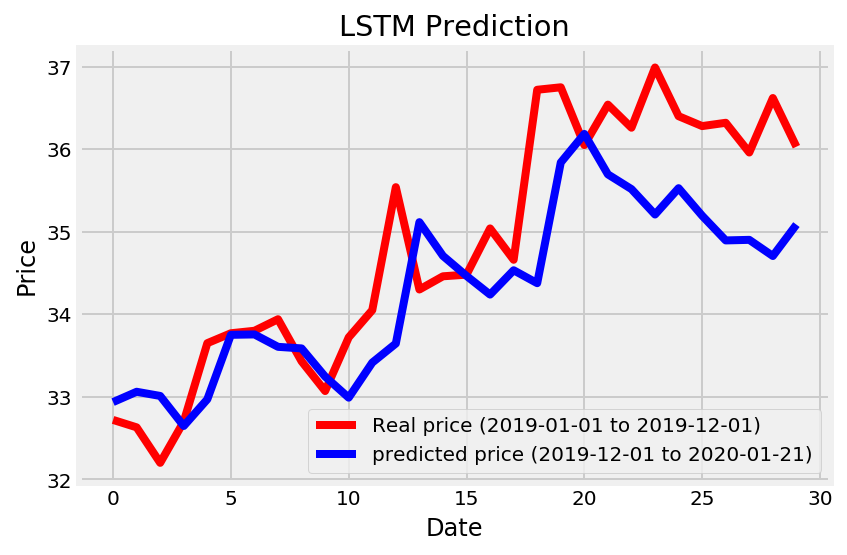

--------------------------
epochs is 150
batch_size:32
units num:80
--------------------------
Epoch 1/150
178/178 [==============================] - 65s 365ms/step - loss: 0.2057
Epoch 2/150
178/178 [==============================] - 11s 61ms/step - loss: 0.0195
Epoch 3/150
178/178 [==============================] - 11s 63ms/step - loss: 0.0343
Epoch 4/150
178/178 [==============================] - 11s 63ms/step - loss: 0.0164
Epoch 5/150
178/178 [==============================] - 12s 65ms/step - loss: 0.0308
Epoch 6/150
178/178 [==============================] - 12s 66ms/step - loss: 0.0217
Epoch 7/150
178/178 [==============================] - 12s 66ms/step - loss: 0.0365
Epoch 8/150
178/178 [==============================] - 12s 66ms/step - loss: 0.0214
Epoch 9/150
178/178 [==============================] - 12s 67ms/step - loss: 0.0208
Epoch 10/150
178/178 [==============================] - 12s 66ms/step - loss: 0.0228
Epoch 11/150
178/178 [==============================] - 12s 67m

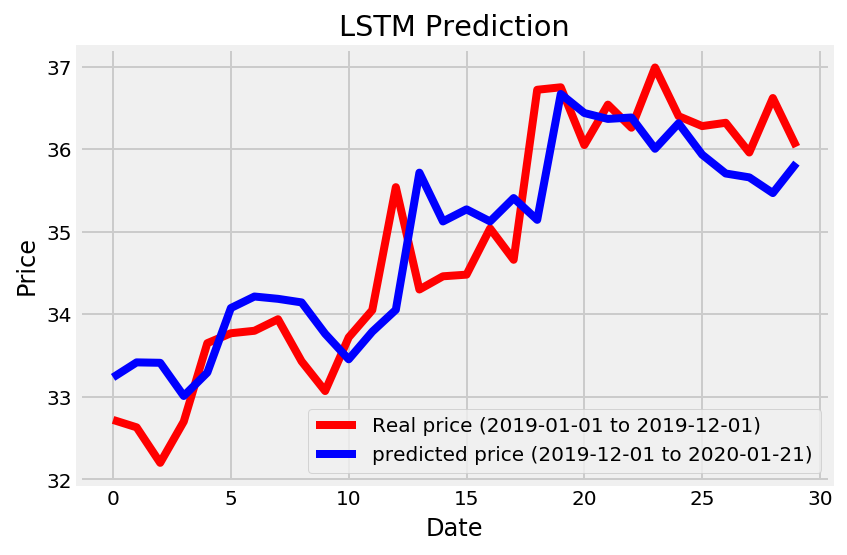

--------------------------
epochs is 150
batch_size:32
units num:110
--------------------------
Epoch 1/150
178/178 [==============================] - 66s 370ms/step - loss: 0.7708
Epoch 2/150
178/178 [==============================] - 12s 66ms/step - loss: 0.0738
Epoch 3/150
178/178 [==============================] - 12s 68ms/step - loss: 0.0165
Epoch 4/150
178/178 [==============================] - 12s 69ms/step - loss: 0.0198
Epoch 5/150
178/178 [==============================] - 12s 70ms/step - loss: 0.0155
Epoch 6/150
178/178 [==============================] - 13s 71ms/step - loss: 0.0151
Epoch 7/150
178/178 [==============================] - 13s 71ms/step - loss: 0.0311
Epoch 8/150
178/178 [==============================] - 13s 71ms/step - loss: 0.0177
Epoch 9/150
178/178 [==============================] - 13s 71ms/step - loss: 0.0263
Epoch 10/150
178/178 [==============================] - 13s 71ms/step - loss: 0.0262
Epoch 11/150
178/178 [==============================] - 13s 71

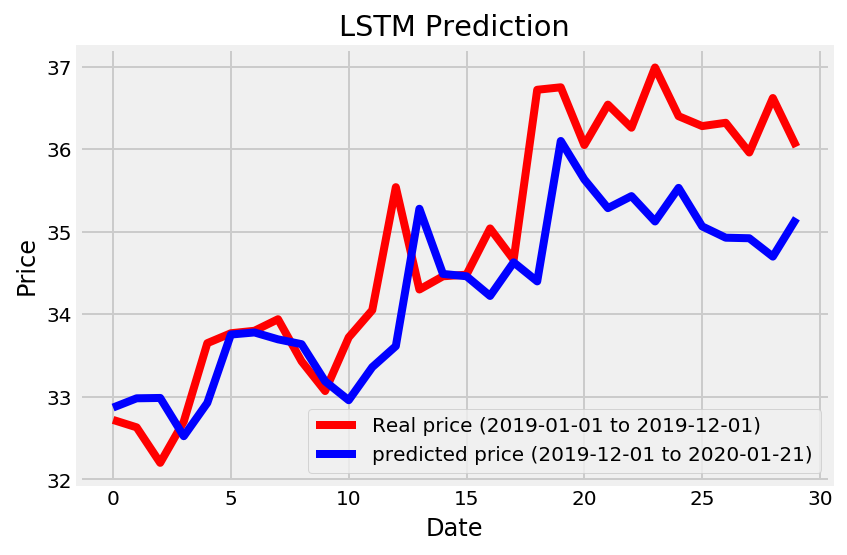

--------------------------
epochs is 50
batch_size:64
units num:50
--------------------------
Epoch 1/50
178/178 [==============================] - 61s 342ms/step - loss: 0.2206
Epoch 2/50
178/178 [==============================] - 5s 31ms/step - loss: 0.2595
Epoch 3/50
178/178 [==============================] - 5s 30ms/step - loss: 0.0294
Epoch 4/50
178/178 [==============================] - 5s 31ms/step - loss: 0.0177
Epoch 5/50
178/178 [==============================] - 6s 32ms/step - loss: 0.0147
Epoch 6/50
178/178 [==============================] - 6s 32ms/step - loss: 0.0160
Epoch 7/50
178/178 [==============================] - 6s 32ms/step - loss: 0.0173
Epoch 8/50
178/178 [==============================] - 6s 32ms/step - loss: 0.0212
Epoch 9/50
178/178 [==============================] - 6s 33ms/step - loss: 0.0153
Epoch 10/50
178/178 [==============================] - 6s 33ms/step - loss: 0.0187
Epoch 11/50
178/178 [==============================] - 6s 33ms/step - loss: 0.0231


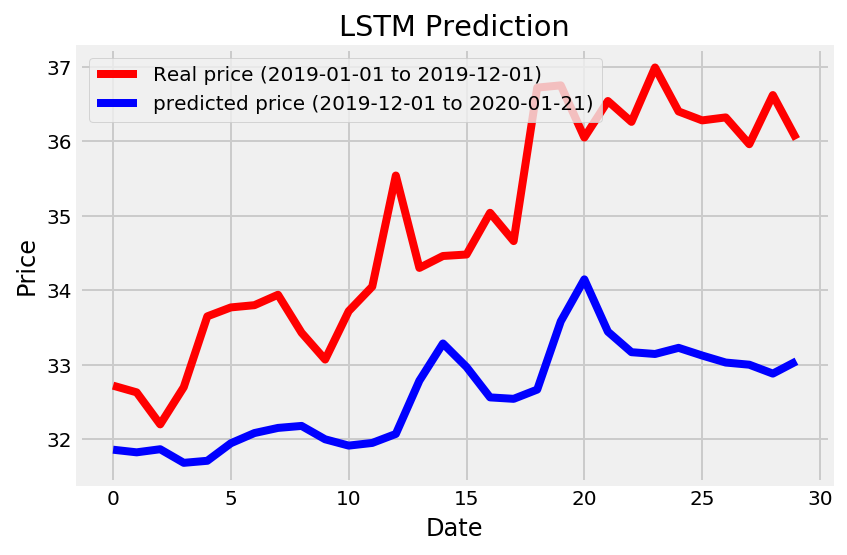

--------------------------
epochs is 50
batch_size:64
units num:80
--------------------------
Epoch 1/50
178/178 [==============================] - 62s 348ms/step - loss: 0.3000
Epoch 2/50
178/178 [==============================] - 6s 33ms/step - loss: 0.1605
Epoch 3/50
178/178 [==============================] - 6s 34ms/step - loss: 0.0411
Epoch 4/50
178/178 [==============================] - 6s 34ms/step - loss: 0.0175
Epoch 5/50
178/178 [==============================] - 6s 35ms/step - loss: 0.0195
Epoch 6/50
178/178 [==============================] - 6s 35ms/step - loss: 0.0184
Epoch 7/50
178/178 [==============================] - 6s 35ms/step - loss: 0.0253
Epoch 8/50
178/178 [==============================] - 6s 36ms/step - loss: 0.0209
Epoch 9/50
178/178 [==============================] - 6s 36ms/step - loss: 0.0215
Epoch 10/50
178/178 [==============================] - 6s 36ms/step - loss: 0.0163
Epoch 11/50
178/178 [==============================] - 7s 37ms/step - loss: 0.0191


In [ ]:
nums = [5,10,15,30,50,60,90,120]
y = df.iloc[:,0:1].values.astype(float)
x = df.iloc[:,:].values.astype(float)
for num in nums:
    LSTM_model(num, x, y)

In [43]:
nums = [50]
y = df.iloc[:,0:1].values.astype(float)
x = df.iloc[:,:].values.astype(float)
for num in nums:
    LSTM_model(num, x, y,[[80,32]], [50],30)

number of previous days in features: 50

y scales:[0.0277585],
x scaled:[0.0277585  0.21842857 0.6165454  0.15570526 0.09498607 0.68778477
 0.         0.16266492 0.12318841 0.48480243 0.11832947 0.07784431]

length of X_1:208

length of X train set is: 178
length of y train set is: 178

--------------------------
epochs is 80
batch_size:32
units num:50
--------------------------
Epoch 1/80
178/178 [==============================] - 19s 105ms/step - loss: 0.2180
Epoch 2/80
178/178 [==============================] - 12s 67ms/step - loss: 0.0258
Epoch 3/80
178/178 [==============================] - 12s 70ms/step - loss: 0.0167
Epoch 4/80
178/178 [==============================] - 12s 70ms/step - loss: 0.0144
Epoch 5/80
178/178 [==============================] - 13s 72ms/step - loss: 0.0171
Epoch 6/80
178/178 [==============================] - 13s 71ms/step - loss: 0.0187
Epoch 7/80
178/178 [==============================] - 13s 76ms/step - loss: 0.0283
Epoch 8/80
178/178 [================

KeyboardInterrupt: 

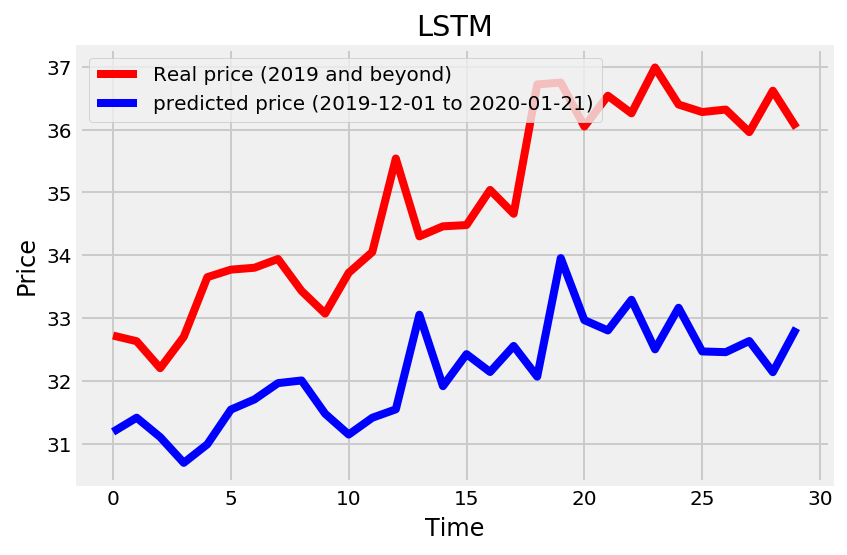

In [92]:
plt.plot(y_test, color='red', label='Real price (2019 and beyond)')
plt.plot(LSTM_predicted_stock_price, color='blue', label='predicted price (2019-12-01 to 2020-01-21)')
plt.title('LSTM')
plt.xlabel('Time')
plt.ylabel('Price')
plt.legend()
plt.show()

In [57]:
LSTM_rmse = mean_squared_error(test_set, LSTM_predicted_stock_price)
print ("root mean squared error is {}.".format(LSTM_rmse))


root mean squared error is 8.112332664725722.


In [66]:
regressorGRU = Sequential()
regressorGRU.add(GRU(units=50, return_sequences=True, input_shape=(X_train.shape[1],1)))
regressorGRU.add(Dropout(0.2))
regressorGRU.add(GRU(units=50, return_sequences=True))
regressorGRU.add(Dropout(0.2))
regressorGRU.add(GRU(units=50, return_sequences=True))
regressorGRU.add(Dropout(0.2))
regressorGRU.add(GRU(units=50))
regressorGRU.add(Dropout(0.2))
regressorGRU.add(Dense(units=1))
regressorGRU.compile(optimizer='adam', loss='mean_squared_error')
regressorGRU.fit(X_train, y_train, epochs=50, batch_size=32)

# serialize model to JSON
model_json = regressorGRU.to_json()
with open("model.json", "w") as json_file:
    json_file.write(model_json)
# serialize weights to HDF5
regressorGRU.save_weights("model.h5")
print("Saved model to disk")


Epoch 1/50
6996/6996 [==============================] - 149s 21ms/step - loss: 0.0077
Epoch 2/50
6996/6996 [==============================] - 145s 21ms/step - loss: 0.0027
Epoch 3/50
6996/6996 [==============================] - 145s 21ms/step - loss: 0.0022
Epoch 4/50
6996/6996 [==============================] - 146s 21ms/step - loss: 0.0020
Epoch 5/50
6996/6996 [==============================] - 145s 21ms/step - loss: 0.0018
Epoch 6/50
6996/6996 [==============================] - 145s 21ms/step - loss: 0.0016
Epoch 7/50
6996/6996 [==============================] - 144s 21ms/step - loss: 0.0015
Epoch 8/50
6996/6996 [==============================] - 144s 21ms/step - loss: 0.0014
Epoch 9/50
6996/6996 [==============================] - 143s 20ms/step - loss: 0.0013
Epoch 10/50
6996/6996 [==============================] - 144s 21ms/step - loss: 0.0014
Epoch 11/50
6996/6996 [==============================] - 144s 21ms/step - loss: 0.0012
Epoch 12/50
6996/6996 [=============================

In [58]:
X_test = []
for i in range(60, 282):
    X_test.append(inputs[i-60:i,0])
X_test = np.array(X_test)
X_test = np.reshape(X_test, (X_test.shape[0], X_test.shape[1],1))
GRU_predicted_stock_price = regressorGRU.predict(X_test)
GRU_predicted_stock_price = sc.inverse_transform(GRU_predicted_stock_price)

In [65]:
BiLSTM_rmse = math.sqrt(mean_squared_error(test_set, BiLSTM_predicted_stock_price))
print ("root mean squared error is {}.".format(BiLSTM_rmse))

root mean squared error is 4.504284402842843.


In [ ]:
epochs is 150
batch_size:32
units num:80